# Task 1 : Set up colab gpu runtime environment

In [ ]:
!pip install segmentation-models-pytorch
!pip install -U git+https://github.com/albumentations-team/albumentations
!pip install --upgrade opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 kB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 24.9 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16444 sha256=7d76817f93d71d8913bd3923080048d87e86135e7f94478a8c2a01a3020b12b7
  Stored in directory: /root/.cache/pip/wheels/29/16/24/752e89d88d333af39a288421e64d613b5f652918e39ef1f8e3
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60962 sha256=2e3be29a24a4e8444e9043eec1e886db098bde619c5ba998587012e40079736b
  Stored in directory: /root/.cache/pip/w

# Download Dataset

original author of the dataset :
https://github.com/VikramShenoy97/Human-Segmentation-Dataset


In [ ]:
!git clone https://github.com/parth1620/Human-Segmentation-Dataset-master.git

Cloning into 'Human-Segmentation-Dataset-master'...
remote: Enumerating objects: 592, done.
remote: Counting objects: 100% (592/592), done.
remote: Compressing objects: 100% (591/591), done.
remote: Total 592 (delta 3), reused 587 (delta 1), pack-reused 0
Receiving objects: 100% (592/592), 13.60 MiB | 18.64 MiB/s, done.
Resolving deltas: 100% (3/3), done.


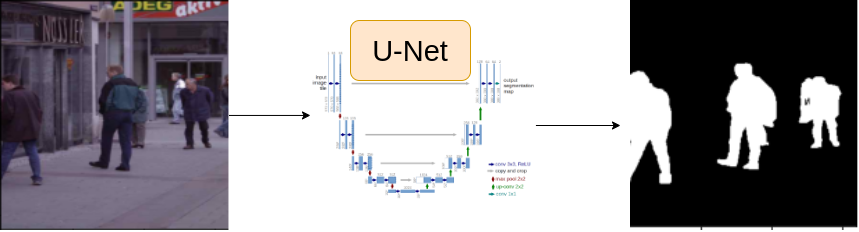

# Some Common Imports

In [ ]:
!gdown 1Fa7QJZn8s60PFHvjmmOT9pLWUDEm_N-B

Downloading...
From: https://drive.google.com/uc?id=1Fa7QJZn8s60PFHvjmmOT9pLWUDEm_N-B
To: /content/hurricane-michael.zip
100% 1.08G/1.08G [00:04<00:00, 243MB/s]


In [ ]:
!unzip hurricane-michael

Archive:  hurricane-michael.zip
   creating: hurricane-michael/images/
  inflating: hurricane-michael/images/hurricane-michael_00000000_post_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000000_pre_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000001_post_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000001_pre_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000003_post_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000003_pre_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000004_post_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000004_pre_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000005_post_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000005_pre_disaster.png  
  inflating: hurricane-michael/images/hurricane-michael_00000008_post_disaster.png  

In [ ]:
import numpy as np
import pandas as pd
import os
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict
import json
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy

%matplotlib inline

In [ ]:
labels_generator = Path('/content/hurricane-michael').rglob(pattern=f'*post_*.json')

NameError: ignored

In [ ]:
def get_disaster_dict(labels_generator):
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [ ]:
disaster_dict = get_disaster_dict(labels_generator)

In [ ]:
disaster_dict.keys()

dict_keys(['hurricane-michael'])

In [ ]:
disaster_labels = disaster_dict['hurricane-michael']

In [ ]:
damage_dict2 = {
    "no-damage": (0, 255, 0, 100),
    "minor-damage": (0, 255, 255, 100),
    "major-damage": (0, 0, 255, 100),
    "destroyed": (255, 0, 0, 100),
    "un-classified": (0, 0, 0, 100)
}

In [ ]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [ ]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [ ]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:

            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict2[damage])

        del draw

In [ ]:
%cd hurricane-michael/

/content/hurricane-michael


In [ ]:
!mkdir Post_Images

In [ ]:
!mkdir Annotated_Images2

In [ ]:
images_list=[]

In [ ]:
mask_list = []

In [ ]:
!mkdir Patches_test_images2
!mkdir Patches_test_masks2
!mkdir Patches_train_images2
!mkdir Patches_train_masks2

In [ ]:
import PIL

In [ ]:
def display_img(json_path, time='post', annotated=True):

    img_path = json_path.replace('labels', 'images').replace('json','png')

    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']

    print(img_name)
    images_list.append(img_name)
    mask_list.append(f'{img_name}_annotated.png')
    img = Image.open(img_path)
    img.save(f'/content/hurricane-michael/Post_Images/{img_name}')
    img = Image.new(mode='RGB', size = (1024,1024))




    draw = ImageDraw.Draw(img, 'RGB')

    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [ ]:
def plot_image(label):

    # read images

    img_B = display_img(label, time='post', annotated=False)

    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(1,2)

    TITLE_FONT_SIZE = 10

    ax[0].imshow(img_B);
    ax[0].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)

    ax[1].imshow(img_D);
    ax[1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [ ]:
for disaster_label in disaster_labels:
  img = display_img(disaster_label, time='post', annotated=True)
  img_path = disaster_label.replace('labels', 'images').replace('json','png')
  image_json = read_label(disaster_label)
  img_name = image_json['metadata']['img_name']
  img.save(f'/content/hurricane-michael/Annotated_Images2/{img_name}_annotated.png')

hurricane-michael_00000301_post_disaster.png
hurricane-michael_00000268_post_disaster.png
hurricane-michael_00000053_post_disaster.png
hurricane-michael_00000389_post_disaster.png
hurricane-michael_00000234_post_disaster.png
hurricane-michael_00000025_post_disaster.png
hurricane-michael_00000539_post_disaster.png
hurricane-michael_00000329_post_disaster.png
hurricane-michael_00000134_post_disaster.png
hurricane-michael_00000061_post_disaster.png
hurricane-michael_00000273_post_disaster.png
hurricane-michael_00000225_post_disaster.png
hurricane-michael_00000150_post_disaster.png
hurricane-michael_00000152_post_disaster.png
hurricane-michael_00000046_post_disaster.png
hurricane-michael_00000524_post_disaster.png
hurricane-michael_00000184_post_disaster.png
hurricane-michael_00000522_post_disaster.png
hurricane-michael_00000538_post_disaster.png
hurricane-michael_00000486_post_disaster.png
hurricane-michael_00000485_post_disaster.png
hurricane-michael_00000341_post_disaster.png
hurricane-

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
images_list = sorted(images_list)
mask_list = sorted(mask_list)

In [ ]:
!pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import patchify

In [ ]:
import os
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
from patchify import patchify
from glob import glob
from tqdm import tqdm
from sklearn.model_selection import train_test_split

def extract_patches(image_list, mask_src, image_src, mask_dst, image_dst, patch_size):

    for im in tqdm(image_list):
        """ read image and mask then extract patches and diregard patches with no label"""
        img = cv2.imread(os.path.join(image_src, im))

        im2 = f'{im}_annotated.png'
        print(im2)
        msk = cv2.imread(os.path.join(mask_src, im2))
        img_patches = patchify(img, (patch_size, patch_size,3), step=patch_size)
        mask_patches = patchify(msk, (patch_size, patch_size, 3), step=patch_size)
        img_patches =img_patches.reshape((-1, patch_size, patch_size,3))
        mask_patches =mask_patches.reshape((-1, patch_size, patch_size, 3))
        #Step=256 for patch_sie patches means no overlap
        for i in range(img_patches.shape[0]):
            mask_patch = mask_patches[i]
            outside = np.all(mask_patch == 0)
            if not outside:
                img_patch = img_patches[i]
                filename = im.split(".png")[0] + "_" + str(i) + ".png"
#                 mask_file= os.path.join(mask_src, filename)
                cv2.imwrite(os.path.join(image_dst, filename), img_patch)
                cv2.imwrite(os.path.join(mask_dst, filename), mask_patch)



df = pd.DataFrame(list(zip(images_list, mask_list)),
               columns =['images', 'masks'])
train_df, test_df= train_test_split(df, test_size=0.2, random_state=42)

image_path='/content/hurricane-michael/Post_Images'
mask_path = '/content/hurricane-michael/Annotated_Images2'
image_list=train_df.images.values.tolist()
mask_src=mask_path
image_src = image_path
mask_dst= '/content/hurricane-michael/Patches_train_masks2'
image_dst ='/content/hurricane-michael/Patches_train_images2'
patch_size =512
extract_patches(image_list, mask_src, image_src, mask_dst, image_dst, patch_size)

image_list=test_df.images.values.tolist()
mask_src=mask_path
image_src = image_path
mask_dst= '/content/hurricane-michael/Patches_test_masks2'
image_dst ='/content/hurricane-michael/Patches_test_images2'
patch_size =512
extract_patches(image_list, mask_src, image_src, mask_dst, image_dst, patch_size)

  0%|          | 1/274 [00:00<00:29,  9.17it/s]

hurricane-michael_00000188_post_disaster.png_annotated.png
hurricane-michael_00000010_post_disaster.png_annotated.png
hurricane-michael_00000225_post_disaster.png_annotated.png


  1%|▏         | 4/274 [00:00<00:28,  9.34it/s]

hurricane-michael_00000536_post_disaster.png_annotated.png
hurricane-michael_00000494_post_disaster.png_annotated.png


  2%|▏         | 6/274 [00:00<00:32,  8.14it/s]

hurricane-michael_00000487_post_disaster.png_annotated.png
hurricane-michael_00000125_post_disaster.png_annotated.png


  3%|▎         | 7/274 [00:00<00:33,  7.92it/s]

hurricane-michael_00000522_post_disaster.png_annotated.png
hurricane-michael_00000330_post_disaster.png_annotated.png


  4%|▎         | 10/274 [00:01<00:35,  7.48it/s]

hurricane-michael_00000527_post_disaster.png_annotated.png
hurricane-michael_00000096_post_disaster.png_annotated.png


  4%|▍         | 12/274 [00:01<00:32,  8.01it/s]

hurricane-michael_00000165_post_disaster.png_annotated.png
hurricane-michael_00000371_post_disaster.png_annotated.png


  5%|▌         | 14/274 [00:01<00:34,  7.51it/s]

hurricane-michael_00000153_post_disaster.png_annotated.png


  5%|▌         | 15/274 [00:01<00:38,  6.80it/s]

hurricane-michael_00000460_post_disaster.png_annotated.png
hurricane-michael_00000243_post_disaster.png_annotated.png


  7%|▋         | 18/274 [00:02<00:33,  7.63it/s]

hurricane-michael_00000025_post_disaster.png_annotated.png
hurricane-michael_00000039_post_disaster.png_annotated.png
hurricane-michael_00000523_post_disaster.png_annotated.png


  7%|▋         | 20/274 [00:02<00:38,  6.62it/s]

hurricane-michael_00000236_post_disaster.png_annotated.png
hurricane-michael_00000328_post_disaster.png_annotated.png


  8%|▊         | 22/274 [00:02<00:40,  6.30it/s]

hurricane-michael_00000406_post_disaster.png_annotated.png
hurricane-michael_00000543_post_disaster.png_annotated.png


  9%|▉         | 25/274 [00:03<00:35,  6.96it/s]

hurricane-michael_00000379_post_disaster.png_annotated.png
hurricane-michael_00000403_post_disaster.png_annotated.png


  9%|▉         | 26/274 [00:03<00:37,  6.55it/s]

hurricane-michael_00000249_post_disaster.png_annotated.png
hurricane-michael_00000331_post_disaster.png_annotated.png


 11%|█         | 29/274 [00:04<00:35,  6.89it/s]

hurricane-michael_00000029_post_disaster.png_annotated.png
hurricane-michael_00000309_post_disaster.png_annotated.png


 11%|█         | 30/274 [00:04<00:37,  6.49it/s]

hurricane-michael_00000133_post_disaster.png_annotated.png
hurricane-michael_00000306_post_disaster.png_annotated.png


 12%|█▏        | 33/274 [00:04<00:31,  7.67it/s]

hurricane-michael_00000028_post_disaster.png_annotated.png
hurricane-michael_00000231_post_disaster.png_annotated.png


 12%|█▏        | 34/274 [00:04<00:30,  7.78it/s]

hurricane-michael_00000422_post_disaster.png_annotated.png
hurricane-michael_00000047_post_disaster.png_annotated.png


 13%|█▎        | 36/274 [00:04<00:28,  8.26it/s]

hurricane-michael_00000388_post_disaster.png_annotated.png
hurricane-michael_00000356_post_disaster.png_annotated.png


 14%|█▍        | 39/274 [00:05<00:28,  8.26it/s]

hurricane-michael_00000284_post_disaster.png_annotated.png
hurricane-michael_00000402_post_disaster.png_annotated.png


 15%|█▍        | 41/274 [00:05<00:27,  8.40it/s]

hurricane-michael_00000529_post_disaster.png_annotated.png
hurricane-michael_00000251_post_disaster.png_annotated.png


 15%|█▌        | 42/274 [00:05<00:27,  8.50it/s]

hurricane-michael_00000094_post_disaster.png_annotated.png
hurricane-michael_00000183_post_disaster.png_annotated.png
hurricane-michael_00000217_post_disaster.png_annotated.png


 17%|█▋        | 46/274 [00:06<00:25,  8.93it/s]

hurricane-michael_00000021_post_disaster.png_annotated.png
hurricane-michael_00000009_post_disaster.png_annotated.png


 17%|█▋        | 47/274 [00:06<00:26,  8.70it/s]

hurricane-michael_00000528_post_disaster.png_annotated.png
hurricane-michael_00000345_post_disaster.png_annotated.png


 18%|█▊        | 49/274 [00:06<00:25,  8.97it/s]

hurricane-michael_00000152_post_disaster.png_annotated.png
hurricane-michael_00000046_post_disaster.png_annotated.png


 19%|█▊        | 51/274 [00:06<00:25,  8.92it/s]

hurricane-michael_00000036_post_disaster.png_annotated.png
hurricane-michael_00000474_post_disaster.png_annotated.png


 19%|█▉        | 53/274 [00:06<00:29,  7.57it/s]

hurricane-michael_00000489_post_disaster.png_annotated.png
hurricane-michael_00000090_post_disaster.png_annotated.png


 20%|██        | 55/274 [00:07<00:28,  7.72it/s]

hurricane-michael_00000343_post_disaster.png_annotated.png
hurricane-michael_00000013_post_disaster.png_annotated.png
hurricane-michael_00000359_post_disaster.png_annotated.png


 21%|██        | 58/274 [00:07<00:25,  8.47it/s]

hurricane-michael_00000486_post_disaster.png_annotated.png
hurricane-michael_00000135_post_disaster.png_annotated.png


 22%|██▏       | 60/274 [00:07<00:25,  8.34it/s]

hurricane-michael_00000265_post_disaster.png_annotated.png
hurricane-michael_00000455_post_disaster.png_annotated.png


 23%|██▎       | 62/274 [00:07<00:25,  8.24it/s]

hurricane-michael_00000267_post_disaster.png_annotated.png
hurricane-michael_00000271_post_disaster.png_annotated.png


 23%|██▎       | 64/274 [00:08<00:30,  6.93it/s]

hurricane-michael_00000347_post_disaster.png_annotated.png
hurricane-michael_00000290_post_disaster.png_annotated.png


 24%|██▍       | 67/274 [00:08<00:23,  8.63it/s]

hurricane-michael_00000151_post_disaster.png_annotated.png
hurricane-michael_00000109_post_disaster.png_annotated.png
hurricane-michael_00000344_post_disaster.png_annotated.png


 25%|██▌       | 69/274 [00:08<00:22,  9.14it/s]

hurricane-michael_00000156_post_disaster.png_annotated.png
hurricane-michael_00000416_post_disaster.png_annotated.png


 26%|██▌       | 71/274 [00:09<00:23,  8.81it/s]

hurricane-michael_00000157_post_disaster.png_annotated.png
hurricane-michael_00000292_post_disaster.png_annotated.png


 27%|██▋       | 74/274 [00:09<00:19, 10.02it/s]

hurricane-michael_00000104_post_disaster.png_annotated.png
hurricane-michael_00000038_post_disaster.png_annotated.png
hurricane-michael_00000053_post_disaster.png_annotated.png


 28%|██▊       | 76/274 [00:09<00:19,  9.98it/s]

hurricane-michael_00000238_post_disaster.png_annotated.png
hurricane-michael_00000204_post_disaster.png_annotated.png


 29%|██▉       | 79/274 [00:09<00:21,  9.05it/s]

hurricane-michael_00000103_post_disaster.png_annotated.png
hurricane-michael_00000490_post_disaster.png_annotated.png


 29%|██▉       | 80/274 [00:10<00:22,  8.68it/s]

hurricane-michael_00000377_post_disaster.png_annotated.png
hurricane-michael_00000207_post_disaster.png_annotated.png


 30%|███       | 83/274 [00:10<00:22,  8.48it/s]

hurricane-michael_00000240_post_disaster.png_annotated.png
hurricane-michael_00000296_post_disaster.png_annotated.png


 31%|███       | 85/274 [00:10<00:20,  9.06it/s]

hurricane-michael_00000143_post_disaster.png_annotated.png
hurricane-michael_00000472_post_disaster.png_annotated.png


 32%|███▏      | 87/274 [00:10<00:20,  9.10it/s]

hurricane-michael_00000466_post_disaster.png_annotated.png
hurricane-michael_00000473_post_disaster.png_annotated.png


 32%|███▏      | 88/274 [00:10<00:20,  8.93it/s]

hurricane-michael_00000257_post_disaster.png_annotated.png
hurricane-michael_00000415_post_disaster.png_annotated.png


 33%|███▎      | 90/274 [00:11<00:20,  9.07it/s]

hurricane-michael_00000521_post_disaster.png_annotated.png
hurricane-michael_00000515_post_disaster.png_annotated.png


 34%|███▍      | 93/274 [00:11<00:19,  9.15it/s]

hurricane-michael_00000269_post_disaster.png_annotated.png
hurricane-michael_00000360_post_disaster.png_annotated.png


 34%|███▍      | 94/274 [00:11<00:20,  8.92it/s]

hurricane-michael_00000212_post_disaster.png_annotated.png
hurricane-michael_00000056_post_disaster.png_annotated.png


 35%|███▌      | 96/274 [00:11<00:20,  8.48it/s]

hurricane-michael_00000516_post_disaster.png_annotated.png
hurricane-michael_00000389_post_disaster.png_annotated.png


 36%|███▌      | 99/274 [00:12<00:19,  8.97it/s]

hurricane-michael_00000285_post_disaster.png_annotated.png
hurricane-michael_00000184_post_disaster.png_annotated.png


 36%|███▋      | 100/274 [00:12<00:19,  8.80it/s]

hurricane-michael_00000454_post_disaster.png_annotated.png
hurricane-michael_00000349_post_disaster.png_annotated.png
hurricane-michael_00000195_post_disaster.png_annotated.png


 38%|███▊      | 103/274 [00:12<00:18,  9.28it/s]

hurricane-michael_00000512_post_disaster.png_annotated.png
hurricane-michael_00000538_post_disaster.png_annotated.png
hurricane-michael_00000386_post_disaster.png_annotated.png


 39%|███▉      | 107/274 [00:12<00:17,  9.70it/s]

hurricane-michael_00000501_post_disaster.png_annotated.png
hurricane-michael_00000266_post_disaster.png_annotated.png


 39%|███▉      | 108/274 [00:13<00:18,  9.21it/s]

hurricane-michael_00000311_post_disaster.png_annotated.png
hurricane-michael_00000351_post_disaster.png_annotated.png


 40%|████      | 110/274 [00:13<00:19,  8.51it/s]

hurricane-michael_00000250_post_disaster.png_annotated.png
hurricane-michael_00000355_post_disaster.png_annotated.png


 41%|████      | 112/274 [00:13<00:22,  7.32it/s]

hurricane-michael_00000003_post_disaster.png_annotated.png
hurricane-michael_00000189_post_disaster.png_annotated.png


 42%|████▏     | 114/274 [00:14<00:23,  6.81it/s]

hurricane-michael_00000310_post_disaster.png_annotated.png
hurricane-michael_00000443_post_disaster.png_annotated.png


 42%|████▏     | 116/274 [00:14<00:27,  5.67it/s]

hurricane-michael_00000200_post_disaster.png_annotated.png
hurricane-michael_00000485_post_disaster.png_annotated.png


 43%|████▎     | 117/274 [00:14<00:35,  4.46it/s]

hurricane-michael_00000482_post_disaster.png_annotated.png


 43%|████▎     | 118/274 [00:15<00:46,  3.33it/s]

hurricane-michael_00000210_post_disaster.png_annotated.png


 43%|████▎     | 119/274 [00:15<00:55,  2.79it/s]

hurricane-michael_00000120_post_disaster.png_annotated.png


 44%|████▍     | 120/274 [00:16<01:01,  2.50it/s]

hurricane-michael_00000451_post_disaster.png_annotated.png


 44%|████▍     | 121/274 [00:16<01:00,  2.52it/s]

hurricane-michael_00000045_post_disaster.png_annotated.png


 45%|████▍     | 122/274 [00:16<00:57,  2.63it/s]

hurricane-michael_00000137_post_disaster.png_annotated.png


 45%|████▌     | 124/274 [00:17<00:53,  2.82it/s]

hurricane-michael_00000462_post_disaster.png_annotated.png


 46%|████▌     | 125/274 [00:17<00:50,  2.96it/s]

hurricane-michael_00000175_post_disaster.png_annotated.png
hurricane-michael_00000308_post_disaster.png_annotated.png


 46%|████▌     | 126/274 [00:18<00:53,  2.78it/s]

hurricane-michael_00000319_post_disaster.png_annotated.png


 46%|████▋     | 127/274 [00:18<00:56,  2.61it/s]

hurricane-michael_00000219_post_disaster.png_annotated.png


 47%|████▋     | 128/274 [00:19<01:01,  2.38it/s]

hurricane-michael_00000295_post_disaster.png_annotated.png


 47%|████▋     | 130/274 [00:20<00:56,  2.56it/s]

hurricane-michael_00000393_post_disaster.png_annotated.png
hurricane-michael_00000067_post_disaster.png_annotated.png


 48%|████▊     | 131/274 [00:20<00:55,  2.55it/s]

hurricane-michael_00000511_post_disaster.png_annotated.png


 49%|████▊     | 133/274 [00:21<00:46,  3.00it/s]

hurricane-michael_00000101_post_disaster.png_annotated.png


 49%|████▉     | 134/274 [00:21<00:41,  3.40it/s]

hurricane-michael_00000410_post_disaster.png_annotated.png
hurricane-michael_00000142_post_disaster.png_annotated.png


 50%|████▉     | 136/274 [00:21<00:34,  4.02it/s]

hurricane-michael_00000299_post_disaster.png_annotated.png
hurricane-michael_00000110_post_disaster.png_annotated.png


 50%|█████     | 138/274 [00:22<00:38,  3.56it/s]

hurricane-michael_00000258_post_disaster.png_annotated.png


 51%|█████     | 139/274 [00:22<00:35,  3.83it/s]

hurricane-michael_00000016_post_disaster.png_annotated.png
hurricane-michael_00000051_post_disaster.png_annotated.png


 51%|█████▏    | 141/274 [00:22<00:29,  4.47it/s]

hurricane-michael_00000044_post_disaster.png_annotated.png
hurricane-michael_00000273_post_disaster.png_annotated.png


 52%|█████▏    | 143/274 [00:23<00:23,  5.52it/s]

hurricane-michael_00000234_post_disaster.png_annotated.png
hurricane-michael_00000392_post_disaster.png_annotated.png


 53%|█████▎    | 145/274 [00:23<00:25,  5.03it/s]

hurricane-michael_00000216_post_disaster.png_annotated.png
hurricane-michael_00000441_post_disaster.png_annotated.png


 54%|█████▎    | 147/274 [00:24<00:26,  4.83it/s]

hurricane-michael_00000081_post_disaster.png_annotated.png
hurricane-michael_00000154_post_disaster.png_annotated.png


 54%|█████▍    | 149/274 [00:24<00:25,  4.94it/s]

hurricane-michael_00000417_post_disaster.png_annotated.png


 55%|█████▍    | 150/274 [00:24<00:25,  4.92it/s]

hurricane-michael_00000287_post_disaster.png_annotated.png


 55%|█████▌    | 151/274 [00:24<00:27,  4.45it/s]

hurricane-michael_00000323_post_disaster.png_annotated.png


 55%|█████▌    | 152/274 [00:25<00:27,  4.36it/s]

hurricane-michael_00000205_post_disaster.png_annotated.png


 56%|█████▌    | 153/274 [00:25<00:27,  4.35it/s]

hurricane-michael_00000060_post_disaster.png_annotated.png


 56%|█████▌    | 154/274 [00:25<00:27,  4.31it/s]

hurricane-michael_00000146_post_disaster.png_annotated.png


 57%|█████▋    | 155/274 [00:25<00:27,  4.27it/s]

hurricane-michael_00000427_post_disaster.png_annotated.png


 57%|█████▋    | 156/274 [00:25<00:23,  4.92it/s]

hurricane-michael_00000325_post_disaster.png_annotated.png
hurricane-michael_00000224_post_disaster.png_annotated.png


 57%|█████▋    | 157/274 [00:26<00:26,  4.49it/s]

hurricane-michael_00000041_post_disaster.png_annotated.png


 58%|█████▊    | 159/274 [00:26<00:27,  4.11it/s]

hurricane-michael_00000541_post_disaster.png_annotated.png
hurricane-michael_00000233_post_disaster.png_annotated.png


 59%|█████▉    | 161/274 [00:27<00:24,  4.56it/s]

hurricane-michael_00000463_post_disaster.png_annotated.png


 59%|█████▉    | 162/274 [00:27<00:20,  5.40it/s]

hurricane-michael_00000005_post_disaster.png_annotated.png
hurricane-michael_00000000_post_disaster.png_annotated.png


 59%|█████▉    | 163/274 [00:27<00:20,  5.34it/s]

hurricane-michael_00000498_post_disaster.png_annotated.png


 60%|█████▉    | 164/274 [00:27<00:27,  4.03it/s]

hurricane-michael_00000524_post_disaster.png_annotated.png


 61%|██████    | 166/274 [00:28<00:25,  4.23it/s]

hurricane-michael_00000502_post_disaster.png_annotated.png
hurricane-michael_00000162_post_disaster.png_annotated.png


 61%|██████▏   | 168/274 [00:29<00:29,  3.62it/s]

hurricane-michael_00000353_post_disaster.png_annotated.png
hurricane-michael_00000305_post_disaster.png_annotated.png


 62%|██████▏   | 169/274 [00:29<00:31,  3.35it/s]

hurricane-michael_00000479_post_disaster.png_annotated.png


 62%|██████▏   | 171/274 [00:29<00:29,  3.46it/s]

hurricane-michael_00000341_post_disaster.png_annotated.png


 63%|██████▎   | 172/274 [00:30<00:30,  3.38it/s]

hurricane-michael_00000334_post_disaster.png_annotated.png
hurricane-michael_00000167_post_disaster.png_annotated.png


 63%|██████▎   | 173/274 [00:30<00:29,  3.45it/s]

hurricane-michael_00000275_post_disaster.png_annotated.png


 64%|██████▍   | 175/274 [00:31<00:28,  3.46it/s]

hurricane-michael_00000158_post_disaster.png_annotated.png


 64%|██████▍   | 176/274 [00:31<00:25,  3.87it/s]

hurricane-michael_00000052_post_disaster.png_annotated.png
hurricane-michael_00000338_post_disaster.png_annotated.png


 65%|██████▍   | 178/274 [00:31<00:19,  4.90it/s]

hurricane-michael_00000097_post_disaster.png_annotated.png
hurricane-michael_00000246_post_disaster.png_annotated.png


 66%|██████▌   | 180/274 [00:32<00:21,  4.34it/s]

hurricane-michael_00000391_post_disaster.png_annotated.png
hurricane-michael_00000075_post_disaster.png_annotated.png


 66%|██████▋   | 182/274 [00:32<00:18,  4.92it/s]

hurricane-michael_00000048_post_disaster.png_annotated.png
hurricane-michael_00000461_post_disaster.png_annotated.png


 67%|██████▋   | 183/274 [00:32<00:18,  4.89it/s]

hurricane-michael_00000014_post_disaster.png_annotated.png


 68%|██████▊   | 185/274 [00:33<00:18,  4.91it/s]

hurricane-michael_00000546_post_disaster.png_annotated.png
hurricane-michael_00000313_post_disaster.png_annotated.png


 68%|██████▊   | 187/274 [00:33<00:14,  6.08it/s]

hurricane-michael_00000496_post_disaster.png_annotated.png
hurricane-michael_00000043_post_disaster.png_annotated.png


 69%|██████▉   | 189/274 [00:33<00:12,  7.01it/s]

hurricane-michael_00000458_post_disaster.png_annotated.png
hurricane-michael_00000358_post_disaster.png_annotated.png


 70%|███████   | 192/274 [00:33<00:09,  8.58it/s]

hurricane-michael_00000263_post_disaster.png_annotated.png
hurricane-michael_00000475_post_disaster.png_annotated.png
hurricane-michael_00000228_post_disaster.png_annotated.png


 71%|███████   | 194/274 [00:34<00:08,  9.06it/s]

hurricane-michael_00000098_post_disaster.png_annotated.png
hurricane-michael_00000222_post_disaster.png_annotated.png


 72%|███████▏  | 196/274 [00:34<00:09,  8.55it/s]

hurricane-michael_00000211_post_disaster.png_annotated.png
hurricane-michael_00000011_post_disaster.png_annotated.png


 72%|███████▏  | 198/274 [00:34<00:09,  8.42it/s]

hurricane-michael_00000100_post_disaster.png_annotated.png
hurricane-michael_00000020_post_disaster.png_annotated.png
hurricane-michael_00000252_post_disaster.png_annotated.png


 73%|███████▎  | 201/274 [00:34<00:07,  9.25it/s]

hurricane-michael_00000059_post_disaster.png_annotated.png
hurricane-michael_00000509_post_disaster.png_annotated.png


 74%|███████▍  | 203/274 [00:35<00:08,  8.33it/s]

hurricane-michael_00000452_post_disaster.png_annotated.png
hurricane-michael_00000339_post_disaster.png_annotated.png


 75%|███████▍  | 205/274 [00:35<00:08,  7.84it/s]

hurricane-michael_00000484_post_disaster.png_annotated.png
hurricane-michael_00000367_post_disaster.png_annotated.png


 76%|███████▌  | 207/274 [00:35<00:08,  7.65it/s]

hurricane-michael_00000326_post_disaster.png_annotated.png
hurricane-michael_00000333_post_disaster.png_annotated.png


 76%|███████▋  | 209/274 [00:35<00:08,  7.91it/s]

hurricane-michael_00000504_post_disaster.png_annotated.png
hurricane-michael_00000404_post_disaster.png_annotated.png


 77%|███████▋  | 211/274 [00:36<00:07,  7.90it/s]

hurricane-michael_00000539_post_disaster.png_annotated.png
hurricane-michael_00000519_post_disaster.png_annotated.png


 78%|███████▊  | 213/274 [00:36<00:07,  7.95it/s]

hurricane-michael_00000435_post_disaster.png_annotated.png
hurricane-michael_00000315_post_disaster.png_annotated.png


 78%|███████▊  | 215/274 [00:36<00:07,  7.80it/s]

hurricane-michael_00000261_post_disaster.png_annotated.png
hurricane-michael_00000066_post_disaster.png_annotated.png


 79%|███████▉  | 217/274 [00:36<00:06,  8.27it/s]

hurricane-michael_00000340_post_disaster.png_annotated.png
hurricane-michael_00000303_post_disaster.png_annotated.png


 80%|███████▉  | 219/274 [00:37<00:06,  8.04it/s]

hurricane-michael_00000413_post_disaster.png_annotated.png
hurricane-michael_00000172_post_disaster.png_annotated.png


 81%|████████  | 221/274 [00:37<00:06,  8.01it/s]

hurricane-michael_00000085_post_disaster.png_annotated.png
hurricane-michael_00000001_post_disaster.png_annotated.png


 81%|████████▏ | 223/274 [00:37<00:06,  8.19it/s]

hurricane-michael_00000077_post_disaster.png_annotated.png
hurricane-michael_00000134_post_disaster.png_annotated.png


 82%|████████▏ | 226/274 [00:38<00:05,  9.02it/s]

hurricane-michael_00000324_post_disaster.png_annotated.png
hurricane-michael_00000050_post_disaster.png_annotated.png


 83%|████████▎ | 228/274 [00:38<00:04,  9.56it/s]

hurricane-michael_00000419_post_disaster.png_annotated.png
hurricane-michael_00000150_post_disaster.png_annotated.png
hurricane-michael_00000083_post_disaster.png_annotated.png


 85%|████████▍ | 232/274 [00:38<00:03, 11.30it/s]

hurricane-michael_00000421_post_disaster.png_annotated.png
hurricane-michael_00000380_post_disaster.png_annotated.png
hurricane-michael_00000017_post_disaster.png_annotated.png


 85%|████████▌ | 234/274 [00:38<00:03, 10.40it/s]

hurricane-michael_00000145_post_disaster.png_annotated.png
hurricane-michael_00000442_post_disaster.png_annotated.png


 86%|████████▌ | 236/274 [00:39<00:04,  9.40it/s]

hurricane-michael_00000268_post_disaster.png_annotated.png
hurricane-michael_00000542_post_disaster.png_annotated.png


 87%|████████▋ | 238/274 [00:39<00:03,  9.01it/s]

hurricane-michael_00000220_post_disaster.png_annotated.png
hurricane-michael_00000497_post_disaster.png_annotated.png


 88%|████████▊ | 240/274 [00:39<00:03,  9.69it/s]

hurricane-michael_00000530_post_disaster.png_annotated.png
hurricane-michael_00000387_post_disaster.png_annotated.png
hurricane-michael_00000087_post_disaster.png_annotated.png


 88%|████████▊ | 242/274 [00:39<00:03,  8.73it/s]

hurricane-michael_00000078_post_disaster.png_annotated.png
hurricane-michael_00000283_post_disaster.png_annotated.png


 89%|████████▉ | 244/274 [00:39<00:03,  8.32it/s]

hurricane-michael_00000302_post_disaster.png_annotated.png
hurricane-michael_00000548_post_disaster.png_annotated.png


 90%|████████▉ | 246/274 [00:40<00:03,  8.17it/s]

hurricane-michael_00000300_post_disaster.png_annotated.png
hurricane-michael_00000272_post_disaster.png_annotated.png


 91%|█████████ | 249/274 [00:40<00:02,  9.74it/s]

hurricane-michael_00000093_post_disaster.png_annotated.png
hurricane-michael_00000076_post_disaster.png_annotated.png
hurricane-michael_00000365_post_disaster.png_annotated.png


 92%|█████████▏| 251/274 [00:40<00:02,  8.99it/s]

hurricane-michael_00000405_post_disaster.png_annotated.png
hurricane-michael_00000035_post_disaster.png_annotated.png


 92%|█████████▏| 253/274 [00:41<00:02,  7.61it/s]

hurricane-michael_00000505_post_disaster.png_annotated.png
hurricane-michael_00000260_post_disaster.png_annotated.png


 93%|█████████▎| 255/274 [00:41<00:02,  7.17it/s]

hurricane-michael_00000446_post_disaster.png_annotated.png
hurricane-michael_00000304_post_disaster.png_annotated.png


 94%|█████████▍| 257/274 [00:41<00:02,  6.17it/s]

hurricane-michael_00000476_post_disaster.png_annotated.png
hurricane-michael_00000411_post_disaster.png_annotated.png


 95%|█████████▍| 259/274 [00:42<00:02,  5.74it/s]

hurricane-michael_00000499_post_disaster.png_annotated.png
hurricane-michael_00000244_post_disaster.png_annotated.png


 95%|█████████▌| 261/274 [00:42<00:01,  6.56it/s]

hurricane-michael_00000214_post_disaster.png_annotated.png
hurricane-michael_00000247_post_disaster.png_annotated.png


 96%|█████████▌| 263/274 [00:42<00:01,  5.94it/s]

hurricane-michael_00000159_post_disaster.png_annotated.png
hurricane-michael_00000144_post_disaster.png_annotated.png


 97%|█████████▋| 265/274 [00:43<00:01,  6.12it/s]

hurricane-michael_00000535_post_disaster.png_annotated.png
hurricane-michael_00000337_post_disaster.png_annotated.png


 97%|█████████▋| 267/274 [00:43<00:01,  6.04it/s]

hurricane-michael_00000202_post_disaster.png_annotated.png
hurricane-michael_00000549_post_disaster.png_annotated.png


 98%|█████████▊| 269/274 [00:43<00:00,  6.50it/s]

hurricane-michael_00000034_post_disaster.png_annotated.png
hurricane-michael_00000301_post_disaster.png_annotated.png


 99%|█████████▉| 271/274 [00:43<00:00,  7.24it/s]

hurricane-michael_00000112_post_disaster.png_annotated.png
hurricane-michael_00000174_post_disaster.png_annotated.png
hurricane-michael_00000439_post_disaster.png_annotated.png


100%|██████████| 274/274 [00:44<00:00,  6.20it/s]


hurricane-michael_00000166_post_disaster.png_annotated.png


  0%|          | 0/69 [00:00<?, ?it/s]

hurricane-michael_00000369_post_disaster.png_annotated.png
hurricane-michael_00000192_post_disaster.png_annotated.png


  3%|▎         | 2/69 [00:00<00:05, 11.63it/s]

hurricane-michael_00000187_post_disaster.png_annotated.png
hurricane-michael_00000061_post_disaster.png_annotated.png


  6%|▌         | 4/69 [00:00<00:06,  9.43it/s]

hurricane-michael_00000208_post_disaster.png_annotated.png


  7%|▋         | 5/69 [00:00<00:07,  8.55it/s]

hurricane-michael_00000444_post_disaster.png_annotated.png


  9%|▊         | 6/69 [00:00<00:07,  8.39it/s]

hurricane-michael_00000293_post_disaster.png_annotated.png
hurricane-michael_00000289_post_disaster.png_annotated.png


 12%|█▏        | 8/69 [00:00<00:06,  9.24it/s]

hurricane-michael_00000547_post_disaster.png_annotated.png


 14%|█▍        | 10/69 [00:01<00:06,  9.41it/s]

hurricane-michael_00000040_post_disaster.png_annotated.png


 16%|█▌        | 11/69 [00:01<00:06,  9.05it/s]

hurricane-michael_00000206_post_disaster.png_annotated.png
hurricane-michael_00000348_post_disaster.png_annotated.png


 19%|█▉        | 13/69 [00:01<00:06,  8.68it/s]

hurricane-michael_00000480_post_disaster.png_annotated.png
hurricane-michael_00000430_post_disaster.png_annotated.png


 22%|██▏       | 15/69 [00:01<00:06,  8.69it/s]

hurricane-michael_00000180_post_disaster.png_annotated.png
hurricane-michael_00000248_post_disaster.png_annotated.png


 25%|██▍       | 17/69 [00:01<00:06,  8.28it/s]

hurricane-michael_00000196_post_disaster.png_annotated.png
hurricane-michael_00000241_post_disaster.png_annotated.png


 28%|██▊       | 19/69 [00:02<00:06,  8.16it/s]

hurricane-michael_00000253_post_disaster.png_annotated.png
hurricane-michael_00000012_post_disaster.png_annotated.png


 30%|███       | 21/69 [00:02<00:06,  7.98it/s]

hurricane-michael_00000322_post_disaster.png_annotated.png
hurricane-michael_00000088_post_disaster.png_annotated.png
hurricane-michael_00000492_post_disaster.png_annotated.png


 35%|███▍      | 24/69 [00:02<00:04,  9.29it/s]

hurricane-michael_00000199_post_disaster.png_annotated.png
hurricane-michael_00000239_post_disaster.png_annotated.png


 38%|███▊      | 26/69 [00:02<00:05,  8.42it/s]

hurricane-michael_00000147_post_disaster.png_annotated.png
hurricane-michael_00000177_post_disaster.png_annotated.png


 42%|████▏     | 29/69 [00:03<00:04,  8.96it/s]

hurricane-michael_00000276_post_disaster.png_annotated.png
hurricane-michael_00000230_post_disaster.png_annotated.png


 45%|████▍     | 31/69 [00:03<00:04,  9.17it/s]

hurricane-michael_00000514_post_disaster.png_annotated.png
hurricane-michael_00000286_post_disaster.png_annotated.png


 48%|████▊     | 33/69 [00:03<00:04,  8.89it/s]

hurricane-michael_00000058_post_disaster.png_annotated.png
hurricane-michael_00000170_post_disaster.png_annotated.png


 49%|████▉     | 34/69 [00:03<00:03,  8.96it/s]

hurricane-michael_00000409_post_disaster.png_annotated.png
hurricane-michael_00000130_post_disaster.png_annotated.png
hurricane-michael_00000008_post_disaster.png_annotated.png


 54%|█████▎    | 37/69 [00:04<00:03,  9.40it/s]

hurricane-michael_00000329_post_disaster.png_annotated.png
hurricane-michael_00000537_post_disaster.png_annotated.png


 57%|█████▋    | 39/69 [00:04<00:03,  8.85it/s]

hurricane-michael_00000181_post_disaster.png_annotated.png
hurricane-michael_00000124_post_disaster.png_annotated.png


 59%|█████▉    | 41/69 [00:04<00:03,  8.45it/s]

hurricane-michael_00000141_post_disaster.png_annotated.png
hurricane-michael_00000004_post_disaster.png_annotated.png


 62%|██████▏   | 43/69 [00:04<00:02,  9.40it/s]

hurricane-michael_00000408_post_disaster.png_annotated.png
hurricane-michael_00000412_post_disaster.png_annotated.png
hurricane-michael_00000072_post_disaster.png_annotated.png


 67%|██████▋   | 46/69 [00:05<00:02,  9.18it/s]

hurricane-michael_00000307_post_disaster.png_annotated.png
hurricane-michael_00000467_post_disaster.png_annotated.png


 70%|██████▉   | 48/69 [00:05<00:02,  8.68it/s]

hurricane-michael_00000424_post_disaster.png_annotated.png
hurricane-michael_00000119_post_disaster.png_annotated.png


 72%|███████▏  | 50/69 [00:05<00:02,  8.90it/s]

hurricane-michael_00000049_post_disaster.png_annotated.png
hurricane-michael_00000440_post_disaster.png_annotated.png


 75%|███████▌  | 52/69 [00:05<00:02,  8.30it/s]

hurricane-michael_00000294_post_disaster.png_annotated.png
hurricane-michael_00000361_post_disaster.png_annotated.png


 80%|███████▉  | 55/69 [00:06<00:01,  8.38it/s]

hurricane-michael_00000136_post_disaster.png_annotated.png
hurricane-michael_00000099_post_disaster.png_annotated.png


 83%|████████▎ | 57/69 [00:06<00:01,  8.71it/s]

hurricane-michael_00000312_post_disaster.png_annotated.png
hurricane-michael_00000092_post_disaster.png_annotated.png


 84%|████████▍ | 58/69 [00:06<00:01,  8.63it/s]

hurricane-michael_00000540_post_disaster.png_annotated.png
hurricane-michael_00000465_post_disaster.png_annotated.png


 87%|████████▋ | 60/69 [00:06<00:01,  8.28it/s]

hurricane-michael_00000068_post_disaster.png_annotated.png
hurricane-michael_00000357_post_disaster.png_annotated.png


 91%|█████████▏| 63/69 [00:07<00:00,  8.82it/s]

hurricane-michael_00000500_post_disaster.png_annotated.png
hurricane-michael_00000517_post_disaster.png_annotated.png


 93%|█████████▎| 64/69 [00:07<00:00,  8.72it/s]

hurricane-michael_00000362_post_disaster.png_annotated.png
hurricane-michael_00000281_post_disaster.png_annotated.png


 96%|█████████▌| 66/69 [00:07<00:00,  8.51it/s]

hurricane-michael_00000118_post_disaster.png_annotated.png
hurricane-michael_00000122_post_disaster.png_annotated.png
hurricane-michael_00000024_post_disaster.png_annotated.png


100%|██████████| 69/69 [00:07<00:00,  8.85it/s]

hurricane-michael_00000102_post_disaster.png_annotated.png


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
import cv2

from tqdm import tqdm

import torch
from torch.utils.data import Dataset, DataLoader

# import segmentation_models_pytorch as smp
# import torchsummary as summary

torch.set_default_dtype(torch.float32)

torch.backends.cudnn.benchmark = True

In [ ]:
paths_generator = Path('/content/hurricane-michael/Patches_train_images2').rglob(pattern=f'*.png')

In [ ]:
train_immages=[]

In [ ]:
for path in paths_generator:
        file_name = f'/content/hurricane-michael/Patches_train_images2/{path.name}'
        print(file_name)
        train_immages.append(file_name)

/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000238_post_disaster_0.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000207_post_disaster_0.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000324_post_disaster_0.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000391_post_disaster_1.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000442_post_disaster_3.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000511_post_disaster_1.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000461_post_disaster_1.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000451_post_disaster_2.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000152_post_disaster_0.png
/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000052_post_disaster_2.png
/content/hurricane-michael/Patches_train

In [ ]:
train_immages=sorted(train_immages)

In [ ]:
train_immages

['/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000000_post_disaster_0.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000000_post_disaster_2.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000000_post_disaster_3.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000001_post_disaster_0.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000001_post_disaster_1.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000001_post_disaster_2.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000001_post_disaster_3.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000003_post_disaster_0.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000003_post_disaster_2.png',
 '/content/hurricane-michael/Patches_train_images2/hurricane-michael_00000005_post_disaster_3.png',


In [ ]:
train_masks=[]

In [ ]:
paths_generator = Path('/content/hurricane-michael/Patches_train_masks2').rglob(pattern=f'*.png')
for path in paths_generator:
        file_name = f'/content/hurricane-michael/Patches_train_masks2/{path.name}'
        print(file_name)
        train_masks.append(file_name)

/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000238_post_disaster_0.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000207_post_disaster_0.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000324_post_disaster_0.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000391_post_disaster_1.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000442_post_disaster_3.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000511_post_disaster_1.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000461_post_disaster_1.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000451_post_disaster_2.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000152_post_disaster_0.png
/content/hurricane-michael/Patches_train_masks2/hurricane-michael_00000052_post_disaster_2.png
/content/hurricane-michael/Patches_train_masks2/hu

In [ ]:
train_masks = sorted(train_masks)

In [ ]:
test_masks=[]

In [ ]:
paths_generator = Path('/content/hurricane-michael/Patches_test_masks2').rglob(pattern=f'*.png')
for path in paths_generator:
        file_name = f'/content/hurricane-michael/Patches_test_masks2/{path.name}'
        print(file_name)
        test_masks.append(file_name)

/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000199_post_disaster_1.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000092_post_disaster_0.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000192_post_disaster_2.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000465_post_disaster_3.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000072_post_disaster_0.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000547_post_disaster_2.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000122_post_disaster_3.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000294_post_disaster_1.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000307_post_disaster_3.png
/content/hurricane-michael/Patches_test_masks2/hurricane-michael_00000239_post_disaster_3.png
/content/hurricane-michael/Patches_test_masks2/hurricane-mic

In [ ]:
test_images = []

In [ ]:
paths_generator = Path('/content/hurricane-michael/Patches_test_images2').rglob(pattern=f'*.png')
for path in paths_generator:
        file_name = f'/content/hurricane-michael/Patches_test_images2/{path.name}'
        print(file_name)
        test_images.append(file_name)

/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000199_post_disaster_1.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000092_post_disaster_0.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000192_post_disaster_2.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000465_post_disaster_3.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000072_post_disaster_0.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000547_post_disaster_2.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000122_post_disaster_3.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000294_post_disaster_1.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000307_post_disaster_3.png
/content/hurricane-michael/Patches_test_images2/hurricane-michael_00000239_post_disaster_3.png
/content/hurricane-michael/Patches_test_images2/hu

In [ ]:
test_images = sorted(test_images)
test_masks = sorted(test_masks)

In [ ]:
valid_df= pd.DataFrame({'masks':test_masks,'images':test_images})

In [ ]:
train_df=pd.DataFrame({'masks':train_masks,'images':train_immages})

In [ ]:
train_df.tail()

,masks,images
930,/content/hurricane-michael/Patches_train_masks...,/content/hurricane-michael/Patches_train_image...
931,/content/hurricane-michael/Patches_train_masks...,/content/hurricane-michael/Patches_train_image...
932,/content/hurricane-michael/Patches_train_masks...,/content/hurricane-michael/Patches_train_image...
933,/content/hurricane-michael/Patches_train_masks...,/content/hurricane-michael/Patches_train_image...
934,/content/hurricane-michael/Patches_train_masks...,/content/hurricane-michael/Patches_train_image...


In [ ]:
import sys
sys.path.append('/content/Human-Segmentation-Dataset-master')

In [ ]:
import torch
import cv2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from tqdm import tqdm

import helper

# Task : 2 Setup Configurations

In [ ]:
CSV_FILE = '/content/Human-Segmentation-Dataset-master/train.csv'
DATA_DIR ='/content'

DEVICE ='cuda'
EPOCHS = 25
LR = 0.001
IMG_SIZE = 512
BATCH_SIZE = 1
ENCODER = 'timm-efficientnet-b0'
WEIGHTS = 'imagenet'

In [ ]:
df = pd.read_csv(CSV_FILE)
df.head()

,masks,images
0,Human-Segmentation-Dataset-master/Ground_Truth...,Human-Segmentation-Dataset-master/Training_Ima...
1,Human-Segmentation-Dataset-master/Ground_Truth...,Human-Segmentation-Dataset-master/Training_Ima...
2,Human-Segmentation-Dataset-master/Ground_Truth...,Human-Segmentation-Dataset-master/Training_Ima...
3,Human-Segmentation-Dataset-master/Ground_Truth...,Human-Segmentation-Dataset-master/Training_Ima...
4,Human-Segmentation-Dataset-master/Ground_Truth...,Human-Segmentation-Dataset-master/Training_Ima...


In [ ]:
row = df.iloc[99]

image_path = row.images
mask_path = row.masks

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)/255.0

In [ ]:
train_df, valid_df = train_test_split(df, test_size = 0.2, random_state=42)

# Task 3 : Augmentation Functions

albumentation documentation : https://albumentations.ai/docs/

In [ ]:
import albumentations as A

In [ ]:
def get_train_augs():
  return A.Compose([

      A.HorizontalFlip(p = 0.5),
      A.VerticalFlip(p = 0.5)

  ], is_check_shapes=False)
def get_valid_augs():
  return A.Compose([

  ], is_check_shapes=False)

# Task 4 : Create Custom Dataset

In [ ]:
from torch.utils.data import Dataset

In [ ]:
class_names = ['no-damage','minor-damage','major-damage','destroyed','un-classified']
class_rgb_values = [[0,255,0],[0,255,255],[0,0,255],[255,0,0],[0,0,0]]
select_classes = ['no-damage','minor-damage','major-damage','destroyed','un-classified']
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

In [ ]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]);
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values

    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map

# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image

    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [ ]:
class SegmentationDataset(Dataset):
  def __init__(self, df, augmentations):
    self.df =df
    self.augmentations = augmentations
  def __len__(self):
    return len(self.df)
  def __getitem__(self, idx):
    row = self.df.iloc[idx]

    image_path = row.images
    mask_path = row.masks

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.COLOR_BGR2RGB) #(h,w,c)
    mask = one_hot_encode(mask,class_rgb_values)
    print(mask.shape)

    if self.augmentations:
      data = self.augmentations(image = image, mask =mask)
      image = data['image']
      mask = data['mask']
    #(h,w,c) -> (c,h,w)
    image = np.transpose(image, (2,0,1)).astype(np.float32)
    mask = np.transpose(mask, (2,0,1)).astype(np.float32)
    mask = torch.Tensor(mask)
    image = torch.Tensor(image)/255.0


    return image,mask

In [ ]:
trainset = SegmentationDataset(train_df, get_train_augs())
validset = SegmentationDataset(valid_df, get_valid_augs())

In [ ]:
print(f"Size of Trainset : {len(trainset)}")
print(f"Size of Validset : {len(validset)}")

Size of Trainset : 935
Size of Validset : 241


In [ ]:
idx = 21
image, mask = trainset[idx]
print(image.shape)
print(mask.shape)
mask = mask.permute(1,2,0).squeeze()
mask = reverse_one_hot(mask)


(512, 512, 5)
torch.Size([3, 512, 512])
torch.Size([5, 512, 512])


In [ ]:
print(mask.shape)

torch.Size([512, 512])


In [ ]:
print(mask)

tensor([[4, 4, 4,  ..., 4, 4, 4],
        [4, 4, 4,  ..., 4, 4, 4],
        [4, 4, 4,  ..., 4, 4, 4],
        ...,
        [4, 4, 4,  ..., 4, 4, 4],
        [4, 4, 4,  ..., 4, 4, 4],
        [4, 4, 4,  ..., 4, 4, 4]])


In [ ]:
mask = mask.numpy()

In [ ]:
mask = colour_code_segmentation(mask,select_class_rgb_values)

In [ ]:
mask.shape

(512, 512, 3)

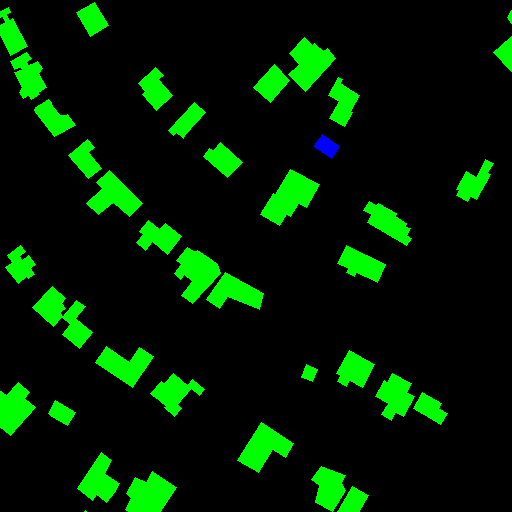

In [ ]:
cv2_imshow(mask)

In [ ]:
image = image.permute(1,2,0).squeeze()

In [ ]:
print(image.shape)

torch.Size([512, 512, 3])


In [ ]:
image = image.numpy()

In [ ]:
image = image*255

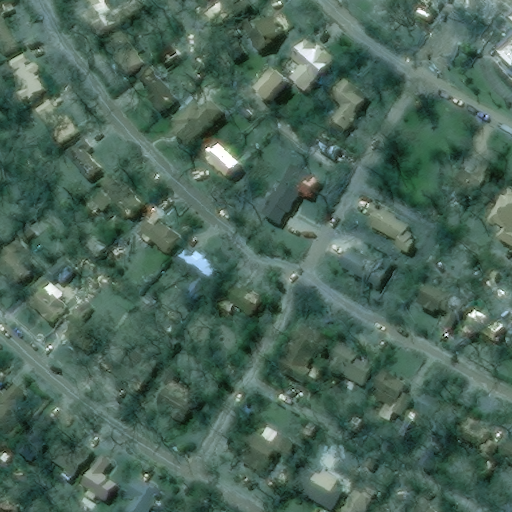

In [ ]:
cv2_imshow(image)

# Task 5 : Load dataset into batches

In [ ]:
from torch.utils.data import DataLoader

In [ ]:
trainloader = DataLoader(trainset, batch_size= BATCH_SIZE, shuffle = True)
validloader = DataLoader(validset, batch_size=BATCH_SIZE)

In [ ]:
print(f"total no. of batches in trainloader : {len(trainloader)}")
print(f"total no. of batches in validloader : {len(validloader)}")

total no. of batches in trainloader : 935
total no. of batches in validloader : 241


In [ ]:
for image,mask in trainloader:
  break

print(f"one batch image shape: {image.shape}")
print(f"one batch mask shape: {mask.shape}")

(512, 512, 5)
one batch image shape: torch.Size([1, 3, 512, 512])
one batch mask shape: torch.Size([1, 5, 512, 512])


# Task 6 : Create Segmentation Model

segmentation_models_pytorch documentation : https://smp.readthedocs.io/en/latest/

In [ ]:
from torch import nn
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss

In [ ]:
!git clone https://github.com/HuCaoFighting/Swin-Unet.git

Cloning into 'Swin-Unet'...
remote: Enumerating objects: 76, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 76 (delta 11), reused 1 (delta 0), pack-reused 55
Unpacking objects: 100% (76/76), 37.45 KiB | 1.97 MiB/s, done.


In [ ]:
!pip install torch
!pip install torchvision
!pip install numpy
!pip install tqdm
!pip install tensorboard
!pip install tensorboardX
!pip install ml-collections
!pip install medpy
!pip install SimpleITK
!pip install scipy
!pip install h5py
!pip install timm
!pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 13.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ml-collections: filename=ml_collections-0.1.1-py3-none-any.whl size=94524 sha256=a39e

In [ ]:
%cd Swin-Unet

/content/hurricane-michael/Swin-Unet


In [ ]:
from networks.vision_transformer import SwinUnet as ViT_seg

In [ ]:
!pip install yacs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from config import _update_config_from_file

In [ ]:
from yacs.config import CfgNode as CN


_C = CN()

# Base config files
_C.BASE = ['']

# -----------------------------------------------------------------------------
# Data settings
# -----------------------------------------------------------------------------
_C.DATA = CN()
# Batch size for a single GPU, could be overwritten by command line argument
_C.DATA.BATCH_SIZE = 128
# Path to dataset, could be overwritten by command line argument
_C.DATA.DATA_PATH = ''
# Dataset name
_C.DATA.DATASET = 'imagenet'
# Input image size
_C.DATA.IMG_SIZE = 512
# Interpolation to resize image (random, bilinear, bicubic)
_C.DATA.INTERPOLATION = 'bicubic'
# Use zipped dataset instead of folder dataset
# could be overwritten by command line argument
_C.DATA.ZIP_MODE = False
# Cache Data in Memory, could be overwritten by command line argument
_C.DATA.CACHE_MODE = 'part'
# Pin CPU memory in DataLoader for more efficient (sometimes) transfer to GPU.
_C.DATA.PIN_MEMORY = True
# Number of data loading threads
_C.DATA.NUM_WORKERS = 8

# -----------------------------------------------------------------------------
# Model settings
# -----------------------------------------------------------------------------
_C.MODEL = CN()
# Model type
_C.MODEL.TYPE = 'swin'
# Model name
_C.MODEL.NAME = 'swin_tiny_patch4_window7_224'
# Checkpoint to resume, could be overwritten by command line argument
_C.MODEL.PRETRAIN_CKPT = '/content/swin_tiny_patch4_window7_224.pth'
_C.MODEL.RESUME = ''
# Number of classes, overwritten in data preparation
_C.MODEL.NUM_CLASSES = 5
# Dropout rate
_C.MODEL.DROP_RATE = 0.0
# Drop path rate
_C.MODEL.DROP_PATH_RATE = 0.1
# Label Smoothing
_C.MODEL.LABEL_SMOOTHING = 0.1

# Swin Transformer parameters
_C.MODEL.SWIN = CN()
_C.MODEL.SWIN.PATCH_SIZE = 4
_C.MODEL.SWIN.IN_CHANS = 3
_C.MODEL.SWIN.EMBED_DIM = 96
_C.MODEL.SWIN.DEPTHS = [2, 2, 6, 2]
_C.MODEL.SWIN.DECODER_DEPTHS = [2, 2, 6, 2]
_C.MODEL.SWIN.NUM_HEADS = [3, 6, 12, 24]
_C.MODEL.SWIN.WINDOW_SIZE = 16
_C.MODEL.SWIN.MLP_RATIO = 4.
_C.MODEL.SWIN.QKV_BIAS = True
_C.MODEL.SWIN.QK_SCALE = None
_C.MODEL.SWIN.APE = False
_C.MODEL.SWIN.PATCH_NORM = True
_C.MODEL.SWIN.FINAL_UPSAMPLE= "expand_first"

# -----------------------------------------------------------------------------
# Training settings
# -----------------------------------------------------------------------------
_C.TRAIN = CN()
_C.TRAIN.START_EPOCH = 0
_C.TRAIN.EPOCHS = 300
_C.TRAIN.WARMUP_EPOCHS = 20
_C.TRAIN.WEIGHT_DECAY = 0.05
_C.TRAIN.BASE_LR = 5e-4
_C.TRAIN.WARMUP_LR = 5e-7
_C.TRAIN.MIN_LR = 5e-6
# Clip gradient norm
_C.TRAIN.CLIP_GRAD = 5.0
# Auto resume from latest checkpoint
_C.TRAIN.AUTO_RESUME = True
# Gradient accumulation steps
# could be overwritten by command line argument
_C.TRAIN.ACCUMULATION_STEPS = 0
# Whether to use gradient checkpointing to save memory
# could be overwritten by command line argument
_C.TRAIN.USE_CHECKPOINT = False

# LR scheduler
_C.TRAIN.LR_SCHEDULER = CN()
_C.TRAIN.LR_SCHEDULER.NAME = 'cosine'
# Epoch interval to decay LR, used in StepLRScheduler
_C.TRAIN.LR_SCHEDULER.DECAY_EPOCHS = 30
# LR decay rate, used in StepLRScheduler
_C.TRAIN.LR_SCHEDULER.DECAY_RATE = 0.1

# Optimizer
_C.TRAIN.OPTIMIZER = CN()
_C.TRAIN.OPTIMIZER.NAME = 'adamw'
# Optimizer Epsilon
_C.TRAIN.OPTIMIZER.EPS = 1e-8
# Optimizer Betas
_C.TRAIN.OPTIMIZER.BETAS = (0.9, 0.999)
# SGD momentum
_C.TRAIN.OPTIMIZER.MOMENTUM = 0.9

# -----------------------------------------------------------------------------
# Augmentation settings
# -----------------------------------------------------------------------------
_C.AUG = CN()
# Color jitter factor
_C.AUG.COLOR_JITTER = 0.4
# Use AutoAugment policy. "v0" or "original"
_C.AUG.AUTO_AUGMENT = 'rand-m9-mstd0.5-inc1'
# Random erase prob
_C.AUG.REPROB = 0.25
# Random erase mode
_C.AUG.REMODE = 'pixel'
# Random erase count
_C.AUG.RECOUNT = 1
# Mixup alpha, mixup enabled if > 0
_C.AUG.MIXUP = 0.8
# Cutmix alpha, cutmix enabled if > 0
_C.AUG.CUTMIX = 1.0
# Cutmix min/max ratio, overrides alpha and enables cutmix if set
_C.AUG.CUTMIX_MINMAX = None
# Probability of performing mixup or cutmix when either/both is enabled
_C.AUG.MIXUP_PROB = 1.0
# Probability of switching to cutmix when both mixup and cutmix enabled
_C.AUG.MIXUP_SWITCH_PROB = 0.5
# How to apply mixup/cutmix params. Per "batch", "pair", or "elem"
_C.AUG.MIXUP_MODE = 'batch'

# -----------------------------------------------------------------------------
# Testing settings
# -----------------------------------------------------------------------------
_C.TEST = CN()
# Whether to use center crop when testing
_C.TEST.CROP = True

# -----------------------------------------------------------------------------
# Misc
# -----------------------------------------------------------------------------
# Mixed precision opt level, if O0, no amp is used ('O0', 'O1', 'O2')
# overwritten by command line argument
_C.AMP_OPT_LEVEL = ''
# Path to output folder, overwritten by command line argument
_C.OUTPUT = ''
# Tag of experiment, overwritten by command line argument
_C.TAG = 'default'
# Frequency to save checkpoint
_C.SAVE_FREQ = 1
# Frequency to logging info
_C.PRINT_FREQ = 10
# Fixed random seed
_C.SEED = 0
# Perform evaluation only, overwritten by command line argument
_C.EVAL_MODE = False
# Test throughput only, overwritten by command line argument
_C.THROUGHPUT_MODE = False
# local rank for DistributedDataParallel, given by command line argument
_C.LOCAL_RANK = 0


def get_cfg_defaults():
  """Get a yacs CfgNode object with default values for my_project."""
  # Return a clone so that the defaults will not be altered
  # This is for the "local variable" use pattern
  return _C.clone()

In [ ]:
cfg = get_cfg_defaults()

In [ ]:
cfg.merge_from_file("/content/hurricane-michael/Swin-Unet/configs/swin_tiny_patch4_window7_224_lite.yaml")
cfg.freeze()
print(cfg)

AMP_OPT_LEVEL: 
AUG:
  AUTO_AUGMENT: rand-m9-mstd0.5-inc1
  COLOR_JITTER: 0.4
  CUTMIX: 1.0
  CUTMIX_MINMAX: None
  MIXUP: 0.8
  MIXUP_MODE: batch
  MIXUP_PROB: 1.0
  MIXUP_SWITCH_PROB: 0.5
  RECOUNT: 1
  REMODE: pixel
  REPROB: 0.25
BASE: ['']
DATA:
  BATCH_SIZE: 128
  CACHE_MODE: part
  DATASET: imagenet
  DATA_PATH: 
  IMG_SIZE: 512
  INTERPOLATION: bicubic
  NUM_WORKERS: 8
  PIN_MEMORY: True
  ZIP_MODE: False
EVAL_MODE: False
LOCAL_RANK: 0
MODEL:
  DROP_PATH_RATE: 0.2
  DROP_RATE: 0.0
  LABEL_SMOOTHING: 0.1
  NAME: swin_tiny_patch4_window7_224
  NUM_CLASSES: 5
  PRETRAIN_CKPT: ./pretrained_ckpt/swin_tiny_patch4_window7_224.pth
  RESUME: 
  SWIN:
    APE: False
    DECODER_DEPTHS: [2, 2, 2, 1]
    DEPTHS: [2, 2, 2, 2]
    EMBED_DIM: 96
    FINAL_UPSAMPLE: expand_first
    IN_CHANS: 3
    MLP_RATIO: 4.0
    NUM_HEADS: [3, 6, 12, 24]
    PATCH_NORM: True
    PATCH_SIZE: 4
    QKV_BIAS: True
    QK_SCALE: None
    WINDOW_SIZE: 16
  TYPE: swin
OUTPUT: 
PRINT_FREQ: 10
SAVE_FREQ: 1
SEED: 

In [ ]:
DEVICE = 'cuda'

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.modules.loss._WeightedLoss):
    def __init__(self, weight=None, gamma=2,reduction='mean'):
        super(FocalLoss, self).__init__(weight,reduction=reduction)
        self.gamma = gamma
        self.weight = weight #weight parameter will act as the alpha parameter to balance class weights

    def forward(self, input, target):

        ce_loss = F.cross_entropy(input, target,reduction=self.reduction,weight=self.weight)
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma * ce_loss).mean()
        return focal_loss

In [ ]:



import torch
import torch.nn.functional as F
import segmentation_models_pytorch.losses as smp_losses
from torch import nn

import numpy as np
from torch.autograd import Variable
from typing import Optional
def cross_entropy(input, target, weight=None, reduction='mean',ignore_index=255):
    """
    logSoftmax_with_loss
    :param input: torch.Tensor, N*C*H*W
    :param target: torch.Tensor, N*1*H*W,/ N*H*W
    :param weight: torch.Tensor, C
    :return: torch.Tensor [0]
    """
    target = target.long()
    if target.dim() == 4:
        target = torch.squeeze(target, dim=1)
    #print("pred: ", input.shape, "target: ", target.shape)
    if input.shape[-1] != target.shape[-1]:
        input = F.interpolate(input, size=target.shape[1:], mode='bilinear',align_corners=True)

    weight_ = torch.Tensor([1, 1]).cuda()
    return F.cross_entropy(input=input, target=target, weight=weight_,
                           ignore_index=ignore_index, reduction=reduction)


# def focal_loss(pred, true):
#     B, C, H, W = pred.shape
#     true = true.squeeze()
#     msk0 = torch.zeros([B,H,W]).cuda()
#     msk1 = torch.zeros([B,H,W]).cuda()
#     msk0[true == 0] = 1
#     msk1[true == 1] = 1

#     loss0 = focal_loss2D(pred[:,0,:,:], msk0)
#     loss1 = focal_loss2D(pred[:,1,:,:], msk1)

#     return loss

def one_hot(index, classes):
    size = index.size() + (classes,)
    view = index.size() + (1,)

    mask = torch.Tensor(*size).fill_(0)
    index = index.view(*view)
    ones = 1.

    if isinstance(index, Variable):
        ones = Variable(torch.Tensor(index.size()).fill_(1)).cuda()
        mask = Variable(mask, volatile=index.volatile).cuda()

    return mask.scatter_(1, index, ones)



def one_hot(
    labels: torch.Tensor,
    num_classes: int,
    device: Optional[torch.device] = None,
    dtype: Optional[torch.dtype] = None,
    eps: float = 1e-6,
) -> torch.Tensor:
    r"""Convert an integer label x-D tensor to a one-hot (x+1)-D tensor.
    Args:
        labels: tensor with labels of shape :math:`(N, *)`, where N is batch size.
          Each value is an integer representing correct classification.
        num_classes: number of classes in labels.
        device: the desired device of returned tensor.
        dtype: the desired data type of returned tensor.
    Returns:
        the labels in one hot tensor of shape :math:`(N, C, *)`,
    Examples:
        >>> labels = torch.LongTensor([[[0, 1], [2, 0]]])
        >>> one_hot(labels, num_classes=3)
        tensor([[[[1.0000e+00, 1.0000e-06],
                  [1.0000e-06, 1.0000e+00]],
        <BLANKLINE>
                 [[1.0000e-06, 1.0000e+00],
                  [1.0000e-06, 1.0000e-06]],
        <BLANKLINE>
                 [[1.0000e-06, 1.0000e-06],
                  [1.0000e+00, 1.0000e-06]]]])
    """
    if not isinstance(labels, torch.Tensor):
        raise TypeError(f"Input labels type is not a torch.Tensor. Got {type(labels)}")

    if not labels.dtype == torch.int64:
        labels = labels.to(torch.int64)
        if not labels.dtype == torch.int64:
            raise ValueError(f"labels must be of the same dtype torch.int64. Got: {labels.dtype}")

    if num_classes < 1:
        raise ValueError("The number of classes must be bigger than one." " Got: {}".format(num_classes))

    shape = labels.shape
    one_hot = torch.zeros((shape[0], num_classes) + shape[1:], device=device, dtype=dtype)

    return one_hot.scatter_(1, labels.unsqueeze(1), 1.0) + eps

def focal_loss(
    input: torch.Tensor,
    target: torch.Tensor,
    alpha=0.5,
    gamma: float = 2.0,
    reduction: str = 'mean',
    eps: Optional[float] = None,
) -> torch.Tensor:
    r"""Criterion that computes Focal loss.
    According to :cite:`lin2018focal`, the Focal loss is computed as follows:
    .. math::
        \text{FL}(p_t) = -\alpha_t (1 - p_t)^{\gamma} \, \text{log}(p_t)
    Where:
       - :math:`p_t` is the model's estimated probability for each class.
    Args:
        input: logits tensor with shape :math:`(N, C, *)` where C = number of classes.
        target: labels tensor with shape :math:`(N, *)` where each value is :math:`0 ≤ targets[i] ≤ C−1`.
        alpha: Weighting factor :math:`\alpha \in [0, 1]`.
        gamma: Focusing parameter :math:`\gamma >= 0`.
        reduction: Specifies the reduction to apply to the
          output: ``'none'`` | ``'mean'`` | ``'sum'``. ``'none'``: no reduction
          will be applied, ``'mean'``: the sum of the output will be divided by
          the number of elements in the output, ``'sum'``: the output will be
          summed.
        eps: Deprecated: scalar to enforce numerical stabiliy. This is no longer used.
    Return:
        the computed loss.
    Example:
        >>> N = 5  # num_classes
        >>> input = torch.randn(1, N, 3, 5, requires_grad=True)
        >>> target = torch.empty(1, 3, 5, dtype=torch.long).random_(N)
        >>> output = focal_loss(input, target, alpha=0.5, gamma=2.0, reduction='mean')
        >>> output.backward()
    """

    target = target.squeeze()

    if eps is not None and not torch.jit.is_scripting():
        warnings.warn(
            "`focal_loss` has been reworked for improved numerical stability "
            "and the `eps` argument is no longer necessary",
            DeprecationWarning,
            stacklevel=2,
        )

    if not isinstance(input, torch.Tensor):
        raise TypeError(f"Input type is not a torch.Tensor. Got {type(input)}")

    if not len(input.shape) >= 2:
        raise ValueError(f"Invalid input shape, we expect BxCx*. Got: {input.shape}")

    # if input.size(0) != target.size(0):
    #     raise ValueError(f'Expected input batch_size ({input.size(0)}) to match target batch_size ({target.size(0)}).')

    # n = input.size(0)
    # out_size = (n,) + input.size()[2:]
    # if target.size()[1:] != input.size()[2:]:
    #     raise ValueError(f'Expected target size {out_size}, got {target.size()}')

    # if not input.device == target.device:
    #     raise ValueError(f"input and target must be in the same device. Got: {input.device} and {target.device}")

    # compute softmax over the classes axis
    input_soft: torch.Tensor = F.softmax(input, dim=1)
    log_input_soft: torch.Tensor = F.log_softmax(input, dim=1)

    # create the labels one hot tensor
    # target_one_hot: torch.Tensor = one_hot(target, num_classes=input.shape[1], device=input.device, dtype=input.dtype)

    # compute the actual focal loss
    weight = torch.pow(-input_soft + 1.0, gamma)

    focal = -alpha * weight * log_input_soft
    loss_tmp = torch.einsum('bc...,bc...->b...', (target, focal))

    if reduction == 'none':
        loss = loss_tmp
    elif reduction == 'mean':
        loss = torch.mean(loss_tmp)
    elif reduction == 'sum':
        loss = torch.sum(loss_tmp)
    else:
        raise NotImplementedError(f"Invalid reduction mode: {reduction}")
    return loss

# class FocalLoss(nn.Module):

#     def __init__(self, gamma=0, eps=1e-7):
#         super(FocalLoss, self).__init__()
#         self.gamma = gamma
#         self.eps = eps

#     def forward(self, input, target):
#         target = target.squeeze(1)
#         y = one_hot(target, input.size(1)).transpose(3,1)
#         logit = F.softmax(input, dim=-1)
#         logit = logit.clamp(self.eps, 1. - self.eps)

#         print(y.shape, logit.shape)
#         loss = -1 * y * torch.log(logit) # cross entropy
#         loss = loss * (1 - logit) ** self.gamma # focal loss

#         return loss.sum()


# # https://github.com/clcarwin/focal_loss_pytorch.git
# class FocalLoss(nn.Module):
#     def __init__(self, gamma=0, alpha=None, size_average=True):
#         super(FocalLoss, self).__init__()
#         self.gamma = gamma
#         self.alpha = alpha
#         self.size_average = size_average

#     def forward(self, input, target):
#         if input.dim()>2:
#             input = input.view(input.size(0),input.size(1),-1)  # N,C,H,W => N,C,H*W
#             input = input.transpose(1,2)    # N,C,H*W => N,H*W,C
#             input = input.contiguous().view(-1,input.size(2))   # N,H*W,C => N*H*W,C
#         target = target.view(-1,1)

#         logpt = F.log_softmax(input)
#         logpt = logpt.gather(1,target)
#         logpt = logpt.view(-1)
#         pt = Variable(logpt.data.exp())

#         loss = -1 * (1-pt)**self.gamma * logpt
#         if self.size_average: return loss.mean()
#         else: return loss.sum()


def focal_loss_xBD(pred, true):
    B, C, H, W = pred.shape
    true = true.squeeze()
    print(true.shape)
    msk0 = torch.zeros([B,H,W]).cuda()
    msk1 = torch.zeros([B,H,W]).cuda()
    msk2 = torch.zeros([B,H,W]).cuda()
    msk3 = torch.zeros([B,H,W]).cuda()
    msk4 = torch.zeros([B,H,W]).cuda()

    msk0[true == 0] = 1
    msk1[true == 1] = 1
    msk2[true == 2] = 1
    msk3[true == 3] = 1
    msk4[true == 4] = 1

    loss0 = focal_loss2D(pred[:,0,:,:], msk0)
    loss1 = focal_loss2D(pred[:,1,:,:], msk1)
    loss2 = focal_loss2D(pred[:,2,:,:], msk2)
    loss3 = focal_loss2D(pred[:,3,:,:], msk3)
    loss4 = focal_loss2D(pred[:,4,:,:], msk4)

    return loss0 * 0.01 + loss1 * 0.1 + loss2 * 2 + loss3 * 1.5 + loss4 * 2

    # too much oscillating
    # return loss0 * 0.1 + loss1 * 1 + loss2 * 5 + loss3 * 5 + loss4 * 10

    # return loss0 * 1 + loss1 * 100


def focal_loss2D(outputs, targets, gamma=2, ignore_index=255):
    outputs = torch.sigmoid(outputs).contiguous()
    targets = targets.contiguous()

    eps = 1e-8
    outputs = torch.clamp(outputs, 1e-8, 1. - 1e-8)
    targets = torch.clamp(targets, 1e-8, 1. - 1e-8)
    pt = (1 - targets) * (1 - outputs) + targets * outputs
    return (-(1. - pt) ** gamma * torch.log(pt)).mean()


def multi_cross_entropy(input, target, weight=None, reduction='mean',ignore_index=255):
    """
    logSoftmax_with_loss
    :param input: torch.Tensor, N*C*H*W
    :param target: torch.Tensor, N*1*H*W,/ N*H*W
    :param weight: torch.Tensor, C
    :return: torch.Tensor [0]
    """
    target = target.long()
    if target.dim() == 4:
        target = torch.squeeze(target, dim=1)
    if input.shape[-1] != target.shape[-1]:
        input = F.interpolate(input, size=target.shape[1:], mode='bilinear',align_corners=True)

    weight_ = torch.Tensor([1, 5, 100, 90, 100]).cuda()
    # print("pred: ", input.shape, "target: ", target.shape)

    return F.cross_entropy(input=input, target=target, weight=weight_,
                           ignore_index=ignore_index, reduction=reduction)



def ce_dice(input, target, weight=None, ignore_index=255, reduction='mean'):
    """
    logSoftmax_with_loss
    :param input: torch.Tensor, N*C*H*W
    :param target: torch.Tensor, N*1*H*W,/ N*H*W
    :param weight: torch.Tensor, C
    :return: torch.Tensor [0]
    """
    #target = target.long()
    if target.dim() == 4:
        target = torch.squeeze(target, dim=1)
    if input.shape[-1] != target.shape[-1]:
        input = F.interpolate(input, size=target.shape[1:], mode='bilinear',align_corners=True)

    weight_ = torch.Tensor([0.2, 0.8]).cuda()
    ce  = torch.nn.CrossEntropyLoss(weight=weight,
                           ignore_index=ignore_index, reduction=reduction)
    celoss = ce(input,target)
    dice = smp_losses.DiceLoss(mode='binary')
    input = torch.argmax(input, dim=1).type(torch.float32)
    target = target.type(torch.float32)
    diceloss = dice(input, target)

    loss = 0.5*diceloss + 0.5*celoss

    return loss


def diceloss(input, target, weight=None):
    input = torch.argmax(input, dim=1).type(torch.float32)
    target = target.type(torch.float32)

    diceloss = smp_losses.DiceLoss(mode='binary')
    loss = diceloss(input, target)
    return loss


In [ ]:
from segmentation_models_pytorch.losses import FocalLoss

In [ ]:
class SegmentationModel(nn.Module):
  def __init__(self):
    super(SegmentationModel, self).__init__()

    self.arc = ViT_seg(config = cfg,num_classes = 5)

  def forward(self, images, masks = None):
      logits = self.arc(images)
      print(logits.shape)

      if masks != None:

        loss2 = DiceLoss(mode='multilabel')(logits,masks)

        return logits, loss2

      return logits.to(DEVICE)

In [ ]:
model = SegmentationModel()
model.to(DEVICE)

SwinTransformerSys expand initial----depths:[2, 2, 2, 2];depths_decoder:[1, 2, 2, 2];drop_path_rate:0.2;num_classes:5
---final upsample expand_first---


SegmentationModel(
  (arc): SwinUnet(
    (swin_unet): SwinTransformerSys(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
        (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (layers): ModuleList(
        (0): BasicLayer(
          dim=96, input_resolution=(128, 128), depth=2
          (blocks): ModuleList(
            (0): SwinTransformerBlock(
              dim=96, input_resolution=(128, 128), num_heads=3, window_size=16, shift_size=0, mlp_ratio=4.0
              (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
              (attn): WindowAttention(
                dim=96, window_size=(16, 16), num_heads=3
                (qkv): Linear(in_features=96, out_features=288, bias=True)
                (attn_drop): Dropout(p=0.0, inplace=False)
                (proj): Linear(in_features=96, out_features=96, bias=True)
                (proj_drop): Drop

# Task 7 : Create Train and Validation Function

In [ ]:
def train_fn(data_loader, model, optimizer):
  model.train()
  total_loss = 0.0

  for images, masks in tqdm(data_loader):
    images = images.to(DEVICE)
    masks = masks.to(DEVICE)
    print(masks.shape)
    optimizer.zero_grad()
    logits, loss = model(images.float(), masks.float())
    loss.backward()
    optimizer.step()

    total_loss += loss.item()
  return total_loss/ len(data_loader)

In [ ]:
def eval_fn(data_loader, model):
  model.eval()
  total_loss = 0.0
  with torch.no_grad():
    for images, masks in tqdm(data_loader):
      images = images.to(DEVICE)
      masks = masks.to(DEVICE)


      logits, loss = model(images.float(), masks.float())


      total_loss += loss.item()
    return total_loss/ len(data_loader)

# Task 8 : Train Model

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr = LR)

In [ ]:
best_valid_loss = np.Inf
for i in range(100):
  train_loss = train_fn(trainloader, model, optimizer)
  valid_loss = eval_fn(validloader, model)

  if valid_loss < best_valid_loss:
    torch.save(model.state_dict(), 'best_model.pt')
    print("SAVED-MODEL")
    best_valid_loss = valid_loss

  print(f"Epoch: {i+1} Train_loss: {train_loss} Valid-loss: {valid_loss}")

  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<04:02,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:32,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:22,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:22,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:21,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:19,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:22,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:20,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:18,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:17,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:02<03:16,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:15,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:14,  4.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:14,  4.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:03<03:15,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:03<03:15,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:14,  4.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:14,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:15,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:04<03:15,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:15,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:14,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:14,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:05<03:13,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:05<03:14,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:17,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:15,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:06<03:15,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:06<03:18,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:06<03:18,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:18,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:07<03:17,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:07<03:16,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:07<03:14,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:13,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:08<03:13,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:08<03:14,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:08<03:13,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:08<03:14,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:09<03:13,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:09<03:14,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:09<03:12,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:09<03:11,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:09<03:10,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:10<03:11,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:10<03:11,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:10<03:11,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:10<03:16,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:11<03:19,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:11<03:22,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:11<03:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:11<03:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:12<03:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:12<03:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:12<03:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:12<03:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:13<03:33,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:13<03:32,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:13<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:13<03:21,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:13<03:17,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:14<03:14,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:14<03:12,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:14<03:10,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:14<03:11,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:15<03:09,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:15<03:07,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:15<03:07,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:15<03:08,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:15<03:07,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:16<03:08,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:16<03:07,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:16<03:07,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:16<03:06,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:16<03:04,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:17<03:04,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:17<03:04,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:17<03:05,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:17<03:08,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:18<03:07,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:18<03:05,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:18<03:05,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:18<03:05,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:18<03:04,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:19<03:04,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:19<03:04,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:19<03:02,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:19<03:03,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:20<03:02,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:20<03:01,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:20<03:02,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:20<03:01,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:20<03:02,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:21<03:03,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:21<03:05,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:21<03:04,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:21<03:02,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:21<03:01,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:22<03:00,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:22<03:02,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:22<03:01,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:22<03:01,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:23<03:02,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:23<03:01,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:23<03:04,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:23<03:08,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:24<03:11,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:24<03:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:24<03:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:24<03:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:24<03:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:25<03:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:25<03:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:25<03:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:25<03:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:26<03:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:26<03:09,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:26<03:06,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:26<03:02,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:27<02:59,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:27<02:57,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:27<02:56,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:27<02:55,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:27<02:56,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:28<02:56,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:28<02:54,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:28<02:53,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:28<02:54,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:28<02:53,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:29<02:53,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:29<02:52,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:29<02:52,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:29<02:52,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:30<02:51,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:30<02:50,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:30<02:50,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:30<02:50,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:30<02:51,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:31<02:51,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:31<02:50,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:31<02:52,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:31<02:50,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:31<02:49,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:32<02:49,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:32<02:49,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:32<02:50,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:32<02:49,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:33<02:48,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:33<02:47,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:33<02:47,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:33<02:46,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:33<02:45,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:34<02:46,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:34<02:45,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:34<02:46,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:34<02:45,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:34<02:44,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:35<02:44,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:35<02:44,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:35<02:43,  4.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:35<02:44,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:36<02:44,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:36<02:46,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:36<02:50,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:36<02:53,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:36<02:55,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:37<02:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:37<02:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:37<02:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:37<02:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:38<02:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:38<03:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:38<03:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:38<03:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:39<02:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:39<02:54,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:39<02:50,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:39<02:47,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:39<02:46,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:40<02:45,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:40<02:42,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:40<02:42,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:40<02:41,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:41<02:42,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:41<02:42,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:41<02:41,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:41<02:40,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:41<02:39,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:42<02:38,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:42<02:38,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:42<02:38,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:42<02:37,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:42<02:36,  4.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:43<02:37,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:43<02:37,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:43<02:36,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:43<02:37,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:44<02:36,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:44<02:36,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:44<02:37,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:44<02:37,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:44<02:36,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:45<02:35,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:45<02:35,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:45<02:35,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:45<02:34,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:45<02:34,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:46<02:34,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:46<02:33,  4.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:46<02:34,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:46<02:34,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:47<02:33,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:47<02:33,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:47<02:33,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:47<02:32,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:47<02:32,  4.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:48<02:32,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:48<02:32,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:48<02:33,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:48<02:32,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:48<02:32,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:49<02:38,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:49<02:39,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:49<02:43,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:49<02:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:50<02:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:50<02:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:50<02:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:50<02:47,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:51<02:49,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:51<02:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:51<02:50,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:51<02:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:52<02:42,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:52<02:38,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:52<02:36,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:52<02:34,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:52<02:32,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:53<02:31,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:53<02:29,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:53<02:29,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:53<02:27,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:53<02:27,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:54<02:26,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:54<02:27,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:54<02:27,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:54<02:27,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:55<02:26,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [00:55<02:26,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [00:55<02:24,  4.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [00:55<02:26,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [00:55<02:26,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [00:56<02:25,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [00:56<02:25,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [00:56<02:24,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [00:56<02:24,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [00:56<02:24,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [00:57<02:24,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [00:57<02:25,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [00:57<02:25,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [00:57<02:28,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [00:58<02:26,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [00:58<02:25,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [00:58<02:24,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [00:58<02:23,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [00:58<02:23,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [00:59<02:23,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [00:59<02:23,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [00:59<02:22,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [00:59<02:22,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [00:59<02:21,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:00<02:20,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:00<02:20,  4.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:00<02:21,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:00<02:21,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:01<02:20,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:01<02:20,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:01<02:19,  4.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:01<02:20,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:01<02:22,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:02<02:28,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:02<02:30,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:02<02:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:02<02:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:03<02:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:03<02:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:03<02:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:03<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:04<02:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:04<02:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:04<02:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:04<02:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:04<02:26,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:05<02:23,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:05<02:20,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:05<02:19,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:05<02:18,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:06<02:17,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:06<02:16,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:06<02:15,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:06<02:17,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:06<02:17,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:07<02:16,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:07<02:17,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:07<02:16,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:07<02:16,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:08<02:14,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:08<02:14,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:08<02:14,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:08<02:14,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:08<02:14,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:09<02:13,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:09<02:12,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:09<02:12,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:09<02:12,  4.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:09<02:13,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:10<02:13,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:10<02:12,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:10<02:12,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:10<02:11,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:11<02:12,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:11<02:13,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:11<02:13,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:11<02:12,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:11<02:11,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:12<02:11,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:12<02:11,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:12<02:09,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:12<02:10,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:12<02:09,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:13<02:09,  4.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:13<02:09,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:13<02:09,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:13<02:09,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:14<02:10,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:14<02:09,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:14<02:08,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:14<02:08,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:14<02:11,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:15<02:16,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:15<02:16,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:15<02:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:15<02:22,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:16<02:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:16<02:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:16<02:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:16<02:25,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:17<02:25,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:17<02:25,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:17<02:23,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:17<02:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:18<02:14,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:18<02:11,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:18<02:10,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:18<02:09,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:18<02:07,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:19<02:06,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:19<02:05,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:19<02:04,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:19<02:03,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:20<02:04,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:20<02:03,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:20<02:04,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:20<02:02,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:20<02:02,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:21<02:01,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:21<02:02,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:21<02:02,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:21<02:01,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:21<02:00,  4.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:22<02:01,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:22<02:01,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:22<02:02,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:22<02:02,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:23<02:00,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:23<02:00,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:23<01:59,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:23<02:01,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:23<02:01,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:24<02:00,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:24<02:00,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:24<02:02,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:24<02:00,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:25<01:59,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:25<01:58,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:25<01:58,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:25<01:58,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:25<01:59,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:26<01:58,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:26<01:58,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:26<01:58,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:26<01:57,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:26<01:56,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:27<01:56,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:27<01:58,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:27<01:57,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:27<02:00,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:28<02:02,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:28<02:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:28<02:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:28<02:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:29<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:29<02:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:29<02:09,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:29<02:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:30<02:08,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:30<02:08,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:30<02:08,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:30<02:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:31<01:59,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:31<01:57,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:31<01:57,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:31<01:56,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:31<01:53,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:32<01:53,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:32<01:52,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:32<01:51,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:32<01:51,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:32<01:50,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:33<01:51,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:33<01:50,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:33<01:51,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:33<01:51,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:34<01:51,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:34<01:51,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:34<01:50,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:34<01:50,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:34<01:50,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:35<01:49,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:35<01:49,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:35<01:49,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:35<01:48,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:36<01:48,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:36<01:48,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:36<01:47,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:36<01:48,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:36<01:49,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:37<01:49,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:37<01:48,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:37<01:48,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:37<01:48,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:37<01:47,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:38<01:46,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:38<01:46,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:38<01:47,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:38<01:46,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:39<01:46,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:39<01:46,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:39<01:46,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:39<01:46,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:39<01:46,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:40<01:45,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:40<01:45,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:40<01:44,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:40<01:48,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:41<01:49,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:41<01:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:41<01:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:41<01:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:42<01:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:42<01:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:42<01:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:42<01:52,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:43<01:51,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:43<01:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:43<01:52,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:43<01:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:43<01:47,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:44<01:46,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:44<01:44,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:44<01:42,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:44<01:41,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:45<01:39,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:45<01:39,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:45<01:40,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:45<01:39,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:45<01:40,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:46<01:38,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:46<01:39,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:46<01:38,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:46<01:38,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:47<01:38,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:47<01:37,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:47<01:37,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:47<01:37,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:47<01:37,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:48<01:37,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:48<01:36,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:48<01:36,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:48<01:36,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:48<01:37,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:49<01:37,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:49<01:36,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:49<01:36,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:49<01:36,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:50<01:35,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:50<01:35,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:50<01:35,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [01:50<01:35,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [01:50<01:35,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [01:51<01:35,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [01:51<01:34,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [01:51<01:34,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [01:51<01:33,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [01:52<01:33,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [01:52<01:33,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [01:52<01:33,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [01:52<01:33,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [01:52<01:32,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [01:53<01:31,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [01:53<01:31,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [01:53<01:32,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [01:53<01:35,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [01:54<01:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [01:54<01:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [01:54<01:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [01:54<01:40,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [01:55<01:41,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [01:55<01:41,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [01:55<01:40,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [01:55<01:40,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [01:56<01:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [01:56<01:38,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [01:56<01:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [01:56<01:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [01:56<01:34,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [01:57<01:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [01:57<01:31,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [01:57<01:31,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [01:57<01:29,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [01:58<01:28,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [01:58<01:28,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [01:58<01:28,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [01:58<01:28,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [01:58<01:27,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [01:59<01:27,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [01:59<01:27,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [01:59<01:27,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [01:59<01:27,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:00<01:26,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:00<01:25,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:00<01:25,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:00<01:25,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:00<01:24,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:01<01:23,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:01<01:24,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:01<01:23,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:01<01:23,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:01<01:23,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:02<01:23,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:02<01:23,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:02<01:23,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:02<01:22,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:03<01:22,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:03<01:22,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:03<01:21,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:03<01:21,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:03<01:22,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:04<01:21,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:04<01:21,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:04<01:21,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:04<01:21,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:05<01:21,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:05<01:21,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:05<01:20,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:05<01:19,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:05<01:20,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:06<01:21,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:06<01:20,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:06<01:20,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:06<01:22,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:07<01:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:07<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:07<01:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:07<01:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:08<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:08<01:26,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:08<01:26,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:08<01:26,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:09<01:26,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:09<01:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:09<01:25,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:09<01:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:09<01:20,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:10<01:19,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:10<01:19,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:10<01:17,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:10<01:17,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:11<01:16,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:11<01:15,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:11<01:15,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:11<01:15,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:11<01:15,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:12<01:15,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:12<01:14,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:12<01:13,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:12<01:13,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:13<01:13,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:13<01:12,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:13<01:12,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:13<01:12,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:13<01:12,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:14<01:11,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:14<01:11,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:14<01:11,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:14<01:11,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:14<01:10,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:15<01:10,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:15<01:10,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:15<01:10,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:15<01:10,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:16<01:09,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:16<01:10,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:16<01:10,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:16<01:10,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:16<01:10,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:17<01:09,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:17<01:09,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:17<01:09,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:17<01:08,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:18<01:08,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:18<01:07,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:18<01:07,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:18<01:07,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:18<01:07,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:19<01:07,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:19<01:06,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:19<01:07,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:19<01:08,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:20<01:09,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:20<01:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:20<01:12,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:20<01:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:21<01:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:21<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:21<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:21<01:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:21<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:22<01:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:22<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:22<01:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:22<01:06,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:23<01:05,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:23<01:04,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:23<01:04,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:23<01:03,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:24<01:03,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:24<01:02,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:24<01:02,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:24<01:01,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:24<01:01,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:25<01:00,  4.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:25<01:01,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:25<01:01,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:25<01:01,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:25<01:00,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:26<01:00,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:26<00:59,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:26<00:59,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:26<00:59,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:27<00:59,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:27<00:59,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:27<00:58,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:27<00:58,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:27<00:58,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:28<00:58,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:28<00:58,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:28<00:58,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:28<00:58,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:29<00:58,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:29<00:57,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:29<00:56,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:29<00:57,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:29<00:56,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:30<00:56,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:30<00:55,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:30<00:55,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:30<00:55,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:30<00:55,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:31<00:54,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:31<00:55,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:31<00:54,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:31<00:54,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:32<00:54,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:32<00:53,  4.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:32<00:53,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:32<00:54,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:32<00:56,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:33<00:56,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:33<00:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:33<00:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:33<00:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:34<00:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:34<00:58,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:34<00:57,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:34<00:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:35<00:56,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:35<00:57,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:35<00:56,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:35<00:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:36<00:53,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:36<00:52,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:36<00:51,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:36<00:50,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:36<00:50,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:37<00:49,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:37<00:49,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:37<00:49,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:37<00:49,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:38<00:49,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:38<00:48,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:38<00:48,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:38<00:47,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:38<00:47,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:39<00:47,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:39<00:47,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:39<00:47,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:39<00:47,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:40<00:46,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:40<00:46,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:40<00:46,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:40<00:46,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:40<00:45,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:41<00:45,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:41<00:45,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:41<00:45,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:41<00:45,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:42<00:45,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:42<00:44,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:42<00:44,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:42<00:43,  4.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:42<00:43,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:43<00:43,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:43<00:43,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:43<00:42,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:43<00:42,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:43<00:42,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:44<00:42,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:44<00:42,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:44<00:41,  4.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:44<00:41,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:45<00:41,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:45<00:41,  4.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:45<00:41,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:45<00:40,  4.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:45<00:42,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:46<00:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:46<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [02:46<00:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [02:46<00:44,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [02:47<00:44,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [02:47<00:44,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [02:47<00:43,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [02:47<00:43,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [02:48<00:43,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [02:48<00:42,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [02:48<00:42,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [02:48<00:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [02:49<00:39,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [02:49<00:39,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [02:49<00:38,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [02:49<00:37,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [02:49<00:37,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [02:50<00:37,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [02:50<00:37,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [02:50<00:37,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [02:50<00:36,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [02:51<00:36,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [02:51<00:36,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [02:51<00:35,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [02:51<00:35,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [02:51<00:35,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [02:52<00:35,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [02:52<00:35,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [02:52<00:34,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [02:52<00:34,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [02:53<00:34,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [02:53<00:33,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [02:53<00:33,  4.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [02:53<00:33,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [02:53<00:33,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [02:54<00:33,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [02:54<00:32,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [02:54<00:32,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [02:54<00:32,  4.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [02:54<00:32,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [02:55<00:32,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [02:55<00:32,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [02:55<00:31,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [02:55<00:31,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [02:56<00:31,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [02:56<00:31,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [02:56<00:30,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [02:56<00:30,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [02:56<00:30,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [02:57<00:30,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [02:57<00:30,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [02:57<00:29,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [02:57<00:29,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [02:58<00:29,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [02:58<00:29,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [02:58<00:28,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [02:58<00:29,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [02:59<00:29,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [02:59<00:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [02:59<00:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [02:59<00:31,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:00<00:30,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:00<00:30,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:00<00:31,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:00<00:30,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:01<00:30,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:01<00:29,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:01<00:28,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:01<00:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:01<00:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:02<00:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:02<00:26,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:02<00:26,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:02<00:25,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:03<00:25,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:03<00:24,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:03<00:24,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:03<00:24,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:03<00:23,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:04<00:23,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:04<00:23,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:04<00:23,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:04<00:22,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:05<00:22,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:05<00:22,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:05<00:22,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:05<00:22,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:05<00:21,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:06<00:21,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:06<00:21,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:06<00:21,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:06<00:21,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:07<00:21,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:07<00:20,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:07<00:20,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:07<00:20,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:07<00:20,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:08<00:19,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:08<00:19,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:08<00:19,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:08<00:18,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:09<00:18,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:09<00:18,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:09<00:18,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:09<00:17,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:09<00:17,  4.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:10<00:17,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:10<00:17,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:10<00:17,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:10<00:17,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:11<00:16,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:11<00:16,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:11<00:16,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:11<00:16,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:11<00:16,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:12<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:12<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:12<00:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:12<00:16,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:13<00:16,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:13<00:16,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:13<00:16,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:13<00:15,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:14<00:15,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:14<00:15,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:14<00:15,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:14<00:14,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:15<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:15<00:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:15<00:13,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:15<00:12,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:16<00:12,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:16<00:11,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:16<00:11,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:16<00:11,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:16<00:11,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:17<00:11,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:17<00:11,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:17<00:10,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:17<00:10,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:18<00:10,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:18<00:09,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:18<00:09,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:18<00:09,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:18<00:09,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:19<00:09,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:19<00:08,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:19<00:08,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:19<00:08,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:20<00:08,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:20<00:07,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:20<00:07,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:20<00:07,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:20<00:07,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:21<00:07,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:21<00:06,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:21<00:06,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:21<00:06,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:22<00:06,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:22<00:05,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:22<00:05,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:22<00:05,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:22<00:05,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:23<00:05,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:23<00:04,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:23<00:04,  4.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:23<00:04,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:24<00:04,  4.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:24<00:03,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:24<00:03,  4.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:24<00:03,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:24<00:03,  4.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:25<00:03,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:25<00:03,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:25<00:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:25<00:02,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:26<00:02,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:26<00:02,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:26<00:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:26<00:01,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:27<00:01,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:27<00:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:27<00:00,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:27<00:00,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:28<00:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:28<00:00,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:28<00:00,  4.48it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:25,  9.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  1%|          | 3/241 [00:00<00:25,  9.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


  2%|▏         | 6/241 [00:00<00:23,  9.90it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▎         | 9/241 [00:00<00:24,  9.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 11/241 [00:01<00:24,  9.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▌         | 13/241 [00:01<00:24,  9.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 15/241 [00:01<00:24,  9.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 17/241 [00:01<00:24,  9.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 19/241 [00:02<00:23,  9.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▊         | 21/241 [00:02<00:23,  9.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 23/241 [00:02<00:23,  9.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|█         | 25/241 [00:02<00:23,  9.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 27/241 [00:02<00:23,  9.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 29/241 [00:03<00:23,  9.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 31/241 [00:03<00:22,  9.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▎        | 33/241 [00:03<00:22,  9.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 35/241 [00:03<00:22,  9.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▌        | 37/241 [00:03<00:22,  9.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 39/241 [00:04<00:22,  9.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 41/241 [00:04<00:21,  9.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 43/241 [00:04<00:21,  9.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▊        | 45/241 [00:04<00:21,  9.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 47/241 [00:05<00:20,  9.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:05<00:20,  9.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:05<00:20,  9.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 53/241 [00:05<00:20,  9.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:05<00:20,  9.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▎       | 57/241 [00:06<00:19,  9.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:06<00:19,  9.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:06<00:18,  9.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 63/241 [00:06<00:18,  9.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 65/241 [00:06<00:18,  9.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 67/241 [00:07<00:18,  9.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▊       | 69/241 [00:07<00:18,  9.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 71/241 [00:07<00:18,  9.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|███       | 73/241 [00:07<00:18,  9.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 75/241 [00:08<00:17,  9.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 77/241 [00:08<00:17,  9.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 79/241 [00:08<00:17,  9.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▎      | 81/241 [00:08<00:17,  9.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 83/241 [00:08<00:17,  9.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:09<00:17,  9.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 87/241 [00:09<00:17,  8.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:09<00:17,  8.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 91/241 [00:09<00:18,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▊      | 93/241 [00:10<00:19,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:10<00:19,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|████      | 97/241 [00:10<00:18,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:10<00:17,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:11<00:18,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:11<00:17,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:11<00:17,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:11<00:17,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:12<00:17,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:12<00:17,  7.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:12<00:16,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:12<00:14,  8.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:13<00:14,  8.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:13<00:13,  9.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:13<00:12,  9.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:13<00:12,  9.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:14<00:12,  9.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:14<00:12,  9.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:14<00:12,  9.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:14<00:11,  9.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:14<00:11,  9.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:15<00:11,  9.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:15<00:11,  9.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:15<00:10,  9.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:15<00:10,  9.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:16<00:10,  9.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:16<00:10,  9.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:16<00:10,  9.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:16<00:10,  9.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:16<00:09,  9.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:17<00:09,  9.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:17<00:09,  9.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:17<00:08,  9.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:17<00:08,  9.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:17<00:08,  9.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:18<00:08,  9.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:18<00:08,  9.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:18<00:08,  9.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:18<00:07,  9.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:19<00:07,  9.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:19<00:07,  9.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:19<00:07,  9.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:19<00:06,  9.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:19<00:06,  9.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 181/241 [00:20<00:06,  9.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:20<00:06,  9.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:20<00:05,  9.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 187/241 [00:20<00:05,  9.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 189/241 [00:21<00:05,  9.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 191/241 [00:21<00:05,  9.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:21<00:05,  9.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:21<00:05,  9.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:21<00:04,  9.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:22<00:04,  9.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:22<00:04,  9.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:22<00:04,  9.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:22<00:04,  8.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:23<00:04,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:23<00:04,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:23<00:03,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 213/241 [00:23<00:03,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:24<00:03,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:24<00:03,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:24<00:02,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:24<00:02,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 223/241 [00:25<00:02,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:25<00:02,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:25<00:01,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:25<00:01,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 231/241 [00:26<00:01,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 233/241 [00:26<00:00,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:26<00:00,  8.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 237/241 [00:26<00:00,  8.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 239/241 [00:27<00:00,  9.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:27<00:00,  8.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


SAVED-MODEL
Epoch: 1 Train_loss: 0.3207549304643414 Valid-loss: 0.32942438335191754


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:28,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:31,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:34,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:29,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:28,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:27,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:27,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:26,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:26,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:25,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:26,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:02<03:25,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:25,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:25,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:24,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:03<03:25,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:24,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:24,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:25,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:23,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:04<03:23,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:23,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:22,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:22,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:05<03:22,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:22,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:21,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:21,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:06<03:21,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:06<03:20,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:20,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:21,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:07<03:21,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:07<03:20,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:21,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:20,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:08<03:22,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:08<03:23,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:08<03:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:09<03:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:09<03:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:09<03:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:35,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:10<03:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:10<03:37,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:42,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:11<03:39,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:11<03:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:12<03:23,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:12<03:20,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:18,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:20,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:13<03:21,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:13<03:19,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:13<03:18,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:17,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:14<03:17,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:14<03:16,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:14<03:13,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:14,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:15<03:17,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:15<03:17,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:15<03:15,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:15<03:14,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:16<03:13,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:16<03:12,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:16<03:11,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:16<03:12,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:12,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:17<03:14,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:17<03:13,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:17<03:12,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:17<03:13,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:18<03:13,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:18<03:12,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:18<03:11,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:18<03:10,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:19<03:11,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:19<03:12,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:19<03:12,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:19<03:11,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:20<03:11,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:20<03:09,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:20<03:09,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:20<03:09,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:20<03:09,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:21<03:08,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:21<03:08,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:21<03:07,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:21<03:06,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:22<03:06,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:22<03:11,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:22<03:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:22<03:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:22<03:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:23<03:12,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:23<03:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:23<03:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:23<03:20,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:24<03:21,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:24<03:25,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:24<03:25,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:24<03:30,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:25<03:31,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:25<03:24,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:25<03:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:25<03:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:26<03:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:26<03:09,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:26<03:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:26<03:07,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:27<03:06,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:27<03:05,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:27<03:03,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:27<03:02,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:27<03:02,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:28<03:01,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:28<03:00,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:28<03:00,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:28<03:00,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:29<03:02,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:29<03:00,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:29<03:03,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:29<03:02,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:29<03:00,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:30<02:58,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:30<02:58,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:30<03:00,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:30<02:59,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:31<03:00,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:31<03:01,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:31<03:00,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:31<03:00,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:31<02:59,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:32<02:58,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:32<02:58,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:32<02:57,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:32<02:57,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:33<02:57,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:33<02:55,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:33<02:55,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:33<02:57,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:33<02:56,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:34<02:55,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:34<02:55,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:34<02:54,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:34<02:52,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:35<02:54,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:35<02:56,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:35<02:59,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:35<03:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:36<03:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:36<03:08,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:36<03:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:36<03:05,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:37<03:10,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:37<03:10,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:37<03:09,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:37<03:09,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:38<03:08,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:38<03:16,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:38<03:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:38<03:05,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:38<03:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:39<02:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:39<02:56,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:39<02:53,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:39<02:54,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:40<02:53,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:40<02:51,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:40<02:51,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:40<02:50,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:41<02:49,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:41<02:48,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:41<02:48,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:41<02:48,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:41<02:49,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:42<02:48,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:42<02:48,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:42<02:48,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:42<02:47,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:43<02:47,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:43<02:47,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:43<02:47,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:43<02:46,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:43<02:45,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:44<02:45,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:44<02:45,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:44<02:45,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:44<02:45,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:45<02:43,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:45<02:44,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:45<02:44,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:45<02:44,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:45<02:43,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:46<02:42,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:46<02:43,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:46<02:43,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:46<02:42,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:47<02:44,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:47<02:45,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:47<02:44,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:47<02:43,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:47<02:42,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:48<02:42,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:48<02:42,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:48<02:48,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:48<02:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:49<02:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:49<02:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:49<02:56,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:49<02:55,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:50<02:55,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:50<02:53,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:50<02:55,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:50<02:57,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:51<02:56,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:51<02:55,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:51<02:53,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:51<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:52<02:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:52<02:44,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:52<02:42,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:52<02:40,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:52<02:40,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:53<02:39,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:53<02:38,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:53<02:37,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:53<02:37,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:54<02:36,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:54<02:36,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:54<02:34,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:54<02:34,  4.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:54<02:34,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:55<02:34,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:55<02:35,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:55<02:35,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:55<02:34,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:56<02:35,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:56<02:37,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:56<02:38,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:56<02:36,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:57<02:35,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:57<02:32,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [00:57<02:34,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [00:57<02:35,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [00:57<02:34,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [00:58<02:33,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [00:58<02:34,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [00:58<02:33,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [00:58<02:33,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [00:59<02:33,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [00:59<02:32,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [00:59<02:32,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [00:59<02:32,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [00:59<02:31,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:00<02:30,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:00<02:31,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:00<02:30,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:00<02:29,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:01<02:28,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:01<02:29,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:01<02:31,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:01<02:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:02<02:42,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:02<02:40,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:02<02:40,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:02<02:38,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:03<02:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:03<02:37,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:03<02:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:03<02:39,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:04<02:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:04<02:43,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:04<02:40,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:04<02:38,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:04<02:39,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:05<02:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:05<02:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:05<02:30,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:05<02:29,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:06<02:27,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:06<02:26,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:06<02:25,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:06<02:24,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:06<02:24,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:07<02:23,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:07<02:22,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:07<02:23,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:07<02:23,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:08<02:23,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:08<02:22,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:08<02:23,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:08<02:23,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:09<02:22,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:09<02:21,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:09<02:21,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:09<02:20,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:09<02:20,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:10<02:20,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:10<02:21,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:10<02:20,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:10<02:20,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:11<02:21,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:11<02:21,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:11<02:20,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:11<02:19,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:11<02:19,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:12<02:19,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:12<02:19,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:12<02:18,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:12<02:17,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:13<02:16,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:13<02:16,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:13<02:17,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:13<02:17,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:13<02:16,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:14<02:16,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:14<02:15,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:14<02:15,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:14<02:17,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:15<02:19,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:15<02:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:15<02:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:15<02:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:16<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:16<02:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:16<02:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:16<02:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:16<02:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:17<02:23,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:17<02:27,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:17<02:25,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:17<02:27,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:18<02:25,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:18<02:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:18<02:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:18<02:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:19<02:15,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:19<02:13,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:19<02:12,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:19<02:11,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:20<02:13,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:20<02:12,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:20<02:11,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:20<02:11,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:20<02:10,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:21<02:09,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:21<02:08,  4.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:21<02:08,  4.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:21<02:08,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:22<02:10,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:22<02:09,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:22<02:08,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:22<02:08,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:22<02:08,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:23<02:08,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:23<02:08,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:23<02:08,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:23<02:08,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:24<02:09,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:24<02:08,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:24<02:07,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:24<02:07,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:24<02:07,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:25<02:06,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:25<02:05,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:25<02:05,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:25<02:05,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:26<02:05,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:26<02:05,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:26<02:07,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:26<02:06,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:26<02:05,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:27<02:06,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:27<02:05,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:27<02:04,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:27<02:03,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:28<02:03,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:28<02:03,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:28<02:05,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:28<02:06,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:29<02:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:29<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:29<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:29<02:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:30<02:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:30<02:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:30<02:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:30<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:30<02:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:31<02:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:31<02:11,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:31<02:13,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:31<02:09,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:32<02:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:32<02:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:32<02:02,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:32<02:01,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:33<02:00,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:33<02:01,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:33<02:01,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:33<02:00,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:34<01:59,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:34<01:58,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:34<01:59,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:34<01:58,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:34<01:57,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:35<01:56,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:35<01:57,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:35<01:56,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:35<01:56,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:36<01:56,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:36<01:57,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:36<01:56,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:36<01:56,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:36<01:55,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:37<01:55,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:37<01:55,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:37<01:54,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:37<01:54,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:38<01:54,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:38<01:54,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:38<01:54,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:38<01:53,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:38<01:52,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:39<01:53,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:39<01:53,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:39<01:53,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:39<01:53,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:40<01:52,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:40<01:51,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:40<01:51,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:40<01:51,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:41<01:51,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:41<01:52,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:41<01:52,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:41<01:52,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:41<01:52,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:42<01:57,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:42<01:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:42<01:59,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:42<01:59,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:43<01:57,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:43<01:59,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:43<01:57,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:43<01:58,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:44<01:59,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:44<02:03,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:44<02:01,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:44<02:01,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:45<01:57,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:45<01:54,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:45<01:54,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:45<01:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:46<01:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:46<01:49,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:46<01:48,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:46<01:48,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:47<01:48,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:47<01:47,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:47<01:47,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:47<01:47,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:47<01:46,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:48<01:46,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:48<01:45,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:48<01:44,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:48<01:44,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:49<01:44,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:49<01:44,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:49<01:44,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:49<01:44,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:49<01:44,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:50<01:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:50<01:43,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:50<01:42,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:50<01:42,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:51<01:41,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:51<01:41,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:51<01:41,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:51<01:42,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:52<01:42,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:52<01:42,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:52<01:41,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:52<01:40,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:52<01:39,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:53<01:38,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:53<01:38,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:53<01:38,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:53<01:38,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:54<01:37,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:54<01:37,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:54<01:38,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:54<01:38,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [01:54<01:37,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [01:55<01:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [01:55<01:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [01:55<01:44,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [01:55<01:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [01:56<01:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [01:56<01:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [01:56<01:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [01:56<01:43,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [01:57<01:44,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [01:57<01:43,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [01:57<01:42,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [01:57<01:45,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [01:58<01:43,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [01:58<01:43,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [01:58<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [01:58<01:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [01:59<01:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [01:59<01:36,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [01:59<01:34,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [01:59<01:34,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [01:59<01:33,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:00<01:34,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:00<01:33,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:00<01:33,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:00<01:33,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:01<01:33,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:01<01:32,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:01<01:31,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:01<01:31,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:02<01:33,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:02<01:32,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:02<01:31,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:02<01:31,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:02<01:30,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:03<01:30,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:03<01:29,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:03<01:30,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:03<01:29,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:04<01:30,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:04<01:30,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:04<01:29,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:04<01:29,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:04<01:28,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:05<01:27,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:05<01:27,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:05<01:27,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:05<01:26,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:06<01:26,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:06<01:25,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:06<01:25,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:06<01:25,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:06<01:25,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:07<01:26,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:07<01:26,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:07<01:25,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:07<01:25,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:08<01:24,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:08<01:25,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:08<01:25,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:08<01:25,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:09<01:25,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:09<01:25,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:09<01:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:09<01:25,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:09<01:25,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:10<01:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:10<01:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:10<01:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:10<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:11<01:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:11<01:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:11<01:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:11<01:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:12<01:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:12<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:12<01:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:12<01:22,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:13<01:20,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:13<01:20,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:13<01:20,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:13<01:19,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:13<01:19,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:14<01:19,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:14<01:20,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:14<01:19,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:14<01:18,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:15<01:18,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:15<01:19,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:15<01:18,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:15<01:17,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:15<01:17,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:16<01:17,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:16<01:18,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:16<01:17,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:16<01:16,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:17<01:16,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:17<01:16,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:17<01:16,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:17<01:15,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:18<01:15,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:18<01:15,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:18<01:16,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:18<01:15,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:18<01:15,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:19<01:14,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:19<01:14,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:19<01:13,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:19<01:12,  4.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:20<01:12,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:20<01:13,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:20<01:14,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:20<01:13,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:20<01:12,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:21<01:12,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:21<01:12,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:21<01:12,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:21<01:11,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:22<01:12,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:22<01:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:22<01:16,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:22<01:15,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:23<01:17,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:23<01:16,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:23<01:15,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:23<01:14,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:24<01:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:24<01:14,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:24<01:15,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:24<01:16,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:25<01:16,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:25<01:15,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:25<01:12,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:25<01:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:25<01:09,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:26<01:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:26<01:14,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:26<01:16,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:27<01:17,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:27<01:35,  3.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:27<01:33,  3.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:28<01:31,  3.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:28<01:32,  3.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:28<01:29,  3.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:29<01:27,  3.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:29<01:31,  3.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:30<01:42,  2.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:30<01:37,  2.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:30<01:35,  2.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:31<01:30,  3.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:31<01:26,  3.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:31<01:24,  3.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:31<01:20,  3.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:32<01:18,  3.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:32<01:21,  3.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:32<01:23,  3.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:33<01:24,  3.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:33<01:23,  3.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:34<01:23,  3.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:34<01:20,  3.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:34<01:18,  3.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:34<01:14,  3.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:35<01:19,  3.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:35<01:14,  3.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:35<01:10,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:35<01:07,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:36<01:05,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:36<01:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:36<01:06,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:36<01:07,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:37<01:04,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:37<01:03,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:37<01:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:37<01:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:38<01:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:38<01:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:38<01:04,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:38<01:04,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:39<01:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:39<01:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:39<00:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:39<00:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:39<00:57,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:40<00:57,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:40<00:56,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:40<00:55,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:40<00:55,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:41<00:55,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:41<00:54,  4.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:41<00:55,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:41<00:55,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:41<00:54,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:42<00:54,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:42<00:54,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:42<00:54,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:42<00:53,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:43<00:53,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:43<00:53,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:43<00:52,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:43<00:52,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:44<00:52,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:44<00:52,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:44<00:52,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:44<00:52,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:44<00:52,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:45<00:51,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:45<00:50,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:45<00:50,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:45<00:50,  4.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:46<00:50,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:46<00:50,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:46<00:50,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:46<00:50,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:46<00:49,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:47<00:49,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:47<00:49,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:47<00:48,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:47<00:48,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:48<00:47,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:48<00:47,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:48<00:47,  4.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:48<00:47,  4.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:49<00:48,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:49<00:47,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:49<00:50,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:49<00:51,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:50<00:51,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:50<00:51,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:50<00:49,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:50<00:50,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:51<00:51,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:51<00:49,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:51<00:49,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:51<00:49,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:52<00:49,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:52<00:48,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:52<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:52<00:45,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:52<00:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:53<00:44,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:53<00:43,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:53<00:43,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:53<00:43,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:54<00:42,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:54<00:42,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:54<00:43,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:54<00:42,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:54<00:42,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [02:55<00:41,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [02:55<00:41,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [02:55<00:41,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [02:55<00:40,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [02:56<00:41,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [02:56<00:41,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [02:56<00:41,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [02:56<00:40,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [02:57<00:40,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [02:57<00:40,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [02:57<00:39,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [02:57<00:39,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [02:57<00:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [02:58<00:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [02:58<00:39,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [02:58<00:38,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [02:58<00:38,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [02:59<00:37,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [02:59<00:37,  4.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [02:59<00:37,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [02:59<00:37,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:00<00:37,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:00<00:37,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:00<00:36,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:00<00:36,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:00<00:36,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:01<00:36,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:01<00:36,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:01<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:01<00:35,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:02<00:35,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:02<00:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:02<00:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:02<00:37,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:03<00:37,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:03<00:37,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:03<00:36,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:03<00:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:04<00:36,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:04<00:36,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:04<00:36,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:04<00:36,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:05<00:35,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:05<00:34,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:05<00:34,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:05<00:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:06<00:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:06<00:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:06<00:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:06<00:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:06<00:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:07<00:30,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:07<00:30,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:07<00:29,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:07<00:30,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:08<00:29,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:08<00:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:08<00:29,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:08<00:28,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:09<00:28,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:09<00:28,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:09<00:28,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:09<00:28,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:09<00:27,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:10<00:27,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:10<00:27,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:10<00:27,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:10<00:26,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:11<00:26,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:11<00:26,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:11<00:26,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:11<00:25,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:12<00:25,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:12<00:25,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:12<00:25,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:12<00:24,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:12<00:24,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:13<00:24,  4.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:13<00:24,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:13<00:23,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:13<00:23,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:14<00:23,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:14<00:23,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:14<00:23,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:14<00:22,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:14<00:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:15<00:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:15<00:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:15<00:22,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:15<00:22,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:16<00:23,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:16<00:22,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:16<00:23,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:16<00:22,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:17<00:22,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:17<00:21,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:17<00:22,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:17<00:21,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:18<00:21,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:18<00:20,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:18<00:20,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:18<00:21,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:19<00:20,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:19<00:19,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:19<00:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:19<00:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:20<00:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:20<00:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:20<00:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:20<00:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:21<00:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:21<00:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:21<00:16,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:21<00:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:21<00:16,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:22<00:15,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:22<00:15,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:22<00:15,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:22<00:15,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:23<00:14,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:23<00:14,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:23<00:14,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:23<00:14,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:24<00:14,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:24<00:13,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:24<00:13,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:24<00:13,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:24<00:13,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:25<00:12,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:25<00:12,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:25<00:12,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:25<00:12,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:26<00:11,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:26<00:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:26<00:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:26<00:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:27<00:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:27<00:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:27<00:10,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:27<00:10,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:27<00:10,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:28<00:09,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:28<00:09,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:28<00:09,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:28<00:09,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:29<00:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:29<00:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:29<00:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:29<00:08,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:30<00:08,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:30<00:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:30<00:08,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:30<00:07,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:31<00:07,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:31<00:07,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:31<00:07,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:31<00:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:32<00:06,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:32<00:06,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:32<00:06,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:32<00:05,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:33<00:05,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:33<00:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:33<00:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:33<00:04,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:33<00:04,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:34<00:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:34<00:03,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:34<00:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:34<00:03,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:35<00:03,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:35<00:02,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:35<00:02,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:35<00:02,  4.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:36<00:02,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:36<00:02,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:36<00:01,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:36<00:01,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:36<00:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:37<00:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:37<00:00,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:37<00:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:37<00:00,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:38<00:00,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:38<00:00,  4.28it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:27,  8.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:26,  8.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:26,  8.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:26,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:26,  8.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:26,  8.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▌         | 13/241 [00:01<00:34,  6.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:46,  4.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 17/241 [00:02<00:33,  6.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:31,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


  8%|▊         | 20/241 [00:02<00:37,  5.92it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:03<00:37,  5.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:03<00:30,  7.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:28,  7.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 27/241 [00:04<00:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 29/241 [00:04<00:42,  4.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 31/241 [00:04<00:34,  6.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▎        | 33/241 [00:05<00:29,  6.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 35/241 [00:05<00:27,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▌        | 37/241 [00:05<00:25,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 39/241 [00:05<00:25,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 41/241 [00:05<00:24,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 43/241 [00:06<00:24,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▊        | 45/241 [00:06<00:24,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 47/241 [00:06<00:24,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:07<00:24,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:07<00:23,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 53/241 [00:07<00:24,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:07<00:26,  7.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▎       | 57/241 [00:08<00:24,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:08<00:23,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:08<00:22,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 63/241 [00:08<00:21,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 65/241 [00:09<00:20,  8.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 67/241 [00:09<00:19,  8.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▊       | 69/241 [00:09<00:19,  8.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 71/241 [00:09<00:19,  8.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|███       | 73/241 [00:09<00:18,  8.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 75/241 [00:10<00:18,  8.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 77/241 [00:10<00:18,  8.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 79/241 [00:10<00:18,  8.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▎      | 81/241 [00:10<00:18,  8.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 83/241 [00:11<00:17,  8.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:11<00:17,  8.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 87/241 [00:11<00:17,  9.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:11<00:16,  8.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 91/241 [00:11<00:16,  8.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▊      | 93/241 [00:12<00:17,  8.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:12<00:16,  8.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|████      | 97/241 [00:12<00:16,  8.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:12<00:16,  8.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:13<00:15,  8.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:13<00:15,  8.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:15,  8.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:15,  8.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:14<00:14,  8.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:14<00:14,  8.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:14<00:14,  8.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:14<00:14,  8.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:14<00:14,  8.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:15<00:14,  8.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:15<00:13,  8.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:15<00:13,  8.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:15<00:13,  8.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:16<00:13,  8.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:16<00:13,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:12,  8.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:16<00:12,  8.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:17<00:12,  8.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:17<00:11,  8.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:11,  8.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:11,  8.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:17<00:11,  8.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:11,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:10,  8.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:10,  8.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:18<00:11,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:19<00:10,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:10,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:19<00:10,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:19<00:10,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:20<00:10,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:10,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:09,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:20<00:09,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:21<00:08,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:08,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:21<00:08,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:21<00:08,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:22<00:08,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:22<00:08,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:08,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:22<00:07,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:06,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 187/241 [00:23<00:06,  8.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 189/241 [00:23<00:05,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 191/241 [00:23<00:05,  8.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:24<00:05,  8.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:24<00:05,  8.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:24<00:05,  8.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:24<00:04,  8.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:25<00:04,  8.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:25<00:04,  8.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:25<00:03,  8.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:25<00:03,  8.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  8.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 213/241 [00:26<00:03,  8.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:26<00:02,  8.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:26<00:02,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:02,  8.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:27<00:02,  8.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 223/241 [00:27<00:02,  8.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:27<00:01,  8.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:28<00:01,  9.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:28<00:01,  9.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 231/241 [00:28<00:01,  8.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 233/241 [00:28<00:00,  8.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:28<00:00,  8.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 237/241 [00:29<00:00,  8.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 239/241 [00:29<00:00,  8.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:29<00:00,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


SAVED-MODEL
Epoch: 2 Train_loss: 0.3339173949868085 Valid-loss: 0.3198493389767321


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:34,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:33,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:42,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:46,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:48,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:53,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:55,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:51,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:55,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:54,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:56,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:56,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:06<03:53,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:49,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:44,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:41,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:07<03:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:08<03:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:25,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:25,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:27,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:25,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:24,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:25,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:25,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:25,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:25,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:24,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:24,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:15<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:31,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:16<03:32,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:28,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:32,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:35,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:39,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:36,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:32,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:32,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:30,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:32,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:29,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:28,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:24,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:24,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:16,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:15,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:22<03:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:23<03:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:24<03:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:17,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:25<03:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:26<03:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:27<03:08,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:08,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:07,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:06,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:28<03:06,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:07,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:29<03:06,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:29<03:06,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:06,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:30<03:17,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:30<03:22,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:22,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:21,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:23,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:31<03:20,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:17,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:14,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:18,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:32<03:17,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:19,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:18,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:14,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:33<03:11,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:34<03:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:35<03:02,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:36<03:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:36<03:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:37<03:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:37<03:00,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:00,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<02:59,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<02:59,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:38<03:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<02:57,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<02:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<02:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:39<02:57,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:39<02:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<02:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<02:55,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:40<02:55,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:40<02:54,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<02:56,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<02:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:41<02:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:41<02:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:42<02:55,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:42<02:54,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:55,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:54,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<02:55,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:43<02:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:43<02:57,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<03:00,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:44<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:44<03:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<03:02,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<02:59,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:45<02:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:45<03:00,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<03:03,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<03:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:46<03:03,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:46<03:02,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<03:03,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:59,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:47<02:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:47<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:48<02:48,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:48<02:49,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:48<02:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:47,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<02:47,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:49<02:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:49<02:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:50<02:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:50<02:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:46,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:45,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:51<02:44,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:51<02:44,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:51<02:43,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:52<02:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:52<02:43,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:52<02:45,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:45,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:53<02:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:53<02:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:53<02:43,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:43,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:54<02:43,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:54<02:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:54<02:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:55<02:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:55<02:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:55<02:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:55<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:56<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:56<02:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:56<02:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:57<02:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:57<02:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:57<02:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:58<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:58<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:58<02:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:59<02:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [00:59<02:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [00:59<02:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:45,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:00<02:47,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:00<02:47,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:47,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:44,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:01<02:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:01<02:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:01<02:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:02<02:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:02<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:02<02:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:03<02:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:03<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:03<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:04<02:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:04<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:04<02:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:04<02:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:05<02:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:05<02:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:05<02:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:05<02:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:06<02:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:06<02:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:06<02:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:06<02:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:31,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:07<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:07<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:07<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:08<02:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:08<02:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:08<02:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:08<02:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:09<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:09<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:09<02:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:09<02:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:10<02:27,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:10<02:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:10<02:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:10<02:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:11<02:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:11<02:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:11<02:37,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:11<02:35,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:12<02:32,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:12<02:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:12<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:13<02:30,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:13<02:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:13<02:33,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:35,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:14<02:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:14<02:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:14<02:36,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:32,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:15<02:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:15<02:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:15<02:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:15<02:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:16<02:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:16<02:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:16<02:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:16<02:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:17<02:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:17<02:21,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:17<02:21,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:17<02:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:18<02:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:18<02:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:18<02:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:18<02:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:18<02:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:19<02:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:19<02:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:19<02:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:19<02:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:20<02:18,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:20<02:17,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:20<02:18,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:20<02:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:21<02:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:21<02:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:21<02:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:21<02:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:22<02:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:22<02:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:22<02:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:22<02:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:22<02:14,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:23<02:14,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:23<02:14,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:23<02:13,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:23<02:13,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:24<02:12,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:24<02:12,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:24<02:12,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:24<02:12,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:25<02:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:25<02:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:25<02:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:25<02:21,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:26<02:23,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:26<02:23,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:26<02:20,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:26<02:22,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:27<02:19,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:27<02:21,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:27<02:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:27<02:18,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:28<02:19,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:28<02:21,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:28<02:20,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:28<02:17,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:28<02:15,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:29<02:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:29<02:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:29<02:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:29<02:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:30<02:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:30<02:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:30<02:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:30<02:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:31<02:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:31<02:07,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:31<02:05,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:31<02:05,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:32<02:06,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:32<02:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:32<02:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:32<02:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:32<02:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:33<02:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:33<02:05,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:33<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:33<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:34<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:34<02:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:34<02:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:34<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:35<02:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:35<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:35<02:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:35<02:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:35<02:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:36<02:03,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:36<02:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:36<02:02,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:36<02:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:37<02:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:37<02:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:37<02:00,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:37<02:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:38<02:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:38<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:38<02:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:38<02:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:39<02:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:39<02:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:39<02:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:39<02:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:40<02:04,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:40<02:04,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:40<02:06,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:40<02:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:41<02:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:41<02:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:41<02:04,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:41<02:04,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:42<02:06,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:42<02:08,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:42<02:04,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:42<02:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:42<02:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:43<01:59,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:43<01:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:43<01:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:43<01:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:44<01:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:44<01:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:44<01:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:44<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:45<01:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:45<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:45<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:45<01:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:46<01:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:46<01:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:46<01:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:46<01:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:46<01:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:47<01:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:47<01:51,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:47<01:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:47<01:51,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:48<01:51,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:48<01:51,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:48<01:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:48<01:51,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:49<01:49,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:49<01:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:49<01:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:49<01:49,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:49<01:48,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:50<01:48,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:50<01:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:50<01:48,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:50<01:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:51<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:51<01:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:51<01:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:51<01:46,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:52<01:46,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:52<01:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:52<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:52<01:49,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:53<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:53<01:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:53<01:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:53<01:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:54<01:54,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:54<01:54,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:54<01:55,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:54<01:53,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:55<01:54,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:55<01:53,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:55<01:53,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:55<01:54,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:56<01:51,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:56<01:48,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:56<01:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:56<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:57<01:46,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:57<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:57<01:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:57<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:57<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:58<01:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:58<01:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:58<01:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [01:58<01:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [01:59<01:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [01:59<01:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [01:59<01:39,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [01:59<01:39,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:00<01:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:00<01:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:00<01:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:00<01:38,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:00<01:37,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:01<01:37,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:01<01:37,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:01<01:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:01<01:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:02<01:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:02<01:37,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:02<01:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:02<01:39,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:03<01:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:03<01:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:03<01:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:03<01:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:03<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:04<01:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:04<01:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:04<01:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:04<01:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:05<01:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:05<01:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:05<01:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:05<01:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:06<01:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:06<01:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:06<01:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:06<01:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:07<01:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:07<01:37,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:07<01:36,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:07<01:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:08<01:39,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:08<01:41,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:08<01:40,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:08<01:39,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:09<01:39,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:09<01:39,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:09<01:38,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:09<01:36,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:10<01:34,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:10<01:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:10<01:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:10<01:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:11<01:31,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:11<01:31,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:11<01:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:11<01:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:11<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:12<01:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:12<01:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:12<01:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:12<01:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:13<01:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:13<01:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:13<01:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:13<01:25,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:14<01:25,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:14<01:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:14<01:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:14<01:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:15<01:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:15<01:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:15<01:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:15<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:15<01:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:16<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:16<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:16<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:16<01:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:17<01:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:17<01:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:17<01:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:17<01:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:18<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:18<01:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:18<01:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:18<01:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:19<01:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:19<01:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:19<01:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:19<01:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:19<01:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:20<01:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:20<01:21,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:20<01:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:20<01:22,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:21<01:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:21<01:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:21<01:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:21<01:21,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:22<01:23,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:22<01:22,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:22<01:21,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:22<01:23,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:23<01:22,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:23<01:21,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:23<01:19,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:23<01:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:24<01:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:24<01:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:24<01:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:24<01:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:25<01:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:25<01:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:25<01:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:25<01:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:25<01:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:26<01:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:26<01:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:26<01:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:26<01:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:27<01:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:27<01:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:27<01:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:27<01:12,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:28<01:11,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:28<01:11,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:28<01:10,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:28<01:10,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:29<01:10,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:29<01:10,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:29<01:10,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:29<01:09,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:29<01:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:30<01:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:30<01:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:30<01:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:30<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:31<01:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:31<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:31<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:31<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:32<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:32<01:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:32<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:32<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:32<01:07,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:33<01:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:33<01:06,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:33<01:06,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:33<01:08,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:34<01:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:34<01:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:34<01:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:34<01:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:35<01:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:35<01:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:35<01:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:35<01:08,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:36<01:08,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:36<01:06,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:36<01:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:36<01:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:37<01:06,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:37<01:07,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:37<01:08,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:37<01:07,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:38<01:05,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:38<01:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:38<01:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:38<01:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:39<01:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:39<01:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:39<01:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:39<01:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:39<01:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:40<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:40<01:00,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:40<00:59,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:40<00:59,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:41<01:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:41<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:41<00:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:41<00:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:42<00:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:42<00:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:42<00:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:42<00:57,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:42<00:57,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:43<00:56,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:43<00:56,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:43<00:56,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:43<00:56,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:44<00:56,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:44<00:55,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:44<00:55,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:44<00:55,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:45<00:55,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:45<00:54,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:45<00:54,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:45<00:54,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:45<00:54,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:46<00:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:46<00:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:46<00:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:46<00:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:47<00:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:47<00:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:47<00:52,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:47<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:48<00:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:48<00:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:48<00:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:48<00:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:49<00:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:49<00:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:49<00:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:49<00:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:49<00:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:50<00:51,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:50<00:52,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:50<00:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:50<00:52,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:51<00:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:51<00:52,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:51<00:52,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:51<00:51,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:52<00:50,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:52<00:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:52<00:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:52<00:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:53<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:53<00:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:53<00:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:53<00:46,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:54<00:46,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:54<00:46,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:54<00:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:54<00:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:54<00:45,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:55<00:45,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:55<00:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:55<00:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:55<00:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:56<00:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:56<00:44,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:56<00:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:56<00:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:57<00:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:57<00:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:57<00:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:57<00:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [02:57<00:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [02:58<00:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [02:58<00:42,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [02:58<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [02:58<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [02:59<00:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [02:59<00:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [02:59<00:41,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [02:59<00:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:00<00:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:00<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:00<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:00<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:00<00:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:01<00:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:01<00:39,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:01<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:01<00:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:02<00:40,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:02<00:41,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:02<00:41,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:02<00:41,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:03<00:41,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:03<00:41,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:03<00:41,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:04<00:41,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:04<00:40,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:04<00:39,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:04<00:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:04<00:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:05<00:38,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:05<00:38,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:05<00:37,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:05<00:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:06<00:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:06<00:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:06<00:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:06<00:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:07<00:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:07<00:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:07<00:33,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:07<00:32,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:08<00:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:08<00:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:08<00:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:08<00:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:08<00:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:09<00:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:09<00:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:09<00:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:09<00:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:10<00:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:10<00:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:10<00:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:10<00:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:11<00:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:11<00:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:11<00:29,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:11<00:28,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:12<00:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:12<00:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:12<00:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:12<00:28,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:12<00:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:13<00:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:13<00:27,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:13<00:27,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:13<00:26,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:14<00:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:14<00:26,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:14<00:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:14<00:26,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:15<00:25,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:15<00:25,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:15<00:25,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:15<00:25,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:15<00:25,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:16<00:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:16<00:25,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:16<00:26,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:16<00:25,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:17<00:25,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:17<00:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:17<00:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:17<00:25,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:18<00:25,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:18<00:24,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:18<00:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:18<00:23,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:19<00:23,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:19<00:23,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:19<00:23,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:19<00:22,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:20<00:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:20<00:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:20<00:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:20<00:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:21<00:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:21<00:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:21<00:19,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:21<00:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:22<00:19,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:22<00:18,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:22<00:18,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:22<00:18,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:22<00:18,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:23<00:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:23<00:17,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:23<00:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:23<00:17,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:24<00:17,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:24<00:16,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:24<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:24<00:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:25<00:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:25<00:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:25<00:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:25<00:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:25<00:15,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:26<00:14,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:26<00:14,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:26<00:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:26<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:27<00:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:27<00:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:27<00:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:27<00:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:28<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:28<00:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:28<00:12,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:28<00:12,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:29<00:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:29<00:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:29<00:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:29<00:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:29<00:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:30<00:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:30<00:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:30<00:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:30<00:10,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:31<00:10,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:31<00:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:31<00:10,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:31<00:09,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:32<00:09,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:32<00:09,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:32<00:09,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:32<00:09,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:33<00:09,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:33<00:08,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:33<00:08,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:33<00:08,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:34<00:07,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:34<00:07,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:34<00:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:34<00:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:35<00:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:35<00:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:35<00:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:35<00:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:36<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:36<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:36<00:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:36<00:05,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:36<00:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:37<00:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:37<00:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:37<00:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:37<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:38<00:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:38<00:03,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:38<00:03,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:38<00:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:39<00:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:39<00:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:39<00:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:39<00:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:39<00:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:40<00:01,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:40<00:01,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:40<00:00,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:40<00:00,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:41<00:00,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:41<00:00,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:41<00:00,  4.22it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:29,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:27,  8.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:26,  8.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:26,  8.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:26,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:26,  8.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:25,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:25,  8.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:28,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:27,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:27,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:27,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:26,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:26,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:26,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:27,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:26,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:25,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:26,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:26,  7.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 47/241 [00:05<00:27,  7.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:06<00:27,  6.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:26,  7.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:26,  7.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:07<00:25,  7.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:23,  7.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:22,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:21,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:20,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:21,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:20,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:20,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:20,  8.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:19,  8.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:19,  8.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:18,  8.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:18,  8.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:18,  8.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:18,  8.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:18,  8.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:10<00:17,  8.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:17,  8.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:17,  8.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:17,  8.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:11<00:16,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:16,  8.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:16,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:16,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:12<00:16,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:15,  8.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:15,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:13<00:14,  8.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:14,  8.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:14,  8.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:14,  8.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:14<00:14,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:14<00:13,  8.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:13,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:13,  8.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:15<00:13,  8.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:15<00:12,  8.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:12,  8.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:12,  8.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:16<00:12,  8.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:16<00:12,  8.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:11,  8.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:11,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:17<00:12,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:17<00:11,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:11,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:18<00:11,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:18<00:10,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:11,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:11,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:19<00:10,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:19<00:10,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:10,  7.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:20<00:10,  7.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:20<00:09,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:09,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:09,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:08,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:21<00:08,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:08,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:08,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:22<00:07,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:06,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:23<00:05,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:24<00:05,  8.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:24<00:04,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:24<00:04,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:25<00:04,  8.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:25<00:03,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:25<00:03,  8.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:26<00:03,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:26<00:02,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:26<00:02,  8.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:27<00:02,  8.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:27<00:01,  8.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:27<00:01,  8.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  8.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:28<00:01,  8.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:28<00:00,  8.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:28<00:00,  8.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  8.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:29<00:00,  8.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:29<00:00,  8.15it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 3 Train_loss: 0.32870882875061147 Valid-loss: 0.35610417430607905


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:35,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:41,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:42,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:44,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:41,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:38,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:42,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:40,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:50,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:47,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:43,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:40,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:25,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:23,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:24,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:24,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:25,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:24,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:13<03:22,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:14<03:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:15<03:21,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:21,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:16<03:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:17<03:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:33,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:34,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:18<03:29,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:28,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:23,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:19<03:23,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:22,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:25,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:29,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:20<03:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:28,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:28,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:21<03:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:22<03:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:13,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:23<03:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:23<03:12,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:11,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:24<03:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:24<03:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:25<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:25<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:11,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:10,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:26<03:10,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:27<03:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:27<03:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:28<03:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:28<03:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:29<03:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:29<03:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:30<03:07,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:30<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:30<03:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:07,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:31<03:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:31<03:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:16,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:15,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:32<03:14,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:32<03:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:16,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:33<03:17,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:33<03:19,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:15,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:17,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:34<03:12,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:34<03:16,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:22,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:21,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:35<03:16,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:35<03:14,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:14,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:09,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:36<03:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:36<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:37<03:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:37<03:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:00,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<02:59,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<02:59,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:38<02:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:38<03:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<02:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<02:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:39<03:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:39<03:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<02:58,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<02:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:40<02:57,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:40<02:56,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<02:56,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<02:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:41<02:57,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:41<02:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:42<02:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:42<02:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:42<02:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<02:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:43<02:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:43<02:54,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:53,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<02:52,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:44<02:53,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:44<02:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<02:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:45<02:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:45<02:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:57,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<03:00,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:46<03:01,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:46<03:00,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:46<02:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:58,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:47<03:01,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:47<02:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:47<02:58,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<03:03,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:48<03:01,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:48<03:04,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<03:06,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<03:09,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<03:02,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:49<02:58,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:49<02:55,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<02:53,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:50<02:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:50<02:49,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:51<02:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:51<02:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:44,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:52<02:43,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:52<02:43,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:52<02:44,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:43,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:53<02:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:53<02:45,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:53<02:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:43,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:54<02:44,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:54<02:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:54<02:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:55<02:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:55<02:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:55<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:41,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:56<02:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:56<02:41,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:56<02:41,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:41,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:57<02:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:57<02:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:57<02:41,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:58<02:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:58<02:39,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:58<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:59<02:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [00:59<02:44,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [00:59<02:49,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:49,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:48,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:00<02:50,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:00<02:54,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:52,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:50,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:01<02:48,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:01<02:47,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:49,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:02<02:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:02<02:51,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:54,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:56,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:03<02:51,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:03<02:47,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:44,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:42,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:04<02:40,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:04<02:40,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:39,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:39,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:05<02:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:05<02:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:05<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:06<02:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:06<02:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:06<02:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:32,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:07<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:07<02:30,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:29,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:08<02:29,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:08<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:09<02:29,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:09<02:27,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:09<02:26,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:26,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:10<02:25,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:10<02:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:10<02:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:11<02:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:11<02:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:11<02:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:12<02:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:12<02:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:12<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:13<02:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:13<02:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:13<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:30,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:14<02:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:14<02:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:14<02:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:15<02:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:15<02:33,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:15<02:33,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:33,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:16<02:36,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:16<02:42,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:16<02:40,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:39,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:17<02:37,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:17<02:33,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:17<02:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:18<02:26,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:18<02:24,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:18<02:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:19<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:19<02:20,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:19<02:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:18,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:20<02:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:20<02:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:20<02:17,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:20<02:18,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:21<02:19,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:21<02:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:21<02:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:21<02:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:22<02:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:22<02:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:22<02:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:22<02:16,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:23<02:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:23<02:14,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:23<02:14,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:23<02:15,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:24<02:13,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:24<02:14,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:24<02:13,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:24<02:12,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:25<02:13,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:25<02:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:25<02:13,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:25<02:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:26<02:12,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:26<02:11,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:26<02:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:26<02:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:27<02:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:27<02:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:27<02:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:27<02:11,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:27<02:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:28<02:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:28<02:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:28<02:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:28<02:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:29<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:29<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:29<02:14,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:29<02:16,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:30<02:14,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:30<02:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:30<02:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:30<02:16,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:31<02:15,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:31<02:14,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:31<02:15,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:31<02:16,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:32<02:13,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:32<02:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:32<02:11,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:32<02:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:33<02:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:33<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:33<02:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:33<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:33<02:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:34<02:04,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:34<02:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:34<02:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:34<02:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:35<02:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:35<02:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:35<02:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:35<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:36<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:36<02:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:36<02:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:36<02:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:37<02:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:37<02:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:37<02:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:37<02:06,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:37<02:06,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:38<02:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:38<02:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:38<02:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:38<02:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:39<02:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:39<02:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:39<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:39<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:40<02:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:40<01:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:40<01:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:40<01:58,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:41<01:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:41<01:57,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:41<01:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:41<01:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:41<01:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:42<01:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:42<01:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:42<01:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:42<01:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:43<01:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:43<02:02,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:43<02:04,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:43<02:07,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:44<02:05,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:44<02:02,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:44<01:59,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:44<01:58,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:45<02:01,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:45<02:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:45<02:08,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:45<02:05,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:46<02:03,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:46<02:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:46<01:59,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:46<01:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:47<01:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:47<01:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:47<01:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:47<01:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:48<01:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:48<01:56,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:48<01:55,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:48<01:54,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:49<01:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:49<01:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:49<01:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:49<01:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:49<01:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:50<01:51,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:50<01:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:50<01:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:50<01:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:51<01:48,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:51<01:48,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:51<01:47,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:51<01:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:52<01:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:52<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:52<01:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:52<01:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:53<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:53<01:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:53<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:53<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:53<01:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:54<01:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:54<01:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:54<01:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:54<01:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:55<01:44,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:55<01:44,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:55<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:55<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:56<01:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:56<01:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:56<01:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:56<01:47,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:57<01:49,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:57<01:48,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:57<01:48,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:57<01:47,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:58<01:51,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:58<01:49,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:58<01:48,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:58<01:48,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:59<01:46,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [01:59<01:47,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [01:59<01:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [01:59<01:48,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:00<01:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:00<01:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:00<01:49,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:00<01:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:01<01:43,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:01<01:42,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:01<01:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:01<01:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:01<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:02<01:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:02<01:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:02<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:02<01:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:03<01:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:03<01:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:03<01:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:03<01:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:04<01:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:04<01:39,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:04<01:40,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:04<01:41,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:05<01:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:05<01:38,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:05<01:37,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:05<01:39,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:06<01:38,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:06<01:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:06<01:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:06<01:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:07<01:38,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:07<01:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:07<01:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:07<01:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:07<01:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:08<01:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:08<01:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:08<01:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:08<01:35,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:09<01:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:09<01:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:09<01:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:09<01:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:10<01:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:10<01:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:10<01:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:10<01:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:11<01:35,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:11<01:35,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:11<01:34,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:11<01:32,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:12<01:33,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:12<01:33,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:12<01:32,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:12<01:32,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:13<01:34,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:13<01:32,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:13<01:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:13<01:33,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:14<01:34,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:14<01:34,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:14<01:35,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:14<01:36,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:15<01:35,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:15<01:31,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:15<01:29,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:15<01:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:16<01:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:16<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:16<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:16<01:24,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:16<01:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:17<01:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:17<01:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:17<01:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:17<01:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:18<01:23,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:18<01:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:18<01:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:18<01:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:19<01:21,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:19<01:21,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:19<01:21,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:19<01:20,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:19<01:20,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:20<01:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:20<01:20,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:20<01:20,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:20<01:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:21<01:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:21<01:19,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:21<01:19,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:21<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:22<01:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:22<01:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:22<01:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:22<01:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:23<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:23<01:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:23<01:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:23<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:23<01:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:24<01:16,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:24<01:16,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:24<01:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:24<01:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:25<01:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:25<01:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:25<01:18,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:25<01:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:26<01:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:26<01:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:26<01:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:26<01:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:27<01:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:27<01:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:27<01:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:27<01:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:28<01:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:28<01:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:28<01:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:28<01:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:28<01:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:29<01:16,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:29<01:15,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:29<01:16,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:29<01:15,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:30<01:15,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:30<01:13,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:30<01:13,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:30<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:31<01:12,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:31<01:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:31<01:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:31<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:32<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:32<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:32<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:32<01:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:33<01:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:33<01:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:33<01:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:33<01:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:33<01:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:34<01:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:34<01:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:34<01:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:34<01:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:35<01:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:35<01:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:35<01:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:35<01:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:36<01:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:36<01:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:36<01:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:36<01:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:37<01:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:37<01:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:37<01:03,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:37<01:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:37<01:02,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:38<01:02,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:38<01:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:38<01:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:38<01:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:39<01:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:39<01:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:39<01:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:39<01:01,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:40<01:00,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:40<01:00,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:40<01:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:40<01:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:40<01:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:41<01:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:41<01:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:41<01:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:41<01:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:42<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:42<01:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:42<00:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:42<01:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:43<00:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:43<01:00,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:43<01:00,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:43<01:01,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:44<01:01,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:44<01:03,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:44<01:02,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:44<01:03,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:45<01:02,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:45<01:00,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:45<00:58,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:45<00:58,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:46<00:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:46<00:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:46<00:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:46<00:55,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:47<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:47<00:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:47<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:47<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:48<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:48<00:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:48<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:48<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:48<00:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:49<00:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:49<00:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:49<00:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:49<00:51,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:50<00:51,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:50<00:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:50<00:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:50<00:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:51<00:50,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:51<00:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:51<00:49,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:51<00:49,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:51<00:49,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:52<00:49,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:52<00:48,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:52<00:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:52<00:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:53<00:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:53<00:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:53<00:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:53<00:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:54<00:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:54<00:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:54<00:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:54<00:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:54<00:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:55<00:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:55<00:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:55<00:47,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:55<00:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:56<00:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:56<00:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:56<00:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:56<00:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:57<00:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:57<00:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:57<00:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:57<00:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:58<00:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:58<00:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:58<00:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [02:58<00:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [02:59<00:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [02:59<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [02:59<00:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [02:59<00:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:00<00:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:00<00:44,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:00<00:43,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:00<00:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:00<00:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:01<00:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:01<00:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:01<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:01<00:39,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:02<00:39,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:02<00:39,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:02<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:02<00:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:03<00:38,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:03<00:38,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:03<00:37,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:03<00:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:03<00:37,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:04<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:04<00:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:04<00:36,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:04<00:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:05<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:05<00:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:05<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:05<00:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:06<00:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:06<00:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:06<00:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:06<00:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:07<00:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:07<00:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:07<00:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:07<00:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:07<00:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:08<00:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:08<00:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:08<00:33,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:08<00:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:09<00:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:09<00:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:09<00:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:09<00:31,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:10<00:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:10<00:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:10<00:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:10<00:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:11<00:32,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:11<00:32,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:11<00:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:11<00:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:12<00:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:12<00:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:12<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:12<00:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:12<00:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:13<00:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:13<00:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:13<00:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:13<00:29,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:14<00:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:14<00:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:14<00:28,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:14<00:28,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:15<00:27,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:15<00:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:15<00:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:15<00:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:16<00:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:16<00:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:16<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:16<00:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:17<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:17<00:24,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:17<00:24,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:17<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:17<00:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:18<00:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:18<00:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:18<00:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:18<00:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:19<00:22,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:19<00:22,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:19<00:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:19<00:22,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:20<00:21,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:20<00:21,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:20<00:21,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:20<00:21,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:20<00:20,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:21<00:20,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:21<00:20,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:21<00:20,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:21<00:19,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:22<00:19,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:22<00:19,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:22<00:19,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:22<00:18,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:23<00:18,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:23<00:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:23<00:18,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:23<00:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:23<00:17,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:24<00:17,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:24<00:17,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:24<00:17,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:24<00:16,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:25<00:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:25<00:17,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:25<00:17,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:25<00:16,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:26<00:17,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:26<00:17,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:26<00:16,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:26<00:16,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:27<00:15,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:27<00:16,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:27<00:15,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:27<00:15,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:28<00:14,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:28<00:14,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:28<00:14,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:28<00:13,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:29<00:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:29<00:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:29<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:29<00:12,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:30<00:12,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:30<00:11,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:30<00:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:30<00:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:31<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:31<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:31<00:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:31<00:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:31<00:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:32<00:09,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:32<00:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:32<00:09,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:32<00:09,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:33<00:09,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:33<00:08,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:33<00:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:33<00:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:34<00:08,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:34<00:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:34<00:07,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:34<00:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:34<00:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:35<00:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:35<00:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:35<00:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:35<00:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:36<00:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:36<00:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:36<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:36<00:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:37<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:37<00:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:37<00:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:37<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:38<00:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:38<00:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:38<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:38<00:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:38<00:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:39<00:03,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:39<00:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:39<00:02,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:39<00:02,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:40<00:02,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:40<00:01,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:40<00:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:40<00:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:41<00:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:41<00:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:41<00:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:41<00:00,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:42<00:00,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:42<00:00,  4.20it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:31,  7.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:31,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:30,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:01<00:30,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:30,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:31,  7.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:30,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:02<00:28,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:03<00:26,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:26,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:25,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:25,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:04<00:24,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:24,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:23,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:23,  8.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:23,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:23,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:22,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:22,  8.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:22,  8.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:21,  8.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:06<00:21,  8.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:21,  8.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:21,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:21,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:07<00:21,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:21,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:21,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:20,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:08<00:20,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:20,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:19,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:19,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:09<00:19,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:09<00:18,  8.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:18,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:18,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:10<00:18,  8.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:10<00:18,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:17,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:11<00:17,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:11<00:18,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:18,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:18,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:12<00:18,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:18,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:18,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:17,  7.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:13<00:17,  7.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:17,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:16,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:17,  6.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:14<00:16,  7.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:16,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:15,  7.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:15,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:15<00:15,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:15,  7.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:15,  6.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:14,  7.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:13,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:13,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:12,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:11,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:10,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:10,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:10,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:10,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:09,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:09,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:09,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:20<00:08,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:08,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:08,  8.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:08,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:07,  8.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:21<00:07,  8.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:07,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:07,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:22<00:06,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:06,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:23<00:05,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:24<00:05,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:24<00:04,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:25<00:04,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:25<00:03,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:26<00:03,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:26<00:03,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:02,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:27<00:02,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:27<00:02,  7.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:28<00:01,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:29<00:00,  7.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:29<00:00,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  8.00it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 4 Train_loss: 0.32536554216336583 Valid-loss: 0.3223840280043259


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:50,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:54,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:53,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:57,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:46,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:43,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:40,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:31,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:30,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:30,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:30,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:29,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:29,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:27,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:29,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:27,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:28,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:27,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:29,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:28,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:08<03:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:30,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:09<03:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:34,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:35,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:37,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:44,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:46,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:48,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:45,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:42,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:47,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:44,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:50,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:45,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:44,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:36,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:30,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:27,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:18,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:17,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:17,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:15,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:15,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:18,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:18,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:21<03:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:22<03:14,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:12,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:23<03:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:24<03:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:24<03:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:12,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:25<03:11,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:25<03:10,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:10,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:26<03:19,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:21,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:27<03:21,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:23,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:23,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:22,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:28<03:20,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:25,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:24,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:25,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:29<03:25,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:32,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:29,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:23,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:30<03:18,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:15,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:15,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:33<03:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:34<03:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:35<03:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:00,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:36<02:59,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:36<02:57,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<02:56,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<02:57,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:37<02:56,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:37<02:57,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<02:58,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<02:58,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<02:58,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:38<02:58,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<02:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<02:57,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<02:57,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:39<02:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:39<02:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<02:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<02:58,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:40<02:56,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:40<03:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<03:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:41<03:06,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:41<03:05,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:03,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<03:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:42<03:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:42<02:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<03:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<03:02,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<03:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:43<03:04,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<03:09,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<03:10,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<03:09,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:44<03:08,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<03:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<03:09,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<03:05,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:45<03:00,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:46<02:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:46<02:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:51,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:47<02:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:47<02:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:49,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:48,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:48<02:49,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:48<02:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<02:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:49<02:49,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:47,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:49,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<02:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:50<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:50<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:48,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:51<02:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:51<02:45,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:52<02:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:52<02:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:53<02:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:53<02:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:54<02:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:54<02:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:54<02:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:55<02:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:55<02:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:55<02:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:47,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:56<02:51,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:56<02:55,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:53,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:53,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:57<02:54,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:57<02:53,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:54,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:53,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:58<02:54,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:58<02:51,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:52,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:57,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:59<02:59,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [00:59<02:54,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:48,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:45,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:43,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:00<02:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:01<02:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:34,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:02<02:36,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:02<02:34,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:03<02:34,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:03<02:33,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:32,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:04<02:33,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:04<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:05<02:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:05<02:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:05<02:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:06<02:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:06<02:30,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:06<02:31,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:30,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:30,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:07<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:07<02:30,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:30,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:08<02:30,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:08<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:09<02:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:09<02:29,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:09<02:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:10<02:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:10<02:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:10<02:38,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:38,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:11<02:37,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:11<02:36,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:11<02:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:12<02:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:12<02:32,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:32,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:13<02:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:13<02:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:31,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:14<02:38,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:14<02:33,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:31,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:15<02:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:15<02:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:22,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:16<02:23,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:16<02:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:16<02:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:17<02:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:17<02:21,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:17<02:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:18<02:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:18<02:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:18<02:19,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:19,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:19<02:19,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:19<02:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:19<02:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:19<02:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:20<02:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:20<02:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:20<02:19,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:20<02:19,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:21<02:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:21<02:17,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:21<02:16,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:21<02:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:22<02:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:22<02:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:22<02:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:22<02:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:23<02:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:23<02:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:23<02:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:23<02:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:24<02:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:24<02:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:24<02:17,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:24<02:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:25<02:18,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:25<02:23,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:25<02:26,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:25<02:31,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:26<02:31,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:26<02:28,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:26<02:26,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:26<02:24,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:27<02:24,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:27<02:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:27<02:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:27<02:21,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:28<02:19,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:28<02:20,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:28<02:20,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:28<02:20,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:29<02:18,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:29<02:20,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:29<02:16,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:29<02:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:30<02:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:30<02:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:30<02:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:30<02:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:31<02:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:31<02:07,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:31<02:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:31<02:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:32<02:07,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:32<02:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:32<02:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:32<02:06,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:32<02:05,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:33<02:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:33<02:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:33<02:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:33<02:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:34<02:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:34<02:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:34<02:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:34<02:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:35<02:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:35<02:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:35<02:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:35<02:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:35<02:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:36<02:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:36<02:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:36<02:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:36<02:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:37<02:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:37<02:02,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:37<02:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:37<02:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:38<02:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:38<02:00,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:38<02:00,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:38<02:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:39<02:05,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:39<02:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:39<02:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:39<02:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:39<02:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:40<02:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:40<02:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:40<01:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:40<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:41<01:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:41<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:41<02:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:41<02:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:42<02:04,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:42<02:02,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:42<02:04,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:42<02:04,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:43<02:04,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:43<02:04,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:43<02:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:43<02:02,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:44<02:04,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:44<02:03,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:44<02:03,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:44<02:06,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:45<02:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:45<02:01,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:45<02:00,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:45<01:58,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:46<01:58,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:46<01:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:46<01:59,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:46<01:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:47<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:47<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:47<01:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:47<01:51,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:47<01:50,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:48<01:51,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:48<01:51,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:48<01:51,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:48<01:50,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:49<01:50,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:49<01:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:49<01:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:49<01:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:50<01:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:50<01:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:50<01:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:50<01:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:51<01:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:51<01:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:51<01:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:51<01:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:51<01:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:52<01:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:52<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:52<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:52<01:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:53<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:53<01:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:53<01:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:53<01:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:54<01:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:54<01:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:54<01:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:54<01:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:55<01:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:55<01:50,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:55<01:49,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:55<01:48,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:55<01:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:56<01:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:56<01:47,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:56<01:46,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:56<01:48,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:57<01:48,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:57<01:47,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:57<01:48,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:57<01:47,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:58<01:52,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:58<01:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:58<01:50,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:59<01:53,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:59<01:51,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [01:59<01:52,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [01:59<01:51,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:00<01:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:00<01:46,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:00<01:44,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:00<01:43,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:00<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:01<01:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:01<01:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:01<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:01<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:02<01:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:02<01:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:02<01:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:02<01:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:03<01:37,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:03<01:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:03<01:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:03<01:35,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:03<01:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:04<01:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:04<01:35,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:04<01:34,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:04<01:34,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:05<01:34,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:05<01:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:05<01:34,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:05<01:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:06<01:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:06<01:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:06<01:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:06<01:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:06<01:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:07<01:32,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:07<01:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:07<01:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:07<01:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:08<01:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:08<01:31,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:08<01:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:08<01:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:09<01:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:09<01:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:09<01:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:09<01:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:10<01:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:10<01:34,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:10<01:36,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:10<01:35,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:11<01:34,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:11<01:33,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:11<01:34,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:11<01:36,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:12<01:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:12<01:35,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:12<01:35,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:12<01:32,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:13<01:31,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:13<01:31,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:13<01:32,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:13<01:34,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:14<01:33,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:14<01:34,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:14<01:33,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:14<01:32,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:15<01:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:15<01:29,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:15<01:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:15<01:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:15<01:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:16<01:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:16<01:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:16<01:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:16<01:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:17<01:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:17<01:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:17<01:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:17<01:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:18<01:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:18<01:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:18<01:21,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:18<01:21,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:18<01:20,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:19<01:20,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:19<01:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:19<01:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:19<01:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:20<01:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:20<01:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:20<01:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:20<01:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:21<01:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:21<01:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:21<01:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:21<01:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:22<01:18,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:22<01:18,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:22<01:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:22<01:17,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:22<01:17,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:23<01:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:23<01:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:23<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:23<01:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:24<01:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:24<01:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:24<01:16,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:24<01:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:25<01:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:25<01:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:25<01:18,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:25<01:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:26<01:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:26<01:18,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:26<01:19,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:26<01:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:27<01:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:27<01:18,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:27<01:17,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:27<01:15,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:28<01:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:28<01:14,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:28<01:17,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:28<01:19,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:29<01:20,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:29<01:21,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:29<01:18,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:29<01:15,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:30<01:13,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:30<01:13,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:30<01:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:30<01:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:30<01:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:31<01:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:31<01:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:31<01:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:31<01:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:32<01:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:32<01:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:32<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:32<01:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:33<01:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:33<01:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:33<01:07,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:33<01:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:34<01:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:34<01:07,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:34<01:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:34<01:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:34<01:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:35<01:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:35<01:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:35<01:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:35<01:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:36<01:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:36<01:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:36<01:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:36<01:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:37<01:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:37<01:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:37<01:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:37<01:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:38<01:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:38<01:03,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:38<01:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:38<01:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:38<01:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:39<01:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:39<01:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:39<01:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:39<01:04,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:40<01:04,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:40<01:04,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:40<01:05,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:40<01:05,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:41<01:04,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:41<01:03,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:41<01:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:41<01:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:42<01:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:42<01:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:42<01:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:42<00:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:43<00:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:43<01:00,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:43<01:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:43<01:00,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:44<01:00,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:44<01:01,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:44<01:01,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:44<01:00,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:45<00:59,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:45<00:59,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:45<00:58,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:45<00:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:46<00:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:46<00:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:46<00:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:46<00:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:46<00:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:47<00:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:47<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:47<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:47<00:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:48<00:53,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:48<00:53,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:48<00:52,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:48<00:52,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:49<00:52,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:49<00:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:49<00:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:49<00:51,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:49<00:51,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:50<00:51,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:50<00:50,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:50<00:50,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:50<00:50,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:51<00:49,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:51<00:50,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:51<00:49,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:51<00:48,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:52<00:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:52<00:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:52<00:48,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:52<00:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:52<00:48,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:53<00:48,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:53<00:48,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:53<00:48,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:53<00:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:54<00:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:54<00:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:54<00:47,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:54<00:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:55<00:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:55<00:47,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:55<00:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:55<00:48,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:56<00:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:56<00:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:56<00:47,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:56<00:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:57<00:49,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:57<00:48,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:57<00:48,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:57<00:47,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:58<00:46,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:58<00:47,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:58<00:46,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:58<00:46,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [02:59<00:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [02:59<00:47,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [02:59<00:47,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [02:59<00:45,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:00<00:44,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:00<00:43,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:00<00:42,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:00<00:42,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:01<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:01<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:01<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:01<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:01<00:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:02<00:41,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:02<00:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:02<00:40,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:02<00:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:03<00:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:03<00:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:03<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:03<00:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:04<00:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:04<00:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:04<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:04<00:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:05<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:05<00:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:05<00:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:05<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:05<00:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:06<00:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:06<00:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:06<00:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:06<00:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:07<00:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:07<00:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:07<00:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:07<00:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:08<00:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:08<00:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:08<00:33,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:08<00:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:09<00:32,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:09<00:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:09<00:32,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:09<00:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:09<00:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:10<00:33,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:10<00:34,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:10<00:34,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:11<00:33,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:11<00:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:11<00:33,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:11<00:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:11<00:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:12<00:31,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:12<00:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:12<00:30,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:12<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:13<00:30,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:13<00:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:13<00:30,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:13<00:30,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:14<00:30,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:14<00:30,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:14<00:30,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:14<00:29,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:15<00:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:15<00:28,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:15<00:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:15<00:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:16<00:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:16<00:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:16<00:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:16<00:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:17<00:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:17<00:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:17<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:17<00:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:17<00:24,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:18<00:24,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:18<00:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:18<00:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:18<00:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:19<00:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:19<00:22,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:19<00:22,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:19<00:22,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:20<00:21,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:20<00:21,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:20<00:21,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:20<00:21,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:21<00:21,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:21<00:20,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:21<00:20,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:21<00:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:21<00:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:22<00:20,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:22<00:19,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:22<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:22<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:23<00:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:23<00:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:23<00:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:23<00:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:24<00:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:24<00:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:24<00:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:24<00:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:24<00:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:25<00:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:25<00:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:25<00:17,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:25<00:17,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:26<00:17,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:26<00:16,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:26<00:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:26<00:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:27<00:16,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:27<00:16,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:27<00:16,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:27<00:15,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:28<00:15,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:28<00:14,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:28<00:15,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:28<00:15,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:29<00:15,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:29<00:15,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:29<00:14,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:30<00:13,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:30<00:13,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:30<00:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:30<00:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:30<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:31<00:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:31<00:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:31<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:31<00:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:32<00:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:32<00:10,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:32<00:10,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:32<00:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:33<00:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:33<00:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:33<00:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:33<00:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:33<00:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:34<00:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:34<00:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:34<00:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:34<00:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:35<00:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:35<00:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:35<00:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:35<00:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:36<00:06,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:36<00:06,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:36<00:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:36<00:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:37<00:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:37<00:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:37<00:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:37<00:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:37<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:38<00:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:38<00:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:38<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:38<00:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:39<00:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:39<00:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:39<00:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:39<00:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:40<00:02,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:40<00:02,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:40<00:02,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:40<00:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:41<00:01,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:41<00:01,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:41<00:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:41<00:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:42<00:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:42<00:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:42<00:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:42<00:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:43<00:00,  4.19it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:34,  6.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  1%|          | 3/241 [00:00<00:33,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 5/241 [00:00<00:32,  7.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


  3%|▎         | 7/241 [00:01<00:33,  7.02it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▎         | 9/241 [00:01<00:32,  7.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 11/241 [00:01<00:29,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▌         | 13/241 [00:01<00:28,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 15/241 [00:02<00:27,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 17/241 [00:02<00:29,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 19/241 [00:02<00:28,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▊         | 21/241 [00:02<00:28,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 23/241 [00:03<00:28,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|█         | 25/241 [00:03<00:27,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 27/241 [00:03<00:26,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 29/241 [00:03<00:26,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 31/241 [00:04<00:25,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▎        | 33/241 [00:04<00:25,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 35/241 [00:04<00:24,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▌        | 37/241 [00:04<00:24,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 39/241 [00:05<00:24,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 41/241 [00:05<00:24,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 43/241 [00:05<00:24,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▊        | 45/241 [00:05<00:24,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 47/241 [00:06<00:24,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:06<00:23,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:23,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 53/241 [00:06<00:23,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:06<00:23,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▎       | 57/241 [00:07<00:23,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:07<00:23,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:07<00:22,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 63/241 [00:08<00:22,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 65/241 [00:08<00:21,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 67/241 [00:08<00:21,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▊       | 69/241 [00:08<00:21,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 71/241 [00:08<00:20,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|███       | 73/241 [00:09<00:20,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 75/241 [00:09<00:20,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 77/241 [00:09<00:19,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 79/241 [00:09<00:19,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▎      | 81/241 [00:10<00:19,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 83/241 [00:10<00:19,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:10<00:18,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 87/241 [00:10<00:19,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:11<00:18,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:19,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 38%|███▊      | 92/241 [00:11<00:20,  7.28it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▊      | 93/241 [00:11<00:21,  6.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:20,  7.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:19,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:18,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:18,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:17,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:17,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:17,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:14<00:16,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:16,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:16,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:16,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:15<00:16,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:15,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:16,  7.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:15,  7.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:16<00:16,  7.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:16<00:15,  7.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:15,  7.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:14,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:17<00:13,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:13,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:18<00:12,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:11,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:19<00:11,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:11,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:10,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:20<00:10,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:10,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:09,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:09,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:21<00:09,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:08,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:08,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:08,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:22<00:08,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:22<00:07,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:07,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:07,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:23<00:07,  7.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:24<00:06,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:05,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:25<00:05,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:05,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:26<00:04,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:27<00:03,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:03,  7.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:03,  7.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:28<00:02,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  7.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:28<00:02,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:28<00:01,  7.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:29<00:01,  7.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:29<00:01,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 96%|█████████▋| 232/241 [00:29<00:01,  7.09it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  7.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:30<00:00,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:30<00:00,  7.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  7.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.81it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 5 Train_loss: 0.31754423611363014 Valid-loss: 0.3298413558933146


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:44,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:52,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:49,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:54,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:47,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:44,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:44,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:40,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:35,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:33,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:36,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:09<03:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:36,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:37,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:41,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:42,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:39,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:41,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:41,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:44,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:43,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:44,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:42,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:43,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:44,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:50,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:49,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:46,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:42,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:16<03:38,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:38,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:33,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:32,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:17<03:31,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:30,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:25,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:22,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:22<03:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:18,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:19,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:21,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:18,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:19,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:23,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:29,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:28,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:27,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:33,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:30,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:25,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:20,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:20,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:19,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:18,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:16,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:13,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:12,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:10,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:10,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:00,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:00,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<02:59,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<02:59,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:00,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<02:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<02:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<02:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<02:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<02:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<03:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:05,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<03:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<03:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<03:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<03:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<03:00,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<03:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:58,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<03:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<03:04,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<03:02,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<03:03,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<03:03,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<03:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<02:58,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:56,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:54,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:55,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:52,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<02:48,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:46,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:48,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<02:46,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:46,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:45,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:45,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:45,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:52<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:53<02:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:54<02:43,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:42,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:42,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:55<02:42,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:55<02:41,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:41,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:41,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:56<02:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:46,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:57<02:50,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:47,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:48,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:58<02:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:50,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:51,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:51,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:59<02:51,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:52,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:51,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:50,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:51,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:51,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:47,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:34,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:33,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:03<02:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:33,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:04<02:32,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:32,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:05<02:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:33,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:06<02:30,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:06<02:29,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:31,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:30,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:07<02:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:08<02:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:29,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:29,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:28,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:09<02:28,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:09<02:27,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:27,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:10<02:27,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:10<02:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:26,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:11<02:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:11<02:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:35,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:38,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:35,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:12<02:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:13<02:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:14<02:33,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:34,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:37,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:39,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:15<02:40,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:34,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:31,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:16<02:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:16<02:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:17<02:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:17<02:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:18<02:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:18<02:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:20,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:18,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:19<02:18,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:19<02:18,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:17,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:17,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:20<02:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:20<02:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:20<02:17,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:21<02:17,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:21<02:17,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:21<02:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:15,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:22<02:14,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:22<02:14,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:22<02:13,  4.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:23<02:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:23<02:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:23<02:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:24<02:13,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:24<02:14,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:24<02:13,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:24<02:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:25<02:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:25<02:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:25<02:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:25<02:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:26<02:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:26<02:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:26<02:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:26<02:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:27<02:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:27<02:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:27<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:27<02:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:27<02:19,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:28<02:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:28<02:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:28<02:15,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:28<02:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:29<02:18,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:29<02:20,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:29<02:18,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:29<02:17,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:30<02:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:30<02:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:30<02:19,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:30<02:21,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:31<02:20,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:31<02:17,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:31<02:15,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:31<02:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:32<02:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:32<02:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:32<02:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:32<02:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:33<02:05,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:33<02:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:33<02:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:33<02:05,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:04,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:34<02:05,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:34<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:34<02:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:34<02:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:35<02:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:35<02:03,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:35<02:02,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:35<02:02,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:36<02:03,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:36<02:02,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:36<02:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:36<02:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:37<02:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:37<02:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:37<02:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:37<02:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:37<02:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:38<02:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:38<02:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:38<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:38<02:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:39<02:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:39<02:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:39<02:00,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:39<02:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:40<02:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:40<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:40<02:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:40<02:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:41<02:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:41<02:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:41<02:03,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:41<02:09,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:42<02:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:42<02:09,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:42<02:07,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:42<02:05,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:43<02:08,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:43<02:06,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:43<02:05,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:43<02:04,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:44<02:03,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:44<02:10,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:44<02:09,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:44<02:08,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:45<02:08,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:45<02:08,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:45<02:06,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:45<02:07,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<02:03,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:46<02:00,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:46<01:58,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:46<01:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:47<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:47<01:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:47<01:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:55,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:48<01:54,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:48<01:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:48<01:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:48<01:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:49<01:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:49<01:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:49<01:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:49<01:50,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:50<01:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:50<01:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:50<01:49,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:50<01:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:51<01:49,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:51<01:49,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:51<01:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:51<01:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:52<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:52<01:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:52<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:52<01:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:52<01:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:53<01:46,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:53<01:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:53<01:46,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:53<01:45,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:54<01:44,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:54<01:45,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:54<01:45,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:54<01:44,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:55<01:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:55<01:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:55<01:46,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:55<01:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:55<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:56<01:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:56<01:48,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:56<01:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:56<01:50,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:57<01:53,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:57<01:54,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:57<01:53,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:53,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:58<01:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:58<01:53,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:58<01:52,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:50,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:59<01:51,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:59<01:51,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [01:59<01:50,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:49,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:00<01:49,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:00<01:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:00<01:49,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:50,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:01<01:47,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:01<01:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:01<01:43,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:02<01:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:02<01:42,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:02<01:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:02<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:03<01:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:03<01:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:03<01:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:36,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:04<01:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:04<01:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:04<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:05<01:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:05<01:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:05<01:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:06<01:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:06<01:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:06<01:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:06<01:33,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:06<01:33,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:07<01:33,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:07<01:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:07<01:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:07<01:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:08<01:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:08<01:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:08<01:30,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:08<01:31,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:09<01:31,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:09<01:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:09<01:30,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:09<01:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:09<01:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:10<01:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:10<01:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:10<01:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:10<01:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:11<01:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:11<01:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:11<01:35,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:11<01:35,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:12<01:33,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:12<01:32,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:12<01:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:12<01:33,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:13<01:33,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:13<01:34,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:13<01:37,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:13<01:37,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:14<01:39,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:14<01:36,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:14<01:34,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:14<01:34,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:15<01:35,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:15<01:34,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:15<01:34,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:15<01:33,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:16<01:31,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:16<01:29,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:16<01:27,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:16<01:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:17<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:17<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:17<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:17<01:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:18<01:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:18<01:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:18<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:18<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:19<01:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:19<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:19<01:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:19<01:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:19<01:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:20<01:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:20<01:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:20<01:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:20<01:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:21<01:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:21<01:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:21<01:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:21<01:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:22<01:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:22<01:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:22<01:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:22<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:23<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:23<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:23<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:23<01:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:23<01:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:24<01:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:24<01:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:24<01:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:24<01:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:25<01:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:25<01:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:25<01:15,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:25<01:15,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:26<01:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:26<01:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:26<01:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:26<01:20,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:27<01:19,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:27<01:18,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:27<01:17,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:27<01:18,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:28<01:18,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:28<01:19,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:28<01:20,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:28<01:19,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:29<01:20,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:29<01:18,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:29<01:17,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:29<01:20,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:30<01:20,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:30<01:19,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:30<01:16,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:30<01:14,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:31<01:13,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:31<01:13,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:31<01:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:31<01:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:32<01:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:32<01:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:32<01:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:32<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:33<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:33<01:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:33<01:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:33<01:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:33<01:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:34<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:34<01:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:34<01:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:34<01:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:35<01:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:35<01:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:35<01:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:35<01:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:36<01:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:36<01:05,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:36<01:05,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:36<01:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:36<01:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:37<01:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:37<01:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:37<01:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:37<01:03,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:38<01:03,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:38<01:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:38<01:03,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:38<01:02,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:39<01:02,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:39<01:01,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:39<01:01,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:39<01:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:40<01:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:40<01:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:40<01:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:40<01:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:40<01:03,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:41<01:03,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:41<01:04,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:41<01:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:41<01:04,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:42<01:05,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:42<01:05,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:42<01:04,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:43<01:04,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:43<01:02,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:43<01:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:43<01:01,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:43<01:01,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:44<01:01,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:44<01:00,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:44<01:00,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:44<01:00,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:45<01:00,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:45<01:00,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:45<01:00,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:45<01:00,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:46<00:59,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:46<00:59,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:46<00:57,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:46<00:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:47<00:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:47<00:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:47<00:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:47<00:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:48<00:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:48<00:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:48<00:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:48<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:49<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:49<00:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:49<00:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:49<00:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:49<00:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:50<00:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:50<00:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:50<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:50<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:51<00:50,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:51<00:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:51<00:50,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:51<00:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:52<00:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:52<00:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:52<00:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:52<00:49,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:52<00:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:53<00:48,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:53<00:48,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:53<00:48,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:53<00:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:54<00:48,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:54<00:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:54<00:47,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:54<00:47,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:55<00:47,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:55<00:47,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:55<00:46,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:55<00:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:55<00:46,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:56<00:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:56<00:45,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:56<00:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:56<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:57<00:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:57<00:46,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:57<00:46,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:57<00:47,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:58<00:47,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:58<00:48,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:58<00:47,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:58<00:47,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:59<00:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:59<00:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [02:59<00:46,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [02:59<00:45,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:00<00:45,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:00<00:45,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:00<00:44,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:00<00:45,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:01<00:44,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:01<00:44,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:01<00:43,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:01<00:42,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:02<00:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:02<00:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:02<00:41,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:02<00:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:03<00:40,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:03<00:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:03<00:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:03<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:04<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:04<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:04<00:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:04<00:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:04<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:05<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:05<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:05<00:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:05<00:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:06<00:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:06<00:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:06<00:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:06<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:07<00:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:07<00:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:07<00:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:07<00:34,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:08<00:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:08<00:34,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:08<00:33,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:08<00:33,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:08<00:33,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:09<00:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:09<00:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:09<00:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:09<00:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:10<00:32,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:10<00:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:10<00:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:10<00:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:11<00:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:11<00:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:11<00:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:11<00:31,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:12<00:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:12<00:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:12<00:31,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:12<00:31,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:12<00:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:13<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:13<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:13<00:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:13<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:14<00:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:14<00:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:14<00:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:14<00:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:15<00:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:15<00:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:15<00:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:15<00:29,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:16<00:28,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:16<00:28,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:16<00:28,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:16<00:28,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:17<00:27,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:17<00:26,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:17<00:26,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:17<00:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:18<00:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:18<00:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:18<00:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:18<00:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:19<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:19<00:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:19<00:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:19<00:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:19<00:22,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:20<00:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:20<00:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:20<00:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:20<00:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:21<00:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:21<00:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:21<00:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:21<00:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:22<00:20,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:22<00:20,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:22<00:20,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:22<00:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:22<00:19,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:23<00:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:23<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:23<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:23<00:19,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:24<00:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:24<00:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:24<00:18,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:24<00:17,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:25<00:17,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:25<00:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:25<00:17,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:25<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:26<00:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:26<00:16,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:26<00:16,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:26<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:26<00:16,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:27<00:16,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:27<00:16,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:27<00:16,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:27<00:16,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:28<00:15,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:28<00:15,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:28<00:15,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:28<00:15,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:29<00:15,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:29<00:14,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:29<00:14,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:29<00:14,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:30<00:14,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:30<00:14,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:30<00:14,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:31<00:13,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:31<00:13,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:31<00:13,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:31<00:12,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:32<00:12,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:32<00:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:32<00:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:32<00:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:32<00:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:33<00:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:33<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:33<00:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:33<00:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:34<00:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:34<00:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:34<00:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:34<00:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:35<00:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:35<00:08,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:35<00:07,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:35<00:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:35<00:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:36<00:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:36<00:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:36<00:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:36<00:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:37<00:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:37<00:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:37<00:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:37<00:05,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:38<00:05,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:38<00:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:38<00:04,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:38<00:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:39<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:39<00:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:39<00:03,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:39<00:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:39<00:03,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:40<00:03,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:40<00:03,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:40<00:02,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:40<00:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:41<00:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:41<00:02,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:41<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:41<00:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:42<00:01,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:42<00:01,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:42<00:01,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:42<00:00,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:43<00:00,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:43<00:00,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:43<00:00,  4.18it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:32,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:31,  7.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 5/241 [00:00<00:32,  7.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


  3%|▎         | 7/241 [00:00<00:32,  7.13it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▎         | 9/241 [00:01<00:32,  7.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 11/241 [00:01<00:31,  7.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▌         | 13/241 [00:01<00:31,  7.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 15/241 [00:02<00:31,  7.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 17/241 [00:02<00:30,  7.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 19/241 [00:02<00:30,  7.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▊         | 21/241 [00:02<00:28,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 23/241 [00:03<00:27,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|█         | 25/241 [00:03<00:26,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 27/241 [00:03<00:25,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 29/241 [00:03<00:26,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 31/241 [00:04<00:25,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▎        | 33/241 [00:04<00:25,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 35/241 [00:04<00:25,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▌        | 37/241 [00:04<00:26,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 39/241 [00:05<00:24,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 41/241 [00:05<00:24,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 43/241 [00:05<00:23,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▊        | 45/241 [00:05<00:23,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 47/241 [00:06<00:23,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:06<00:22,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:22,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 53/241 [00:06<00:23,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:07<00:22,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▎       | 57/241 [00:07<00:22,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:07<00:22,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:07<00:22,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 63/241 [00:07<00:22,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 65/241 [00:08<00:21,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 67/241 [00:08<00:21,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▊       | 69/241 [00:08<00:21,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 71/241 [00:08<00:20,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|███       | 73/241 [00:09<00:20,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 75/241 [00:09<00:20,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 77/241 [00:09<00:20,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 79/241 [00:09<00:20,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▎      | 81/241 [00:10<00:19,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 83/241 [00:10<00:19,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:10<00:19,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 87/241 [00:10<00:19,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:11<00:18,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 91/241 [00:11<00:18,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▊      | 93/241 [00:11<00:18,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:11<00:18,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|████      | 97/241 [00:12<00:17,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:12<00:17,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:12<00:17,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:12<00:17,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:16,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:17,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:13<00:16,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:13<00:16,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:14<00:16,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:14<00:15,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:14<00:15,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:14<00:15,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:15<00:15,  7.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:15<00:15,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:15<00:15,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:15<00:14,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:16<00:13,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:13,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:16<00:13,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:17<00:14,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:17<00:13,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:13,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:13,  7.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:18<00:13,  7.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:12,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:12,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:11,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:19<00:11,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:19<00:10,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:10,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:19<00:10,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:20<00:09,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:20<00:10,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:09,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:09,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:21<00:08,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:21<00:08,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:08,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:21<00:08,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:22<00:08,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:22<00:07,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:22<00:07,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 181/241 [00:22<00:07,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:23<00:07,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:06,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 187/241 [00:23<00:06,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 189/241 [00:23<00:06,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 191/241 [00:24<00:06,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:24<00:05,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:24<00:05,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:24<00:05,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:25<00:05,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:25<00:04,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:25<00:04,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:26<00:04,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:26<00:03,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 213/241 [00:26<00:03,  7.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:27<00:03,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:27<00:02,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:02,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:27<00:02,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 223/241 [00:28<00:02,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:28<00:01,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:28<00:01,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:28<00:01,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 231/241 [00:29<00:01,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 233/241 [00:29<00:01,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:29<00:00,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 237/241 [00:29<00:00,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 239/241 [00:30<00:00,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.95it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 6 Train_loss: 0.3489617597469394 Valid-loss: 0.3408347770886416


  0%|          | 1/935 [00:00<03:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:49,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:47,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:47,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:50,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:52,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:51,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:52,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:51,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:54,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:53,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:49,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:45,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:46,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:39,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:37,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:06<03:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:29,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:38,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:36,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:35,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:33,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:32,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:31,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:38,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:40,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:40,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:48,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:41,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:37,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:33,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:32,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:31,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:30,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:31,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:30,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:32,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:31,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:24,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:18,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:18,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:17,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:18,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:12,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:15,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:18,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:18,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:16,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:17,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:21,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:25,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:21,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:17,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:16,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:13,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:11,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:10,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:10,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<03:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<03:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<03:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<02:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<02:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<02:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<02:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<02:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<02:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<02:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<02:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<03:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<03:00,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<03:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:59,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:59,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<02:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:58,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:57,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<03:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<02:59,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:56,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:58,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:58,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:58,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:59,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<03:01,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<03:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<03:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:59,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:55,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:54,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<02:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:48,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:54<02:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:48,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:55<02:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:45,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:45,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:46,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:48,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:49,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:47,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:44,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:45,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:44,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:40,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:41,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:41,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:40,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:43,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:43,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:44,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:43,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:45,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:42,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:41,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:06<02:32,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:31,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:32,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:30,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:10<02:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:11<02:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:14<02:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:15<02:29,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:30,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:31,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:34,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:38,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:36,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:33,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:36,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:37,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:40,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:36,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:36,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:37,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:35,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:36,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:36,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:35,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:33,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:32,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:33,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:31,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:28,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:25,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:24,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:22,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:24<02:20,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:25<02:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:26<02:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:27<02:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:28<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:28<02:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:29<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:30<02:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:16,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:18,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:31<02:21,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:22,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:19,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:23,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:32<02:22,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:21,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:23,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:24,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:33<02:24,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:20,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:20,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:21,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:19,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:20,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:19,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:19,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:36<02:19,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:14,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:11,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:12,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:37<02:10,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:09,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:08,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:04,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:04,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<01:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<01:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<01:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<01:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<01:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<01:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:56,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:55,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:55,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:54,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:45<01:54,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:58,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<01:58,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:58,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:58,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:58,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:58,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:57,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:55,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:59,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:59,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<02:02,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<02:04,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<02:04,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<02:02,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<02:01,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:59,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:57,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:55,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:53,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:48,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<01:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:48,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:47,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:45,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:45,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:45,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:44,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:44,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:45,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:44,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:42,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:42,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:46,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:47,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:45,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:46,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:44,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:44,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:44,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:43,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:42,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:42,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:42,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:42,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:40,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:38,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:10<01:33,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:13<01:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:14<01:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:28,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:28,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:28,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:27,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:26,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:26,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:25,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:19<01:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:25,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:25,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:24,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:20<01:24,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:25,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:26,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:21<01:28,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:28,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:26,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:25,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:22<01:23,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:22,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:23<01:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:18,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:26<01:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:17,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:17,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:27<01:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:16,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:28<01:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:12,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:31<01:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:13,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:13,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:13,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:32<01:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:33<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:34<01:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:35<01:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:09,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:12,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:14,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:36<01:14,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:14,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:11,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:09,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:37<01:07,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:07,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:06,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:39<01:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:40<01:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:41<01:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<00:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:44<00:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:57,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:57,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:45<00:57,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:46<00:56,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:47<00:56,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:48<00:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:55,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:49<00:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:54,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:50<00:53,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:54,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:54,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:51<00:54,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:53,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:54,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:54,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:52<00:54,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:53,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:52,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:53<00:51,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:50,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:50,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:50,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:50,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:54<00:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:55<00:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:48,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:48,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:56<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:47,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:57<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:57<00:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:58<00:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:58<00:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:43,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:59<00:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:43,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:00<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:01<00:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:02<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:02<00:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:41,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:03<00:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:03<00:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:39,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:04<00:40,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:42,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:41,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:05<00:42,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:05<00:41,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:40,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:40,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:06<00:39,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:06<00:39,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:40,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:41,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:07<00:39,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:39,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:37,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:08<00:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:09<00:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:10<00:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:10<00:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:11<00:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:11<00:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:12<00:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:12<00:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:13<00:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:13<00:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:14<00:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:15<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:15<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:16<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:16<00:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:16<00:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:17<00:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:17<00:27,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:27,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:27,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:26,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:18<00:26,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:26,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:26,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:19<00:26,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:19<00:25,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:25,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:20<00:25,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:20<00:24,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:24,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:24,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:21<00:24,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:21<00:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:24,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:24,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:22<00:23,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:22<00:22,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:22,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:21,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:21,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:23<00:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:24<00:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:19,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:19,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:25<00:19,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:19,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:18,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:26<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:27<00:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:27<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:15,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:28<00:15,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:29<00:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:30<00:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:30<00:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:31<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:31<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:32<00:12,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:32<00:12,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:33<00:11,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:33<00:11,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:11,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:11,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:34<00:10,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:34<00:10,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:10,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:10,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:10,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:35<00:09,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:09,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:09,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:09,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:08,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:08,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:08,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:37<00:07,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:38<00:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:06,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:03,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:42<00:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:43<00:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:44<00:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:44<00:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.15it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:27,  8.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:29,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:28,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:28,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:28,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:28,  7.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:28,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:27,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:26,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:24,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:25,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 39/241 [00:04<00:26,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:26,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:25,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:25,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:06<00:24,  7.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:25,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:24,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:25,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:07<00:24,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:24,  7.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:24,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:23,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:23,  7.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:23,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:22,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:21,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:20,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:20,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:20,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:20,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:20,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:19,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:19,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:19,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:19,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:17,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:17,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:17,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:16,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:15,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:16,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:15,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:15,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:15,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:15,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:14,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:13,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:14,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:13,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:12,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:12,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:11,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:11,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:11,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:11,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:11,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:10,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:10,  7.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:10,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:20<00:09,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:09,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:08,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:08,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:08,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:22<00:08,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:08,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:07,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:23<00:07,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:07,  7.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:07,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:24<00:06,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:06,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:25<00:05,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:04,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:26<00:04,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:27<00:03,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:28<00:02,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.95it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 7 Train_loss: 0.3176155197167057 Valid-loss: 0.32752562966569687


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:32,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:33,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:32,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:32,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:03<03:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:41,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:38,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:45,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:44,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:39,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:38,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:38,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:37,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:43,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:44,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:44,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:44,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:42,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:41,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:40,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:38,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:30,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:27,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:16<03:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:23,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:26,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:23,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:21<03:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:22<03:24,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:24,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:24,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:26,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:23<03:26,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:26,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:28,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:26,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:24<03:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:25<03:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:19,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:19,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:18,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:16,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:28<03:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:29<03:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:30<03:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:31<03:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:32<03:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:33<03:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:18,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:35<03:17,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:21,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:23,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:21,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:36<03:22,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:23,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:22,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:19,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:37<03:17,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:20,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:18,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:19,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<03:20,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:18,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:18,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:22,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<03:17,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:10,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:07,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<03:06,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<03:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<02:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<02:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<03:00,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:58,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<02:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<02:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:57,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:48<02:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:54,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:56,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<02:58,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:57,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:55,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:57,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<02:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:53<02:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:51,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:54<02:56,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:56,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:56,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:54,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:55<02:53,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:50,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:40,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:40,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [00:59<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:37,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:03<02:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:34,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:34,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:04<02:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:33,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:34,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:05<02:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:41,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:06<02:40,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:07<02:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:08<02:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:09<02:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:38,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:10<02:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:41,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:40,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:38,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:11<02:35,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:25,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:24,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:14<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:15<02:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:16<02:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:17<02:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:27,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:18<02:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:18<02:26,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:19<02:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:19<02:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:20<02:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:20<02:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:21,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:21<02:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:21<02:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:22<02:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:22<02:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:23<02:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:23,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:24<02:23,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:24<02:23,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:28,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:25<02:27,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:25<02:26,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:26,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:25,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:26<02:24,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:26<02:19,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:26<02:18,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:27<02:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:27<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:27<02:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:28<02:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:28<02:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:28<02:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:10,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:29<02:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:29<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:30<02:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:30<02:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:30<02:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:31<02:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:31<02:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:31<02:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:32<02:06,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:32<02:06,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:32<02:06,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:04,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:33<02:04,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:33<02:05,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:33<02:06,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:33<02:05,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:34<02:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:34<02:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:34<02:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:04,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:35<02:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:35<02:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:35<02:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:36<02:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:36<02:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:36<02:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:37<02:09,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:37<02:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:37<02:13,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:12,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:38<02:14,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:38<02:15,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:38<02:15,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:15,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:39<02:18,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:39<02:20,  3.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:39<02:16,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:15,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:40<02:13,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:40<02:12,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:40<02:12,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:11,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:41<02:09,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:41<02:08,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:41<02:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<02:04,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:42<02:02,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:42<02:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<02:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:43<02:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:43<01:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:59,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:44<01:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:44<01:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<02:00,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:59,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:45<01:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:45<01:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:58,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<01:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:46<01:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:46<01:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:47<01:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:47<01:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:55,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:48<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:48<01:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:54,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:49<01:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:49<01:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:54,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:50<01:53,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:50<01:51,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:51,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:51<01:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:51<01:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:51<01:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:53,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:52<01:56,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:52<01:56,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:52<01:56,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:55,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:53<01:56,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:53<01:55,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:59,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:59,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:59,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:54<01:58,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:57,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:56,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:56,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:55<01:56,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:56,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:55,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:51,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:56<01:49,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:48,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:57<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:57<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:58<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:44,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:59<01:45,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:00<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:01<01:40,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:01<01:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:39,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:02<01:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:02<01:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:03<01:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:04<01:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:05<01:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:05<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:06<01:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:06<01:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:06<01:38,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:07<01:39,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:07<01:41,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:07<01:39,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:39,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:40,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:08<01:38,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:08<01:36,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:09<01:39,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:09<01:40,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:40,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:10<01:40,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:10<01:39,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:40,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:41,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:39,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:11<01:37,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:11<01:34,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:12<01:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:12<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:13<01:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:13<01:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:14<01:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:14<01:30,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:15<01:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:16<01:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:16<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:17<01:24,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:17<01:24,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:18<01:25,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:18<01:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:24,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:19<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:19<01:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:20<01:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:20<01:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:20<01:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:23,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:21<01:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:21<01:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:21<01:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:22<01:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:22<01:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:22<01:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:23<01:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:23<01:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:23<01:18,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:24<01:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:24<01:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:25<01:18,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:25<01:18,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:25<01:19,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:20,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:26<01:21,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:26<01:18,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:26<01:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:27<01:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:27<01:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:27<01:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:28<01:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:28<01:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:28<01:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:29<01:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:29<01:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:30<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:30<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:30<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:31<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:31<01:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:31<01:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:09,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:32<01:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:32<01:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:32<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:33<01:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:33<01:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:33<01:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:33<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:34<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:34<01:07,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:34<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:34<01:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:35<01:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:35<01:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:35<01:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:35<01:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:36<01:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:36<01:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:36<01:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:36<01:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:37<01:08,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:37<01:07,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:37<01:07,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:37<01:07,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:07,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:38<01:08,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:38<01:08,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:38<01:06,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:05,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:39<01:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:39<01:07,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:39<01:07,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:40<01:06,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:40<01:06,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:40<01:08,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:07,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:41<01:06,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:41<01:03,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:41<01:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:42<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:42<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:42<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<00:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:43<00:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:43<00:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:43<00:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<01:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:44<00:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:44<00:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:44<00:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:59,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:45<00:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:45<00:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:45<00:58,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:58,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:46<00:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:46<00:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:46<00:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:47<00:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:47<00:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:47<00:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:48<00:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:48<00:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:48<00:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:55,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:49<00:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:49<00:54,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:49<00:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:50<00:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:50<00:51,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:50<00:51,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:50<00:51,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:51<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:51<00:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:51<00:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:51<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:52<00:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:52<00:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:52<00:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:52<00:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:53<00:50,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:53<00:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:53<00:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:53<00:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:54<00:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:54<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:54<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:55<00:49,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:55<00:49,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:55<00:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:50,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:56<00:50,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:56<00:49,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:56<00:48,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:56<00:47,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:57<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:57<00:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:57<00:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:57<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:58<00:45,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:58<00:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:58<00:44,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:59<00:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [02:59<00:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [02:59<00:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:00<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:00<00:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:00<00:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:01<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:01<00:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:01<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:01<00:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:02<00:40,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:02<00:40,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:02<00:40,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:39,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:03<00:39,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:03<00:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:03<00:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:04<00:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:04<00:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:04<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:04<00:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:05<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:05<00:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:05<00:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:05<00:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:06<00:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:06<00:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:06<00:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:06<00:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:07<00:37,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:07<00:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:07<00:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:07<00:37,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:08<00:37,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:08<00:37,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:08<00:37,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:08<00:36,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:09<00:36,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:09<00:35,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:09<00:35,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:09<00:35,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:10<00:35,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:10<00:35,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:10<00:35,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:10<00:36,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:11<00:36,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:11<00:34,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:11<00:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:11<00:33,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:32,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:12<00:31,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:12<00:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:12<00:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:13<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:13<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:13<00:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:14<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:14<00:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:14<00:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:14<00:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:15<00:29,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:15<00:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:15<00:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:15<00:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:16<00:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:16<00:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:16<00:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:16<00:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:17<00:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:17<00:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:17<00:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:18<00:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:18<00:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:18<00:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:19<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:19<00:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:19<00:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:19<00:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:19<00:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:20<00:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:20<00:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:20<00:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:20<00:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:21<00:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:21<00:23,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:21<00:23,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:21<00:23,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:22<00:23,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:22<00:23,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:22<00:23,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:22<00:23,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:23<00:22,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:23<00:22,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:23<00:22,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:22,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:24<00:21,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:24<00:21,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:24<00:20,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:20,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:25<00:20,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:25<00:19,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:25<00:19,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:19,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:26<00:18,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:26<00:18,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:26<00:18,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:26<00:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:27<00:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:27<00:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:27<00:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:27<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:28<00:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:28<00:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:28<00:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:29<00:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:29<00:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:29<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:30<00:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:30<00:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:30<00:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:30<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:31<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:31<00:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:31<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:31<00:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:32<00:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:32<00:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:32<00:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:32<00:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:33<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:33<00:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:33<00:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:33<00:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:34<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:34<00:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:34<00:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:34<00:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:35<00:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:35<00:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:35<00:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:35<00:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:36<00:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:36<00:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:36<00:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:36<00:07,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:37<00:07,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:37<00:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:37<00:06,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:37<00:06,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:38<00:06,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:38<00:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:38<00:05,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:38<00:05,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:39<00:05,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:39<00:05,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:39<00:04,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:40<00:04,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:40<00:03,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:40<00:03,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:41<00:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:41<00:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:41<00:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:42<00:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:42<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:42<00:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:43<00:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:43<00:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:43<00:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:43<00:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:44<00:00,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:44<00:00,  4.17it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:27,  8.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:30,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:29,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:28,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:28,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:02<00:28,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:26,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:25,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:25,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:24,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:23,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:23,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:23,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:22,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:23,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:25,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:06<00:25,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:25,  7.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:25,  7.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:24,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:23,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:22,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:21,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:21,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:22,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:21,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:21,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:21,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:21,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:21,  7.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:20,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:20,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:20,  7.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:19,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:18,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:18,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:17,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:16,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:15,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:15,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:15,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:15,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:14,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:14,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:13,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:13,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:12,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:12,  8.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:12,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:12,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:11,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:10,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:10,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:09,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:09,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:09,  8.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:09,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:20<00:09,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:08,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:08,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:08,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:08,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:22<00:08,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:07,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:07,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:07,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:06,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:06,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:24<00:06,  7.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 81%|████████  | 195/241 [00:24<00:06,  7.41it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:24<00:06,  7.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:25<00:05,  7.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:05,  7.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:05,  7.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 85%|████████▍ | 204/241 [00:25<00:05,  7.09it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:26<00:04,  7.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  7.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:04,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:27<00:03,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:28<00:02,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:29<00:01,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:30<00:00,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.92it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
SAVED-MODEL
Epoch: 8 Train_loss: 0.3145986845526959 Valid-loss: 0.3181557746721951


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:45,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:47,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:52,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:51,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:47,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:49,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:50,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:08<03:48,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:50,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:48,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:47,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:09<03:48,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:46,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:46,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:47,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:10<03:47,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:41,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:41,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:42,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:11<03:37,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:38,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:40,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:36,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:37,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:31,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:31,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:29,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:16<03:32,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:28,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:17<03:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:28,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:29,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:31,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:29,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:22<03:32,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:31,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:32,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:34,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:23<03:37,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:36,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:33,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:33,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:24<03:33,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:40,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:41,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:39,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:25<03:33,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:31,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:29,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:26,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:26<03:25,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:22,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:18,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:20,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:27<03:18,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:28<03:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:29<03:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:32<03:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:33<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:10,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:12,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:11,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:36<03:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:37<03:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:38<03:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:06,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:07,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:08,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:40<03:11,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:15,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:15,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:10,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:09,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:07,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:05,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<02:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:44<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:45<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:54,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<02:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:52,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:53,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:51,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:50,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:54,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:56,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<03:00,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<02:57,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:54,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:50,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:49,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:44,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:44,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:45,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:44,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:44,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:41,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:41,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:35,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:40,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:42,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:49,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:47,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:44,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:42,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:39,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:41,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:42,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:39,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:40,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:40,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:43,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:43,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:36,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:23,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:22,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:22,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:24,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:26,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:32,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:30,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:28,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:25,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:24,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:25,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:28,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:32,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:34,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:35,  3.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:30,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:27,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:22,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:19,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:21,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:19,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:30<02:15,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:16,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:15,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:13,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:13,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:10,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:10,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:10,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:36<02:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:10,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:11,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:05,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:04,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:05,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:06,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:08,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:12,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:11,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:08,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:07,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:07,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:04,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:43<01:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<01:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<01:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<01:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<02:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<01:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<02:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:57,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:57,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<01:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:51,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:53,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:54,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:51,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:52<01:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:50,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:53<01:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:49,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:50,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:52,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:54,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:55,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:51,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:49,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:48,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:49,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:48,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:46,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:44,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:37,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:06<01:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:38,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:40,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:07<01:40,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:40,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:39,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:39,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:40,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:40,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:40,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:40,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:40,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:40,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:40,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:39,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:10<01:41,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:41,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:38,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:36,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:12<01:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:13<01:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:14<01:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:16<01:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:17<01:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:18<01:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:25,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:19<01:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:24,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:20<01:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:24,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:26,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:21<01:24,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:24,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:22<01:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:22<01:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:23<01:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:23<01:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:24<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:20,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:21,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:25<01:22,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:21,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:22,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:21,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:26<01:19,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:18,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:27<01:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:16,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:28<01:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:28<01:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:29<01:16,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:17,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:16,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:17,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:30<01:16,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:15,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:15,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:14,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:31<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:32<01:12,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:33<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:34<01:07,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:34<01:06,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:06,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:06,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:35<01:06,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:35<01:06,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:05,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:05,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:36<01:05,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:36<01:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:09,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:37<01:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:37<01:07,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:09,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:08,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:38<01:08,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:08,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:09,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:09,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:39<01:09,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:08,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:07,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:10,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:40<01:08,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:06,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:05,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:04,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:41<01:03,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<00:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:43<00:58,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:58,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<00:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:44<00:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:45<00:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:46<00:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:55,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:55,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:47<00:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:55,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:56,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:48<00:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:49<00:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:50<00:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:50<00:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:52,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:53,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:51<00:53,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:51<00:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:52,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:52<00:52,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:52<00:51,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:51,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:51,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:53<00:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:53<00:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:50,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:54<00:51,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:51,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:52,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:54,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:55<00:53,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:52,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:50,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:48,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:56<00:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:57<00:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:57<00:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:57<00:45,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:45,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:58<00:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:58<00:44,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:59<00:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:00<00:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:01<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:01<00:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:02<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:02<00:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:03<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:03<00:39,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:04<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:05<00:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:05<00:37,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:05<00:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:06<00:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:06<00:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:06<00:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:38,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:07<00:39,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:07<00:39,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:07<00:38,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:38,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:38,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:08<00:37,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:08<00:36,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:35,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:09<00:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:09<00:35,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:35,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:10<00:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:10<00:36,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:10<00:35,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:34,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:11<00:34,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:11<00:33,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:11<00:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:12<00:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:12<00:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:13<00:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:13<00:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:14<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:14<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:15<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:15<00:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:15<00:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:16<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:16<00:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:16<00:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:17<00:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:17<00:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:18<00:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:18<00:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:24,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:19<00:24,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:19<00:24,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:19<00:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:20<00:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:20<00:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:20<00:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:21<00:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:21<00:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:21<00:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:23,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:22<00:23,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:22<00:22,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:22<00:22,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:22,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:22,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:23<00:21,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:23<00:21,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:21,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:21,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:24<00:21,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:24<00:20,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:20,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:20,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:25<00:19,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:25<00:19,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:19,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:18,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:26<00:18,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:26<00:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:27<00:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:27<00:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:27<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:28<00:15,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:28<00:15,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:29<00:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:29<00:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:30<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:30<00:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:31<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:31<00:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:31<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:32<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:32<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:32<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:33<00:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:33<00:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:33<00:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:34<00:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:34<00:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:34<00:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:34<00:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:35<00:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:35<00:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:35<00:08,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:36<00:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:36<00:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:36<00:07,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:37<00:07,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:37<00:07,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:37<00:06,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:38<00:06,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:38<00:06,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:38<00:06,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:39<00:05,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:39<00:04,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:40<00:04,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:40<00:03,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:41<00:03,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:41<00:02,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:42<00:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:42<00:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:43<00:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:43<00:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:43<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:44<00:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:44<00:00,  4.16it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:28,  8.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:27,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:27,  8.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:27,  8.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:27,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:27,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:25,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:25,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:25,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:25,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:25,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:25,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:24,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:23,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:23,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:24,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:23,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:06<00:23,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:24,  7.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:24,  7.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:07<00:23,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 63/241 [00:07<00:24,  7.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:23,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:23,  7.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:24,  7.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:23,  7.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:22,  7.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:21,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:20,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:20,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:20,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:20,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:10<00:20,  7.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:20,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:11<00:20,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 91/241 [00:11<00:21,  6.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 39%|███▊      | 93/241 [00:11<00:21,  6.97it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:12<00:20,  7.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|████      | 97/241 [00:12<00:18,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:12<00:18,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:12<00:17,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:13<00:17,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:16,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:16,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:13<00:16,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:14<00:16,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:14<00:15,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:14<00:16,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:14<00:15,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:15<00:15,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:15<00:14,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:15<00:14,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:15<00:14,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:16<00:13,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:16<00:13,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:13,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:16<00:13,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:17<00:12,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:17<00:12,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:12,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:12,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:18<00:12,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:11,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:11,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:11,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:19<00:11,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:19<00:10,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:10,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:19<00:10,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:20<00:09,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:20<00:09,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:09,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:09,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:21<00:09,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:21<00:09,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:08,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:21<00:08,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:22<00:08,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:22<00:08,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:22<00:08,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 181/241 [00:22<00:07,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:23<00:07,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:06,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 187/241 [00:23<00:06,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 189/241 [00:23<00:06,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 191/241 [00:24<00:06,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:24<00:05,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:24<00:05,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:24<00:05,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:25<00:05,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:25<00:05,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:25<00:04,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:26<00:04,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:26<00:04,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 213/241 [00:26<00:03,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:27<00:03,  7.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:27<00:03,  7.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:02,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:27<00:02,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 223/241 [00:28<00:02,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:28<00:01,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:28<00:01,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:28<00:01,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 231/241 [00:29<00:01,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 233/241 [00:29<00:00,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:29<00:00,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 237/241 [00:29<00:00,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 239/241 [00:30<00:00,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.93it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 9 Train_loss: 0.3317593542350886 Valid-loss: 0.3778066434433271


  0%|          | 1/935 [00:00<03:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:37,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:37,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:38,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:40,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:40,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:41,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:53,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:54,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:53,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:52,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:44,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:42,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:46,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:47,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:46,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:39,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:34,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:34,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:35,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:33,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:30,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:30,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:29,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:28,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:25,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:22,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:26,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:27,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:25,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:24,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:19,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:21,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:26,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:31,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:31,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:31,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:29,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:25,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:28,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:29,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:25,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:16,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:15,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:19,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:17,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:16,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:15,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:12,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:15,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:16,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:20,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:17,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:16,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:20,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:20,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:20,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:22,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:20,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:15,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:12,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:12,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:12,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:13,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:12,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:08,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<03:04,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:04,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<03:03,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<03:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:44<02:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<03:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<03:00,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:45<03:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<03:01,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<03:00,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:57,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:46<02:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<03:01,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:47<03:00,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:58,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:48<02:55,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:54,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:51<02:49,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:52<02:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:53,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:50,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:53,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:54,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:51,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<02:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:51,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:55,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:56,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<02:59,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:58,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:56,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:54,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:57<02:56,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:57,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:53,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:51,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:58<02:49,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:46,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:59<02:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:46,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [01:00<02:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:02<02:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:03<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:36,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:04<02:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:35,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:06<02:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:33,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:38,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:43,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:45,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:44,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:44,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:44,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:39,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:40,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:42,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:12<02:43,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:43,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:42,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:40,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:13<02:37,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:34,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:30,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:16<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:17<02:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:27,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:18<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:26,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:20<02:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:24,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:23,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:21<02:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:22<02:17,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:18,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:23,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:23<02:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:23,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:23,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:24,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:28,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:28,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:25,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:24,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:27,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:28,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:27,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:22,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:19,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:14,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:30<02:16,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:31<02:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:32<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:12,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:10,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:09,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:36<02:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:07,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:37<02:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:09,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:13,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:13,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:39<02:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:10,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:09,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:10,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:07,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:08,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:13,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:15,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:41<02:16,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:14,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:12,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:13,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:42<02:14,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:11,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:10,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:07,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:43<02:05,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:43<02:03,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<02:02,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:01,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:44<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:44<02:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<02:02,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<02:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<02:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:45<01:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<02:00,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:46<01:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:47<01:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<01:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:48<01:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:48<01:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:49<01:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:49<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:50<01:54,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:51<01:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:53,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:52<01:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:52,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:53,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:54,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:53<01:58,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:57,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:58,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<02:01,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:54<02:00,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<01:58,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:56,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:58,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:55<01:57,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:55<01:57,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:58,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:57,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:56<01:56,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:56<01:57,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:56,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:54,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:57<01:52,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:57<01:50,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:49,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:58<01:47,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:58<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:59<01:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:59<01:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [02:00<01:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [02:00<01:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [02:00<01:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:41,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:01<01:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:01<01:41,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:40,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:39,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:02<01:38,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:02<01:38,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:38,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:03<01:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:03<01:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:04<01:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:04<01:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:40,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:05<01:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:06<01:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:39,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:07<01:39,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:42,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:40,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:39,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:08<01:39,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:39,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:38,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:09<01:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:09<01:42,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:42,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:44,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:10<01:45,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:10<01:44,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:41,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:40,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:11<01:41,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:40,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:39,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:38,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:12<01:35,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:12<01:34,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:13<01:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:13<01:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:14<01:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:14<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:15<01:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:15<01:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:30,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:30,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:16<01:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:16<01:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:16<01:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:17<01:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:17<01:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:18<01:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:18<01:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:19<01:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:19<01:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:20<01:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:20<01:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:21<01:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:22<01:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:23,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:22,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:23<01:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:24<01:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:25<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:25<01:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:19,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:26<01:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:21,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:21,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:27<01:24,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:27<01:24,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:25,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:21,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:28<01:19,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:28<01:18,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:29<01:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:16,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:16,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:16,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:30<01:15,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:30<01:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:31<01:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:31<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:32<01:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:32<01:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:33<01:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:33<01:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:34<01:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:35<01:10,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:36<01:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:08,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:37<01:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:07,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:07,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:39<01:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:06,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:07,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:40<01:09,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:10,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:09,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:08,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:41<01:09,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:07,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:09,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:42<01:09,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:42<01:07,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:04,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:03,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:43<01:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:43<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:44<01:01,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:44<01:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<01:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:45<00:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:45<00:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:46<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:46<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:56,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:47<00:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:47<00:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:48<00:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:48<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:49<00:55,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:49<00:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:50<00:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:50<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:51<00:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:52,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:52<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:53<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:54<00:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:52,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:53,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:52,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:55<00:52,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:55<00:52,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:52,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:52,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:56<00:51,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:56<00:51,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:52,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:51,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:57<00:50,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:57<00:48,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:48,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:58<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:58<00:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:59<00:45,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:59<00:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [03:00<00:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [03:00<00:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:44,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:01<00:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:01<00:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:02<00:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:02<00:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:03<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:03<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:03<00:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:04<00:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:04<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:05<00:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:05<00:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:06<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:06<00:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:07<00:38,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:07<00:38,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:37,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:37,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:08<00:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:37,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:37,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:09<00:37,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:37,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:36,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:10<00:38,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:10<00:38,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:38,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:37,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:11<00:37,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:11<00:36,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:35,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:35,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:12<00:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:12<00:33,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:13<00:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:13<00:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:14<00:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:14<00:31,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:15<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:15<00:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:16<00:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:16<00:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:17<00:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:18<00:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:18<00:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:19<00:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:19<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:24,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:20<00:24,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:24,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:24,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:23,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:23,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:24,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:24,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:24,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:23<00:24,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:23<00:23,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:23,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:23,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:24<00:23,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:24<00:23,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:22,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:22,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:25<00:21,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:25<00:21,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:21,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:21,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:26<00:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:26<00:20,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:20,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:19,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:27<00:19,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:27<00:18,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:18,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:18,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:28<00:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:29<00:15,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:29<00:15,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:15,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:30<00:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:30<00:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:31<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:31<00:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:32<00:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:33<00:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:34<00:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:35<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:36<00:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:09,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:37<00:08,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:08,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:08,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:07,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:38<00:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:07,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:07,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:39<00:06,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:06,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:40<00:06,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:40<00:06,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:40<00:05,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:05,  3.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:41<00:05,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:41<00:04,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:41<00:04,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:04,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:42<00:03,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:42<00:03,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:42<00:03,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:43<00:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:43<00:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:44<00:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:44<00:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:45<00:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:45<00:00,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.14it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:27,  8.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:27,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:28,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:28,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:26,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:27,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:25,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:26,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:25,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:25,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:24,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:25,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:24,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:25,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:26,  7.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:06<00:25,  7.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:25,  7.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:24,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:23,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:22,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 65/241 [00:08<00:23,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:22,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:22,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:22,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:21,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:21,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:21,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:21,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:21,  7.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:21,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:20,  7.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:19,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:18,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:17,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:17,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:16,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:16,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:15,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:15,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:15,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:14,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:14,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:14,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:14,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:13,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:12,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:12,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:12,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:12,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:10,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:10,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:10,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:10,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:09,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:09,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:09,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:20<00:09,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:09,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:09,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:08,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:08,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:21<00:07,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:07,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:07,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:22<00:07,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:06,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:23<00:05,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:24<00:05,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:24<00:05,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:25<00:04,  7.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  7.60it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:04,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:26<00:03,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:27<00:02,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  8.00it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 10 Train_loss: 0.32944905186952267 Valid-loss: 0.3201772459670109


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:34,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:48,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:48,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:46,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:48,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:49,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:48,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:44,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:44,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:39,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:41,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:49,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:52,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:45,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:44,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:41,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:40,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:45,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:46,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:49,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:47,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:48,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:45,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:44,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:45,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:44,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:38,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:36,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:34,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:30,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:28,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:16,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:14,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:29,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:28,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:32,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:34,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:39,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:35,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:34,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:35,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:42,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:38,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:38,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:25<03:32,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:40,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:36,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:35,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:26<03:28,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:26,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:23,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:19,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:21,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:18,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:10,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:36<03:09,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:11,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:12,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:16,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:37<03:15,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:17,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:20,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:21,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:38<03:20,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:19,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:18,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:21,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:39<03:21,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:20,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:18,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:17,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:40<03:22,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:18,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:11,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:41<03:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:42<03:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<02:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:43<02:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:45<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:46<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:47<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:51,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:50,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:50,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:49,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<02:48,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:48,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:49,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:48,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<02:48,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:51<02:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:48,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:46,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:50,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:52,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:59,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:57,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:58,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:56,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<02:57,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:58,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:57,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:58,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<02:55,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:51,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:49,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:57<02:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:02<02:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:34,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:34,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:34,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:35,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:40,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:47,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:49,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:48,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:47,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:42,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:41,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:43,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:39,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:43,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:42,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:40,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:39,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:39,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:40,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:40,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:40,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:35,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:28,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:30,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:28,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:27,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:20<02:24,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:21<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:21,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:24,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:22,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:24,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:25,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:28,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:29,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:29,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:29,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:30,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:32,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:32,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:26<02:33,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:29,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:25,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:22,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:19,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:16,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:14,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:30<02:16,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:13,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:09,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:09,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:07,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:06,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:07,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:05,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:07,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:05,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:04,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:07,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:08,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:09,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:10,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:07,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:05,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:06,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:43<02:04,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<02:03,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:02,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<02:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<01:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<01:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:56,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<02:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:58,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:57,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:48<01:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:57,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:55,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:57,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:57,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:57,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:55,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:54,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:57,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:55,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:54,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:56,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:55,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:55,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:56,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:55,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:55,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:58,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:57,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:58,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:59,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:58,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<02:02,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<02:03,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<02:03,  3.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<02:02,  3.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:55<02:00,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:55<01:59,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:57,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:58,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:56<02:00,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:56<02:00,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:58,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:54,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:57<01:50,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:57<01:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:58<01:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:59<01:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:45,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:45,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [02:00<01:46,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [02:00<01:45,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:45,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:01<01:44,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:01<01:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:02<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:02<01:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:03<01:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:04<01:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:05<01:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:06<01:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:42,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:07<01:44,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:42,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:44,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:42,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:08<01:42,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:38,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:09<01:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:09<01:38,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:37,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:37,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:10<01:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:10<01:37,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:11<01:39,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:37,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:38,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:38,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:12<01:37,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:12<01:36,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:34,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:13<01:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:32,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:14<01:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:15<01:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:16<01:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:16<01:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:25,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:17<01:24,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:17<01:24,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:23,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:23,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:23,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:18<01:23,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:22,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:22,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:22,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:19<01:23,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:22,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:23,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:23,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:25,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:25,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:26,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:26,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:27,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:26,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:27,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:25,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:25<01:24,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:26,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:26<01:26,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:26<01:25,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:23,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:20,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:19,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:27<01:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:17,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:28<01:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:17,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:29<01:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:30<01:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:30<01:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:31<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:31<01:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:14,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:32<01:13,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:13,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:33<01:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:34<01:11,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:11,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:11,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:35<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:36<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:09,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:04,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:39<01:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:07,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:08,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:40<01:07,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:07,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:41<01:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:07,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:07,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:42<01:04,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:04,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:03,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:43<01:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:43<01:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:44<00:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<00:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:45<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:46<00:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<00:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:47<00:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:47<00:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:55,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:55,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:48<00:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:56,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:49<00:57,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:56,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:50<00:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:56,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:55,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:54,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:51<00:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:53,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:52,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:52<00:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:52,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:53,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:53<00:54,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:54,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:53,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:53,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:54<00:52,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:55,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:56,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:55,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:55<00:55,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:55<00:53,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:52,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:52,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:56<00:52,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:56<00:52,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:51,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:57<00:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:57<00:49,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:48,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:58<00:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:58<00:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:59<00:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:59<00:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:45,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [03:00<00:45,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [03:00<00:45,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:45,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:01<00:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:01<00:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:02<00:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:02<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:03<00:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:03<00:41,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:03<00:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:04<00:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:04<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:05<00:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:05<00:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:06<00:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:06<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:07<00:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:07<00:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:37,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:08<00:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:09<00:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:10<00:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:11<00:35,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:36,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:37,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:37,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:12<00:35,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:34,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:33,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:13<00:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:13<00:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:14<00:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:14<00:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:15<00:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:15<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:16<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:17<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:18<00:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:18<00:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:19<00:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:19<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:23<00:22,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:21,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:21,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:20,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:20,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:21,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:20,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:20,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:19,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:19,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:19,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:19,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:18,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:16,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:29<00:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:30<00:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:31<00:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:10,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:07,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:04,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:03,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:03,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:44<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.15it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:27,  8.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:27,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:27,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:27,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:26,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:26,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:26,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:24,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:24,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:23,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:23,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:23,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:23,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:22,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:22,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:22,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:06<00:22,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:22,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:22,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:24,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:07<00:23,  7.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:23,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:23,  7.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:22,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:08<00:21,  7.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:21,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:20,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:20,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:09<00:20,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▎      | 81/241 [00:10<00:20,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:21,  7.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:10<00:21,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:21,  7.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:20,  7.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 91/241 [00:11<00:20,  7.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 39%|███▊      | 93/241 [00:11<00:21,  7.03it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:11<00:19,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|████      | 97/241 [00:12<00:18,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:12<00:17,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:12<00:17,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:12<00:16,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:16,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:16,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:13<00:16,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:13<00:16,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:14<00:15,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:14<00:15,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:14<00:15,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:14<00:15,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:15<00:14,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:15<00:14,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:15<00:13,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:15<00:13,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:16<00:13,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:13,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:16<00:12,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:16<00:12,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:17<00:12,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:12,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:11,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:17<00:11,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:11,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:11,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:11,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:18<00:11,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:19<00:10,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:10,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:19<00:10,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:19<00:09,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:20<00:09,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:09,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:09,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:20<00:09,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:21<00:08,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:08,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:21<00:08,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:21<00:08,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:22<00:08,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:22<00:08,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:08,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:22<00:07,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:07,  7.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 187/241 [00:23<00:07,  7.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:07,  7.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:07,  7.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:06,  7.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:24<00:06,  7.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:24<00:05,  7.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:25<00:05,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:25<00:05,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  7.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:25<00:04,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:25<00:04,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:26<00:04,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:04,  7.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 88%|████████▊ | 212/241 [00:26<00:04,  6.84it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:27<00:03,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  7.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:28<00:02,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:29<00:01,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:30<00:00,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.93it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 11 Train_loss: 0.3145906887690314 Valid-loss: 0.3277701086367585


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:03<03:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:38,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:40,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:40,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:38,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:09<03:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:36,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:39,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:39,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:36,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:38,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:41,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:44,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:38,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:36,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:36,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:39,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:34,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:33,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:30,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:30,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:30,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:29,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:28,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:31,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:32,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:30,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:27,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:24,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:31,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:27,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:25,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:25,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:23,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:25,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:25,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:24<03:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:19,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:19,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:25<03:21,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:21,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:26,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:24,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:26,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:24,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:27,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:32,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:34,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:30,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:25,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:21,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:18,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:16,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:14,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:17,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:07,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:07,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:07,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<03:10,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:09,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:13,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:08,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<03:06,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:09,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:09,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:11,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<03:15,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:14,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:14,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:15,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:20,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:18,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:15,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:14,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<03:08,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<03:04,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<03:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<03:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<03:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:58,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:58,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:55,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:55,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:53,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:49,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:46,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:51<02:47,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:47,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:46,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:51,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:52,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:50,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:50,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:50,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:51,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:53,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:54,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:53,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:53,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<03:00,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<03:02,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:59,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:53,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:52,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:49,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:47,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:36,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:36,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:36,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:33,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:07<02:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:08<02:39,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:39,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:36,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:34,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:39,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:43,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:40,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:41,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:38,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:38,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:38,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:38,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:34,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:31,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:29,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:29,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:26,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:24,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:23,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:22,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:21,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:21<02:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:22<02:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:24,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:23,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:25,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:23,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:28,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:32,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:34,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:32,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:31,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:32,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:30,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:30,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:32,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:31,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:29,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:30,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:31,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:29,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:30,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:32,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:26,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:22,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:19,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:17,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:30<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:09,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:07,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:08,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:10,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:09,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:14,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:14,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:17,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:12,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:08,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:09,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:08,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:10,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:08,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:09,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:12,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:11,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:43<02:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<02:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<02:03,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:44<02:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<02:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<02:02,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:45<02:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:46<01:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:48<01:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:49<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:50<01:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:53,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:53,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:54,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:56,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:55,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:54,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:53,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:55,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:56,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<01:54,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:52,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:50,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:55<01:51,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:53,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:54,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:56,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:56<01:56,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:57,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:59,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:57,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:57<01:59,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<02:01,  3.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<02:00,  3.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:58<01:59,  3.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:58<01:57,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:53,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:47,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:59<01:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:46,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [02:00<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [02:00<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:43,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:01<01:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:01<01:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:02<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:02<01:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:03<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:03<01:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:04<01:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:05<01:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:06<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:07<01:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:37,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:37,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:09<01:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:10<01:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:35,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:12<01:37,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:36,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:35,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:37,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:13<01:37,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:36,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:34,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:32,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:14<01:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:16<01:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:17<01:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:18<01:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:21,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:22<01:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:23<01:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:23,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:21,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:23,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:24,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:23,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:23,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:24,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:23,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:23,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:22,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:22,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:23,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:21,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:21,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:23,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:22,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:20,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:19,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:17,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:15,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:15,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:30<01:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:14,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:32<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:33<01:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:08,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:08,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:07,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:06,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:05,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:06,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:05,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:06,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:07,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:05,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:06,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:05,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:43<01:05,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:08,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:08,  3.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:06,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:44<01:05,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<01:04,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<01:02,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<01:01,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:45<01:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:46<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<00:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:56,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:56,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:47<00:56,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:47<00:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:57,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:48<00:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:54,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:49<00:54,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:53,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:50<00:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:51<00:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:52,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:51,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:50,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:55<00:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:48,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:56<00:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:48,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:48,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:49,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:50,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:51,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:58<00:51,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:50,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:50,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:50,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:59<00:49,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:59<00:47,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:47,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:46,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [03:00<00:45,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [03:00<00:45,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:01<00:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:02<00:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:41,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:03<00:40,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:03<00:40,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:04<00:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:04<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:39,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:05<00:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:38,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:38,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:06<00:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:07<00:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:08<00:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:36,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:36,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:37,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:11<00:36,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:36,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:35,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:35,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:12<00:35,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:35,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:34,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:34,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:13<00:34,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:13<00:33,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:33,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:32,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:14<00:32,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:14<00:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:15<00:29,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:28,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:16<00:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:17<00:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:18<00:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:18<00:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:19<00:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:23,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:22<00:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:21,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:21,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:21,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:21,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:21,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:21,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:26<00:20,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:20,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:19,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:19,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:27<00:19,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:19,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:19,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:19,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:28<00:18,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:18,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:17,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:17,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:29<00:17,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:29<00:16,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:16,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:30<00:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:30<00:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:31<00:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:32<00:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:33<00:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:09,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:36<00:09,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:08,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:06,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:06,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:40<00:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:05,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:05,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:41<00:04,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:41<00:04,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:04,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:04,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:42<00:03,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:42<00:03,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:03,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:43<00:02,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:43<00:02,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:44<00:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:44<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:44<00:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:45<00:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.14it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:29,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:29,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:29,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:28,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:26,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:25,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:24,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:25,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:25,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:24,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:24,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:23,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:23,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:22,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:06<00:22,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:21,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:21,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:22,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:07<00:22,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:21,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:21,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:08<00:20,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:20,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 75/241 [00:09<00:20,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:21,  7.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:09<00:20,  7.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:20,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:19,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:20,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:10<00:19,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:19,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:19,  7.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▊      | 93/241 [00:11<00:20,  7.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:11<00:20,  6.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 40%|████      | 97/241 [00:12<00:21,  6.85it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:12<00:19,  7.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:12<00:18,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:12<00:17,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:16,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:16,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:13<00:16,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:13<00:16,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:14<00:15,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:14<00:15,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:14<00:14,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:14<00:14,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:15<00:14,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:15<00:15,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:15<00:14,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:15<00:14,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:16<00:13,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:13,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:16<00:12,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:16<00:12,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:17<00:12,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:12,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:12,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:17<00:11,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:12,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:11,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:11,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:18<00:10,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:19<00:10,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:10,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:19<00:10,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:19<00:09,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:20<00:09,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:09,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:09,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:20<00:09,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:21<00:08,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:08,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:21<00:08,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:21<00:07,  8.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:22<00:07,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:22<00:07,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 181/241 [00:22<00:07,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:22<00:07,  7.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:07,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 187/241 [00:23<00:06,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 189/241 [00:23<00:06,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 191/241 [00:23<00:06,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:24<00:05,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:24<00:05,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:24<00:05,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:24<00:05,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:25<00:04,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:25<00:04,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:25<00:04,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:26<00:04,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  7.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 213/241 [00:26<00:03,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:26<00:03,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:27<00:03,  7.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:03,  7.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:27<00:02,  7.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 223/241 [00:27<00:02,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:28<00:02,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:28<00:01,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:28<00:01,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 231/241 [00:28<00:01,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 233/241 [00:29<00:00,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:29<00:00,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 237/241 [00:29<00:00,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 239/241 [00:29<00:00,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.99it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 12 Train_loss: 0.3143069068806225 Valid-loss: 0.32446961898030136


  0%|          | 1/935 [00:00<03:31,  4.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:43,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:46,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:44,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:42,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:37,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:36,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:37,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:38,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:39,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:37,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:43,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:48,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:48,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:47,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:47,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:45,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:42,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:42,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:41,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:38,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:35,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:39,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:37,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:37,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:37,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:37,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:46,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:45,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:40,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:37,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:35,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:35,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:33,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:24,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:25,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:25,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:31,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:33,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:33,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:29,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:30,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:32,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:36,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:37,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:36,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:24<03:32,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:27,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:24,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:24,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:26,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:27,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:28,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:30,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:26<03:36,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:36,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:31,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:32,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:27<03:32,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:28,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:27,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:24,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:28<03:20,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:17,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:18,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:16,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:14,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:32<03:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:07,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:07,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:05,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:03,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:03,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:36<03:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:08,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:16,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:15,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:15,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:18,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:18,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:18,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:40<03:18,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:19,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:19,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:16,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:41<03:15,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:15,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:21,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:18,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:42<03:11,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:03,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:44<02:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:54,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:53,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:45<02:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:46<02:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:54,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<02:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:51,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:51,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<02:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<02:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:53,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:53,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:49,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:53,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:53,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:53,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:56,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:58,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:54,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:58,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<03:01,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:56,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:56,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<03:01,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<03:00,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<03:01,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<03:01,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:59,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<03:01,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:56,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:56,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:52,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:57<02:51,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:48,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:58<02:45,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:59<02:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [01:00<02:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:02<02:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:03<02:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:04<02:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:34,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:35,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:06<02:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:37,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:37,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:42,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:43,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:42,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:38,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:41,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:44,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:43,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:40,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:36,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:21,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:20,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:20,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:26,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:31,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:30,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:29,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:30,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:34,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:33,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:28,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:25,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:24,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:24,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:27,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:29,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:29,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:25,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:22,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:19,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:12,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:28<02:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:10,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:11,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:10,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:10,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:33<02:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:06,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:10,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:10,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:16,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:16,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:13,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:12,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:12,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:13,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:15,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:14,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:15,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:16,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:14,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:12,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:10,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:11,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:10,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:09,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:09,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:08,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:06,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:05,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<01:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<01:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:43<01:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<01:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<01:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<01:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<01:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<01:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:55,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:57,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<01:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:56,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:53,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:52,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:51<01:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:51,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:52<01:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:47,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:53<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:50,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:54,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:54,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:53,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:53,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:52,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:55,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:52,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:51,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:50,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:49,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:57<01:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:46,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:44,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:41,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:40,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:41,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:44,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:44,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:44,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:02<01:42,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:42,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:40,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:41,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:06<01:43,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:46,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:44,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:43,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:07<01:43,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:44,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:42,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:42,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:42,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:42,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:42,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:43,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:43,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:45,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:44,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:43,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:41,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:37,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:35,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:33,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:32,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:27,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:25,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:20<01:24,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:23,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:26,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:28,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:21<01:26,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:26,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:26,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:26,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:27,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:26,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:26,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:26,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:26,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:24,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:24,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:25,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:25<01:26,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:27,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:22,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:26<01:20,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:19,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:19,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:18,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:15,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:16,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:16,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:17,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:18,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:16,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:30<01:15,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:31<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:11,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:10,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:10,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:11,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:10,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:10,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:11,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:13,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:12,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:12,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:13,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:13,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:12,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:10,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:11,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:39<01:12,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:10,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:10,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:08,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:40<01:08,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:08,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:06,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:05,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:41<01:04,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:04,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:42<01:03,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:43<01:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:43<01:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:01,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:44<01:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<01:01,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<01:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<01:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:45<00:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:46<00:58,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<00:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:47<00:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:47<00:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:58,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:58,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:48<00:58,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:48<00:57,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:58,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:57,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:49<00:57,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:49<00:56,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:56,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:56,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:50<00:56,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:50<00:56,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:55,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:55,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:55,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:51<00:57,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:56,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:57,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:52<00:56,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:52<00:55,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:57,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:57,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:53<00:56,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:53<00:54,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:54,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:55,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:54<00:56,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:54<00:54,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:52,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:52,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:55<00:51,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:55<00:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:55<00:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:56<00:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:56<00:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:47,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:57<00:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:57<00:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:58<00:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:58<00:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:59<00:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:59<00:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:59<00:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [03:00<00:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [03:00<00:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:01<00:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:01<00:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:02<00:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:02<00:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:03<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:03<00:41,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:03<00:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:04<00:39,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:04<00:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:40,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:05<00:41,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:05<00:41,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:41,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:41,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:06<00:40,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:06<00:41,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:41,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:40,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:07<00:39,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:07<00:39,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:39,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:08<00:39,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:08<00:39,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:39,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:39,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:09<00:38,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:09<00:38,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:37,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:10<00:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:10<00:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:11<00:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:11<00:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:12<00:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:12<00:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:13<00:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:13<00:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:13<00:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:14<00:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:14<00:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:15<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:15<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:16<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:16<00:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:17<00:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:17<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:18<00:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:18<00:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:19<00:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:19<00:26,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:26,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:26,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:20<00:26,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:26,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:26,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:26,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:21<00:26,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:26,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:25,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:22<00:25,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:22<00:24,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:24,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:24,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:23,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:23<00:23,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:23<00:23,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:23,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:22,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:24<00:21,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:24<00:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:25<00:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:25<00:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:26<00:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:26<00:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:27<00:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:27<00:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:28<00:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:29<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:29<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:30<00:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:30<00:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:31<00:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:31<00:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:32<00:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:33<00:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:34<00:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:11,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:11,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:35<00:10,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:10,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:10,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:36<00:10,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:36<00:10,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:09,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:09,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:37<00:08,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:37<00:08,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:08,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:08,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:38<00:08,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:38<00:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:39<00:06,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:39<00:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:40<00:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:40<00:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:40<00:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:41<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:41<00:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:41<00:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:42<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:42<00:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:43<00:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:43<00:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:44<00:01,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:44<00:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:45<00:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:45<00:00,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.14it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:28,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:27,  8.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:27,  8.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:28,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:26,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:27,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:27,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 27/241 [00:03<00:28,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:27,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:26,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:25,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:24,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:23,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:24,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:23,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:23,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:06<00:24,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 24%|██▎       | 57/241 [00:07<00:26,  6.97it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:07<00:25,  7.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:26,  6.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 26%|██▌       | 62/241 [00:07<00:26,  6.82it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:23,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:22,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:22,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:20,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:20,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:19,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:19,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:19,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:19,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:19,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:19,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:18,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:18,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:18,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:17,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:17,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:16,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:15,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:15,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:14,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:14,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:14<00:14,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:14,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:13,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:15<00:13,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:12,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:12,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:16<00:12,  8.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:11,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:17<00:12,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:11,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:18<00:11,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:11,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:11,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:11,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:19<00:10,  7.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:10,  7.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:10,  7.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:10,  7.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:20<00:10,  7.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:09,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:09,  7.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:09,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:22<00:08,  7.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:08,  7.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:08,  7.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:23<00:07,  7.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:24<00:06,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:05,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:25<00:05,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:05,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:25<00:04,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:26<00:03,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:27<00:02,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.97it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 13 Train_loss: 0.31529204588367715 Valid-loss: 0.3183591171358596


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:32,  4.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:36,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:36,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:35,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:43,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:42,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:40,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:37,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:37,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:41,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:38,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:39,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:43,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:43,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:38,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:39,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:42,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:51,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:53,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:53,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:47,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:41,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:25,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:25,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:14<03:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:15<03:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:16<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:33,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:34,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:33,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:35,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:37,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:19<03:35,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:30,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:30,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:27,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:26,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:25,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:24,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:26,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:25,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:30,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:28,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:26,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:29,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:29,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:29,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:27,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:25,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:24<03:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:25<03:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:15,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:18,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:29<03:15,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:30<03:15,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:11,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:17,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:15,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:12,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:09,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:34<03:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:35<03:04,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:06,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:36<03:08,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:10,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:10,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:17,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:37<03:20,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:21,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:19,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:12,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:38<03:07,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:39<03:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<02:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<02:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<02:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<02:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<02:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<02:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:41<02:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:43<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<02:57,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:45<02:59,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:55,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<02:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:46<02:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:55,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:47<02:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:55,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:48<02:56,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:56,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:59,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<03:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<03:05,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<03:13,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<03:11,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<03:12,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:50<03:12,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<03:11,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<03:12,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<03:11,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<03:07,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<03:07,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<03:07,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<03:03,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<03:01,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:57,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:54,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:52,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:52,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:51,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:51,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:48,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:48,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:45,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:40,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:42,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:45,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:45,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:46,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:45,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:45,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:45,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:45,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:43,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:40,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:40,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:42,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:41,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:45,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:46,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:44,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:47,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:43,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:33,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:24,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:24,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:22,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:23,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:22,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:22,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:26,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:28,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:32,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:26,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:27,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:28,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:28,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:30,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:31,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:37,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:36,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:35,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:32,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:28,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:24,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:22,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:20,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:21,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:24<02:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:17,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:25<02:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:26<02:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:20,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:27<02:18,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:19,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:17,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:28<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:29<02:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:30<02:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:09,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:31<02:07,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:06,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:07,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:32<02:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:33<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:33<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:34<02:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:08,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:35<02:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:36<02:10,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:08,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:11,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:37<02:10,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:07,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:05,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:38<02:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:38<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:39<02:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:39<02:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:05,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:40<02:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:40<02:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:04,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:41<02:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:41<02:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<01:58,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<01:57,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:42<02:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<01:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:43<01:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:43<01:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:57,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:44<01:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:44<01:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:45<01:55,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:45<01:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:54,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<01:53,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:46<01:53,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:56,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:47<01:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:47<01:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:59,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<02:00,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:48<02:00,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:48<01:59,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<02:00,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:59,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:49<02:00,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<02:00,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:59,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<02:00,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:50<02:02,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<02:01,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<02:00,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:57,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:51<01:58,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:55,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:54,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:56,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:52<01:55,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:55,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:54,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:53,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:53<01:50,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:53<01:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:54<01:46,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:55<01:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:56<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:48,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:49,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:57<01:50,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:57<01:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:46,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:45,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:58<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:59<01:44,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:00<01:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:01<01:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:02<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:02<01:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:37,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:03<01:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:45,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:46,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:45,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:04<01:47,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:44,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:44,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:46,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:45,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:43,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:44,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:06<01:44,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:44,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:43,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:07<01:41,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:41,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:43,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:45,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:42,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:39,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:37,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:09<01:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:36,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:35,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:10<01:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:10<01:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:34,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:11<01:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:30,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:29,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:12<01:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:13<01:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:14<01:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:14<01:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:15<01:26,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:16<01:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:17<01:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:18<01:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:18<01:25,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:25,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:26,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:19<01:27,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:30,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:30,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:29,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:20<01:28,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:28,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:28,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:26,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:21<01:27,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:27,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:28,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:25,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:22<01:26,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:24,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:22,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:23<01:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:23<01:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:21,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:24<01:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:19,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:25<01:20,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:17,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:26<01:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:27<01:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:27<01:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:28<01:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:28<01:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:29<01:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:30<01:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:31<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:31<01:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:09,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:32<01:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:32<01:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:12,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:33<01:12,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:33<01:12,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:15,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:14,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:34<01:12,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:34<01:12,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:13,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:12,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:35<01:13,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:35<01:13,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:13,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:15,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:36<01:13,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:14,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:15,  3.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:11,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:37<01:10,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:10,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:10,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:08,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:07,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:38<01:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:06,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:07,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:06,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:39<01:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:04,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:40<01:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:41<01:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<00:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:43<00:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<00:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:44<00:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:45<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:56,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:58,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:58,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:57,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:58,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:58,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:58,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:58,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:58,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:58,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:57,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:57,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:56,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:57,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:56,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:55,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:55,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:56,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:56,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:55,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:53,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:53,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:53,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:52,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:53<00:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:50,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:50,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:48,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:46,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:57<00:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:57<00:45,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:58<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:44,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:44,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:42,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:01<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:02<00:42,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:42,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:03<00:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:05<00:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:38,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:38,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:06<00:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:39,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:39,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:39,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:07<00:38,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:38,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:37,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:36,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:08<00:36,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:09<00:34,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:10<00:33,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:10<00:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:11<00:32,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:11<00:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:12<00:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:12<00:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:13<00:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:13<00:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:14<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:15<00:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:15<00:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:16<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:16<00:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:16<00:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:17<00:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:17<00:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:18<00:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:19<00:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:19<00:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:20<00:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:20<00:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:20<00:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:23,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:21<00:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:21<00:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:21<00:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:22,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:22<00:22,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:22<00:22,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:22<00:22,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:22,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:22,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:23<00:21,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:23<00:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:21,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:20,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:24<00:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:24<00:19,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:25<00:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:25<00:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:26<00:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:26<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:27<00:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:27<00:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:27<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:16,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:28<00:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:28<00:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:29<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:29<00:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:30<00:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:30<00:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:31<00:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:31<00:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:31<00:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:32<00:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:32<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:32<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:33<00:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:33<00:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:33<00:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:34<00:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:34<00:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:34<00:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:35<00:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:35<00:08,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:08,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:08,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:36<00:08,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:36<00:08,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:08,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:37<00:07,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:37<00:07,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:07,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:38<00:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:38<00:06,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:39<00:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:39<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:40<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:40<00:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:41<00:03,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:41<00:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:42<00:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:42<00:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:43<00:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:43<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:43<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:44<00:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:44<00:00,  4.16it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:27,  8.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:27,  8.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:27,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:27,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:27,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:26,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:27,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:27,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:26,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:26,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:25,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:25,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:25,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:25,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 47/241 [00:05<00:26,  7.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:06<00:26,  7.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:26,  7.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:26,  7.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:07<00:25,  7.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:25,  7.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:07<00:25,  7.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:07<00:26,  6.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:24,  7.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:22,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:21,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:09<00:21,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:20,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:19,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:19,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:19,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:19,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:18,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:18,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:18,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:19,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:18,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:17,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:17,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:16,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:17,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:16,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:16,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:15,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:15,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:14,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:14,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:13,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:13,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:13,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:12,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:12,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:11,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:12,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:18<00:11,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:10,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:10,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:10,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:09,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:09,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:09,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:20<00:09,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:09,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:08,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:09,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:08,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:21<00:08,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:08,  7.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:08,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:23<00:08,  7.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:07,  6.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:07,  7.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:24<00:06,  7.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:06,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:25<00:05,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:05,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:26<00:04,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:27<00:03,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:27<00:02,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.95it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
SAVED-MODEL
Epoch: 14 Train_loss: 0.31244775223417953 Valid-loss: 0.3175676788253656


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:37,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:35,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:38,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:38,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:45,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:46,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:51,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:52,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:55,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:52,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:56,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<04:02,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:55,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:06<03:50,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:50,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:50,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:58,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:07<04:03,  3.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:54,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:55,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:47,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:08<03:41,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:43,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:41,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:40,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:09<03:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:10<03:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:11<03:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:16<03:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:37,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:38,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:37,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:37,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:37,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:33,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:33,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:35,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:32,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:32,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:35,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:36,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:37,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:35,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:22<03:37,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:31,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:29,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:27,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:23<03:26,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:24,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:24<03:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:25<03:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:15,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:22,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:20,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:17,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:14,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:16,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:20,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:33<03:21,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:25,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:22,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:21,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:34<03:25,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:20,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:23,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:23,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:35<03:26,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:24,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:25,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:26,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:36<03:23,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:36<03:22,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:26,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:29,  3.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:37<03:19,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:37<03:13,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:10,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:09,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:38<03:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:38<03:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:39<03:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:39<03:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:40<03:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:41<03:04,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:01,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:42<03:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:43<03:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<03:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<02:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:44<02:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:44<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:45<02:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:53,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:53,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:52,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:46<02:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:47<02:57,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<03:02,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<03:06,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<03:03,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:48<03:01,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<03:04,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<03:04,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<03:04,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:49<03:07,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<03:07,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<03:03,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<03:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:50<03:03,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<03:01,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<03:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<03:06,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:51<03:06,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:51<03:03,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:59,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:58,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:52<02:55,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:52<02:53,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:52,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:51,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:53<02:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:53<02:51,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:54<02:49,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:54<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:55<02:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<02:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:56<02:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<02:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:57<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:57<02:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:50,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:59<02:45,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:44,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:43,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [01:00<02:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:01<02:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:02<02:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:02<02:46,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:43,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:03<02:46,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:03<02:45,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:43,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:44,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:04<02:49,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:04<02:51,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:49,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:05<02:49,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:05<02:47,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:46,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:45,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:06<02:44,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:06<02:41,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:06<02:40,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:40,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:37,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:07<02:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:34,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:08<02:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:34,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:09<02:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:31,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:10<02:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:30,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:29,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:12<02:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:13<02:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:14<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:33,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:15<02:31,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:16<02:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:17<02:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:18<02:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:28,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:30,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:31,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:19<02:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:26,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:20<02:25,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:20<02:32,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:32,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:29,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:21<02:32,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:21<02:28,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:26,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:22<02:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:22<02:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:23<02:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:22,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:24<02:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:25<02:20,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:20,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:26<02:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:18,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:27<02:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:16,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:17,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:16,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:17,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:19,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:16,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:30<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:31<02:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:10,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:09,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:12,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:10,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:36<02:12,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:11,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:12,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:14,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:37<02:12,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:13,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:10,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:38<02:08,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:04,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:00,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:00,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:02,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<01:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<01:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:01,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<01:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<01:59,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<02:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:59,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:59,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:59,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:58,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<01:59,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<02:00,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<02:00,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:59,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:48<01:59,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:58,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:59,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<02:01,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:49<02:00,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<02:01,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<02:04,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<02:03,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:50<02:01,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<02:01,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<02:00,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<02:00,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:51<02:05,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<02:05,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<02:02,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:59,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:52<01:58,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:56,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:55,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:53<01:54,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:51,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:52,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:54<01:50,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<01:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:50,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:49,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:55<01:50,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:55<01:51,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:49,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:56<01:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:49,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:48,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:57<01:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:47,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:58<01:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:46,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:59<01:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [02:00<01:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [02:00<01:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:01<01:40,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:40,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:44,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:02<01:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:48,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:48,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:45,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:03<01:44,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:42,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:04<01:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:05<01:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:41,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:41,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:40,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:06<01:41,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:40,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:43,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:44,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:07<01:42,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:37,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:08<01:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:35,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:37,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:09<01:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:10<01:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:31,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:12<01:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:29,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:16<01:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:26,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:27,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:28,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:27,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:29,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:29,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:31,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:32,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:32,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:31,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:31,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:30,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:29,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:29,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:30,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:31,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:28,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:22<01:26,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:24,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:25<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:18,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:26<01:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:16,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:12,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:11,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:13,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:14,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:14,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:13,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:12,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:12,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:11,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:12,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:13,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:13,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:14,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:12,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:12,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:11,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:09,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:37<01:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<00:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<00:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:58,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<00:58,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:57,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:45<00:57,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:56,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:57,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:58,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<01:00,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:59,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:59,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:58,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:57,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:57,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:58,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:59,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:59,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<01:00,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:57,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:56,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:54,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:53,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:52,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:50,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:53<00:49,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:49,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:48,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:47,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:57<00:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:58<00:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:42,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:42,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:02<00:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:03<00:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:39,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:05<00:40,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:40,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:41,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:39,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:06<00:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:38,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:07<00:38,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:37,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:09<00:34,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:10<00:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:10<00:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:33,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:11<00:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:11<00:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:12<00:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:13<00:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:13<00:30,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:14<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:29,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:15<00:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:15<00:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:16<00:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:16<00:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:28,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:17<00:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:28,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:28,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:27,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:27,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:27,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:28,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:27,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:27,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:19<00:26,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:26,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:27,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:26,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:20<00:26,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:25,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:24,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:24,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:21<00:23,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:22<00:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:20,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:23<00:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:20,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:20,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:24<00:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:19,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:18,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:25<00:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:26<00:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:27<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:28<00:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:29<00:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:30<00:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:31<00:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:12,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:32<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:32<00:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:33<00:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:33<00:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:34<00:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:34<00:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:10,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:09,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:35<00:09,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:09,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:09,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:08,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:36<00:08,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:07,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:37<00:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:38<00:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:39<00:04,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:40<00:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:41<00:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:42<00:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:43<00:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:43<00:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:44<00:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:44<00:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:44<00:00,  4.16it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:29,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:27,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:27,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:27,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:28,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 15/241 [00:01<00:29,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:30,  7.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:29,  7.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:29,  7.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 23/241 [00:02<00:30,  7.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:28,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:27,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:27,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:04<00:26,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:25,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 35/241 [00:04<00:25,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:26,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:05<00:25,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:25,  7.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:25,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▊        | 45/241 [00:05<00:26,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:06<00:25,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:25,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:25,  7.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:07<00:24,  7.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:07<00:23,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:22,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:21,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:21,  8.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:22,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:21,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:20,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:22,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:21,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:21,  7.73it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:10<00:21,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:20,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:19,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:19,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:11<00:18,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:18,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:18,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:18,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:17,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:16,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:16,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:15,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:15,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:15,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:14,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:15,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:14,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:14,  7.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:14,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:13,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:17<00:13,  7.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:14,  7.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:13,  7.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:13,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:12,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:12,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:12,  7.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:19<00:12,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:11,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:11,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:11,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:20<00:11,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:10,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:10,  7.48it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:10,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:21<00:10,  7.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:10,  7.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:09,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:22<00:08,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:22<00:08,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:22<00:07,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:07,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:23<00:07,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:23<00:07,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:24<00:06,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:24<00:06,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:05,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:25<00:05,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:04,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:26<00:04,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:27<00:03,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:28<00:02,  8.41it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:29<00:01,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.44it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:30<00:00,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.91it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 15 Train_loss: 0.3110631323392042 Valid-loss: 0.32296979613148097


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:35,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:45,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:45,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:53,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:55,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:50,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:46,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:43,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:43,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:40,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:41,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:39,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:40,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:50,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:06<03:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:44,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:07<03:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:41,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:38,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:08<03:38,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:44,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:41,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:37,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:09<03:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:32,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:31,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:30,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:32,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:26,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:30,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:29,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:36,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:38,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:43,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:40,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:40,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:37,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:37,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:41,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:43,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:38,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:34,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:35,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:36,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:34,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:36,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:34,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:38,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:33,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:22<03:28,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:25,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:23<03:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:24<03:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:09,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:33<03:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:34<03:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:11,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:10,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:12,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:12,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:14,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:13,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:19,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:14,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:12,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:09,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:05,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:07,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:06,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:05,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:40<02:59,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<02:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<02:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<02:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:41<02:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:56,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:44<02:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<02:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:45<02:53,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:51,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:52,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:46<02:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<02:55,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:47<02:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:48<02:54,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:48<02:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:52,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:49<02:56,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:49<03:01,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<03:07,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<03:09,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:50<03:07,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<03:04,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<03:06,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<03:03,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<03:03,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<03:06,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<03:00,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:57,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:53,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:52<02:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:46,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:45,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:53<02:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:45,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:45,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:54<02:46,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:47,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:56<02:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:57<02:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:58<02:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:41,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [00:59<02:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:00<02:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:00<02:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:38,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:01<02:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:37,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:40,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:02<02:44,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:46,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:03<02:44,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:50,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:49,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:51,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:04<02:47,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:44,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:43,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:46,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:05<02:43,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:47,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:42,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:43,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:06<02:42,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:40,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:07<02:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:33,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:08<02:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:09<02:30,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:09<02:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:30,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:10<02:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:28,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:27,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:11<02:27,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:26,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:12<02:26,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:12<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:13<02:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:14<02:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:14<02:24,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:24,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:23,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:15<02:21,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:15<02:22,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:25,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:16<02:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:16<02:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:16<02:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:17<02:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:17<02:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:17<02:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:18<02:25,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:18<02:24,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:24,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:19<02:25,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:19<02:30,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:32,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:29,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:20<02:28,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:20<02:29,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:32,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:37,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:21<02:35,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:21<02:33,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:29,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:25,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:22<02:23,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:22<02:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:25,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:23<02:28,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:26,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:25,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:24<02:22,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:24<02:21,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:19,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:18,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:25<02:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:26<02:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:18,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:17,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:27<02:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:27<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:28<02:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:28<02:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:10,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:29<02:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:10,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:30<02:15,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:31<02:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:31<02:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:16,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:15,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:32<02:16,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:19,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:20,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:19,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:33<02:18,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:18,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:14,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:11,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:12,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:14,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:12,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:10,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:11,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:35<02:10,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:12,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:11,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:11,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:36<02:12,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:08,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:07,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:37<02:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:04,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:38<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:39<02:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:40<02:02,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:40<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:41<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:41<02:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:04,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<02:02,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:42<02:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:02,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<02:02,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:43<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<01:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<01:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:44<01:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<01:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:45<01:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:45<01:55,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:54,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<01:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:46<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:54,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<01:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:56,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:47<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:55,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:48<01:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:52,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:49<01:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:49<01:52,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:54,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:55,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:50<01:54,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:50<01:53,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:55,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:54,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:51<01:54,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:51<01:54,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:52,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:52<01:53,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:52<01:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:51,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:53<01:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:53<01:50,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:54<01:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:47,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:55<01:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:55<01:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:56<01:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:56<01:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:57<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:57<01:45,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:58<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [01:59<01:43,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [01:59<01:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:45,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:44,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:00<01:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:00<01:44,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:01<01:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:01<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:39,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:02<01:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:02<01:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:43,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:03<01:44,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:45,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:45,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:48,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:04<01:49,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:46,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:45,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:46,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:05<01:47,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:46,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:47,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:06<01:49,  3.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:48,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:45,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:42,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:07<01:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:07<01:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:37,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:08<01:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:33,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:09<01:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:10<01:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:10<01:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:11<01:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:11<01:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:12<01:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:12<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:13<01:31,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:13<01:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:14<01:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:14<01:27,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:15<01:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:15<01:26,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:16<01:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:16<01:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:17<01:27,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:17<01:28,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:31,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:31,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:18<01:32,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:18<01:32,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:33,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:31,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:19<01:30,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:19<01:27,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:27,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:26,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:20<01:25,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:20<01:25,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:21<01:23,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:21<01:25,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:27,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:26,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:22<01:23,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:22<01:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:24,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:23<01:22,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:23<01:23,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:21,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:24<01:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:17,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:25<01:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:18,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:16,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:26<01:15,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:26<01:14,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:15,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:27<01:14,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:27<01:14,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:28<01:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:28<01:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:29<01:12,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:30<01:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:30<01:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:31<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:31<01:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:32<01:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:32<01:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:11,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:33<01:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:33<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:34<01:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:34<01:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:34<01:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:35<01:09,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:35<01:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:35<01:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:09,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:36<01:10,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:36<01:10,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:13,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:13,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:37<01:11,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:37<01:10,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:08,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:08,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:07,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:38<01:07,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:38<01:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:05,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:39<01:07,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:39<01:06,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:40<01:04,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:40<01:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:41<01:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:41<01:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:00,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:00,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:42<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<00:59,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<00:59,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<01:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:43<01:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:43<01:00,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<01:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<00:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:44<00:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:44<00:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:45<00:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:45<00:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:56,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:56,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:46<00:55,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:55,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:57,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:47<00:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:57,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:56,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:58,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:48<00:57,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:48<00:56,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:54,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:49<00:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:49<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:52,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:55,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:50<00:55,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:50<00:56,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:55,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:54,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:51<00:54,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:51<00:54,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:54,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:53,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:52<00:54,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:52<00:55,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:55,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:54,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:53<00:52,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:53<00:52,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:51,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:51,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:50,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:54<00:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:50,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:49,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:49,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:55<00:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:48,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:56<00:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:47,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:47,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:57<00:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:57<00:46,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:57<00:46,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:58<00:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:58<00:45,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:45,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:45,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [02:59<00:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:44,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:43,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:00<00:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:43,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:01<00:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:02<00:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:02<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:03<00:41,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:03<00:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:42,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:42,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:04<00:41,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:41,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:40,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:05<00:40,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:05<00:39,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:39,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:40,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:06<00:40,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:06<00:39,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:39,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:39,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:07<00:39,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:07<00:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:37,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:08<00:36,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:09<00:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:10<00:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:10<00:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:34,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:33,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:11<00:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:11<00:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:11<00:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:12<00:31,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:12<00:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:13<00:30,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:13<00:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:30,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:14<00:30,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:29,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:15<00:29,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:15<00:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:28,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:16<00:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:16<00:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:17<00:27,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:17<00:27,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:27,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:27,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:27,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:28,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:27,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:27,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:19<00:26,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:26,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:25,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:25,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:20<00:25,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:24,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:24,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:24,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:21<00:24,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:23,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:24,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:23,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:22<00:23,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:23,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:22,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:21,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:23<00:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:20,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:24<00:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:25<00:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:18,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:26<00:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:17,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:16,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:27<00:16,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:27<00:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:28<00:16,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:15,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:29<00:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:30<00:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:31<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:31<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:32<00:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:32<00:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:33<00:11,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:33<00:11,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:11,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:34<00:10,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:34<00:10,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:10,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:10,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:35<00:09,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:35<00:09,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:09,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:08,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:36<00:08,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:36<00:08,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:08,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:08,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:37<00:07,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:38<00:06,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:38<00:06,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:39<00:05,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:05,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:04,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:40<00:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:41<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:42<00:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:42<00:02,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:43<00:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:44<00:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:44<00:00,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.15it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:29,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:29,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:28,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:28,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:28,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:27,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:26,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:26,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:27,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:25,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:24,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:25,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:25,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:25,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:24,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:23,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:23,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:23,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:23,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:24,  7.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 55/241 [00:06<00:25,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 24%|██▎       | 57/241 [00:07<00:27,  6.78it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 59/241 [00:07<00:25,  7.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▌       | 61/241 [00:07<00:24,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 63/241 [00:07<00:23,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 65/241 [00:08<00:22,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 67/241 [00:08<00:21,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▊       | 69/241 [00:08<00:20,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 71/241 [00:08<00:20,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|███       | 73/241 [00:09<00:20,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 75/241 [00:09<00:20,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 77/241 [00:09<00:19,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 79/241 [00:09<00:19,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▎      | 81/241 [00:10<00:19,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 83/241 [00:10<00:19,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▌      | 85/241 [00:10<00:18,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 87/241 [00:10<00:18,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:11<00:17,  8.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 91/241 [00:11<00:18,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▊      | 93/241 [00:11<00:18,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 95/241 [00:11<00:17,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|████      | 97/241 [00:12<00:17,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 99/241 [00:12<00:17,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 101/241 [00:12<00:17,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 103/241 [00:12<00:16,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▎     | 105/241 [00:13<00:16,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:16,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:13<00:16,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:13<00:15,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 113/241 [00:14<00:15,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 115/241 [00:14<00:15,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▊     | 117/241 [00:14<00:15,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 119/241 [00:14<00:14,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|█████     | 121/241 [00:15<00:14,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 123/241 [00:15<00:14,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 125/241 [00:15<00:13,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 127/241 [00:15<00:13,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 129/241 [00:15<00:13,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 131/241 [00:16<00:13,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 133/241 [00:16<00:13,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 135/241 [00:16<00:12,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 137/241 [00:16<00:12,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 139/241 [00:17<00:12,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 141/241 [00:17<00:12,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 143/241 [00:17<00:11,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:17<00:11,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:12,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:11,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 151/241 [00:18<00:11,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 153/241 [00:18<00:11,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:10,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 157/241 [00:19<00:10,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:19<00:10,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:19<00:10,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:09,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:09,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:20<00:09,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|███████   | 169/241 [00:21<00:09,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:09,  7.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:09,  7.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:09,  6.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 73%|███████▎  | 176/241 [00:22<00:09,  6.72it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:08,  7.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:08,  7.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  7.46it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:07,  7.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:06,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:06,  7.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:05,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:24<00:05,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 200/241 [00:25<00:05,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 202/241 [00:25<00:04,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 204/241 [00:25<00:04,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 206/241 [00:25<00:04,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 208/241 [00:26<00:04,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 210/241 [00:26<00:03,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 214/241 [00:26<00:03,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 216/241 [00:27<00:03,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 218/241 [00:27<00:02,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 220/241 [00:27<00:02,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:27<00:02,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 224/241 [00:28<00:02,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 226/241 [00:28<00:01,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:28<00:01,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 230/241 [00:28<00:01,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  7.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:29<00:00,  7.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:29<00:00,  7.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.99it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
SAVED-MODEL
Epoch: 16 Train_loss: 0.30946574697661167 Valid-loss: 0.3168295639526501


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:52,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:43,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:41,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:39,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:43,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:42,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:40,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:35,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:54,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:55,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:50,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:06<03:55,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:59,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:59,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<04:03,  3.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:07<03:59,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:59,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:56,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:47,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:08<03:43,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:42,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:39,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:09<03:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:10<03:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:11<03:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:34,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:25,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:22,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:23,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:34,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:29,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:28,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:32,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:33,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:36,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:37,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:42,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:44,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:41,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:38,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:37,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:36,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:34,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:21<03:41,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:45,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:38,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:31,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:22<03:27,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:22<03:27,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:23,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:23<03:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:24<03:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:26,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:24,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:22,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:25<03:21,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:20,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:18,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:17,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:26<03:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:27<03:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:07,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:07,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:08,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:13,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:17,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:18,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:15,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:13,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:12,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:11,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:11,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:08,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:08,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:09,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:36<03:14,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:12,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:17,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:19,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:37<03:15,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:12,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:08,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:38<03:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:05,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:03,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:02,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<02:59,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<02:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<02:58,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<02:57,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<02:58,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<02:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<02:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<02:58,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<02:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:03,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:02,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<02:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<02:59,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<03:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<02:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<03:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<03:06,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<03:02,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<03:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<03:02,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<03:03,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:59,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:57,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<02:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:54,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:58,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<03:00,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:58,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<03:04,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<03:07,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<03:07,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<03:04,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<03:00,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:57,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:58,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<02:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:59,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<03:00,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:51<03:03,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<03:01,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<03:01,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:58,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:52<03:02,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<03:01,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:57,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:55,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:53<02:54,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:51,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:53,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:52,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:49,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:48,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<02:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:43,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<02:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:43,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:42,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:57<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:41,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:45,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:43,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:41,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:37,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:37,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:38,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:01<02:37,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:02<02:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:42,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:45,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:48,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:03<02:45,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:46,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:49,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:47,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:04<02:44,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:43,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:45,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:48,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:05<02:44,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:06<02:42,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:45,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:50,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:48,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:46,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:47,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:43,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:39,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:39,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:36,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:35,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:33,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:27,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:33,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:33,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:33,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:36,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:34,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:34,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:33,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:29,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:16<02:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:31,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:28,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:17<02:30,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:29,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:27,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:29,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:18<02:30,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:27,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:18<02:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:25,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:24,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:29,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:20<02:28,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:27,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:21<02:28,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:27,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:30,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:28,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:22<02:31,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:27,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:24,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:23<02:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:24<02:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:25<02:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:15,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:15,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:13,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:14,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:13,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:34<02:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:06,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:05,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:35<02:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:07,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:14,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:12,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:11,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:15,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:10,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:07,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:03,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:02,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:00,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:40<02:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:01,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:41<02:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<01:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<02:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<01:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<01:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<01:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<02:01,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<02:00,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<01:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<01:59,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<01:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<02:00,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<01:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:45<01:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<01:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:46<01:58,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:57,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:58,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:47<02:00,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:47<01:59,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:58,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:59,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:57,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:48<01:56,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:54,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:54,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:49<01:57,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:56,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:54,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:55,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:50<01:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:52,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:53,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:53,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:51<01:53,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:56,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:56,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:59,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:52<01:57,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:55,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:53,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:54,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:52,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:53<01:50,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:54<01:50,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:55<01:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:44,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:56<01:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:45,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:47,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:57<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:45,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:44,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:58<01:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:43,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [01:59<01:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [01:59<01:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:00<01:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:42,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:01<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:01<01:42,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:02<01:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:02<01:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:02<01:39,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:42,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:03<01:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:03<01:41,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:03<01:41,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:42,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:44,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:04<01:47,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:04<01:46,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:46,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:46,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:05<01:45,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:05<01:44,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:44,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:47,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:06<01:46,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:46,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:43,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:07<01:40,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:07<01:38,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:08<01:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:08<01:37,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:37,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:09<01:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:32,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:10<01:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:31,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:11<01:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:29,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:28,  4.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:12<01:28,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:12<01:27,  4.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:28,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:27,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:13<01:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:13<01:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:14<01:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:14<01:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:15<01:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:15<01:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:26,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:16<01:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:16<01:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:26,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:17<01:28,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:17<01:29,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:31,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:33,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:18<01:31,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:18<01:32,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:31,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:31,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:19<01:31,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:33,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:33,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:33,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:20<01:34,  3.71it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:34,  3.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:31,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:32,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:30,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:27,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:25,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:24,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:23,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:21,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:24<01:20,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:19,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:20,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:19,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:25<01:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:16,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:18,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:18,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:19,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:16,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:12,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:29<01:12,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:11,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:30<01:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:13,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:14,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:15,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:13,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:12,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:12,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:11,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:12,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:12,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:11,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:13,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:13,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:12,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:12,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:13,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:12,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:07,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:08,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:08,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:07,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:38<01:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:05,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:39<01:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:03,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:40<01:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:02,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:01,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:01,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:42<01:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:00,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:43<01:00,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<00:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:44<00:58,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:57,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:45<00:57,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<00:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:46<00:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:46<00:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:47<00:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:57,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:57,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:57,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:48<00:56,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:58,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:57,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:57,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:49<00:58,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:58,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:58,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:57,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:57,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:56,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:55,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:54,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:53,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:53,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:51,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:50,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:50,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:49,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:54<00:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:55<00:48,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:47,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:56<00:47,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:46,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:46,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:57<00:46,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:58<00:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:58<00:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [02:59<00:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:00<00:42,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:43,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:01<00:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:02<00:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:02<00:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:40,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:03<00:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:03<00:42,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:42,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:42,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:42,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:04<00:42,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:41,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:40,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:39,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:05<00:40,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:41,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:40,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:41,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:06<00:41,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:40,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:38,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:07<00:38,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:37,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:08<00:36,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:36,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:09<00:35,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:09<00:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:35,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:10<00:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:10<00:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:11<00:33,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:11<00:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:33,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:12<00:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:12<00:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:13<00:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:13<00:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:14<00:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:14<00:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:30,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:15<00:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:15<00:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:16<00:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:16<00:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:17<00:27,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:17<00:27,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:18<00:27,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:18<00:27,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:27,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:26,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:19<00:27,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:26,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:27,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:27,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:20<00:26,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:26,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:26,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:25,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:24,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:24,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:23,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:23,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:22,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:23<00:22,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:22,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:23<00:21,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:24<00:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:19,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:25<00:19,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:26<00:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:17,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:27<00:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:28<00:16,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:28<00:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:16,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:29<00:16,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:29<00:15,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:15,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:30<00:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:13,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:31<00:13,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:13,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:13,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:13,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:32<00:13,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:12,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:12,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:12,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:33<00:11,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:11,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:10,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:10,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:09,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:36<00:09,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:09,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:09,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:37<00:08,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:08,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:08,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:07,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:38<00:07,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:39<00:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:39<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:40<00:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:04,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:40<00:04,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:41<00:04,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:03,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:03,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:41<00:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:42<00:03,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:42<00:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:43<00:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:43<00:01,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:43<00:01,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:44<00:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:44<00:00,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.15it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:28,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:28,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:27,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:28,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:28,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:28,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 19/241 [00:02<00:29,  7.42it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:28,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:03<00:27,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:27,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:26,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:04<00:25,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:26,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:26,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:25,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:06<00:25,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|██        | 49/241 [00:06<00:26,  7.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 51/241 [00:06<00:27,  6.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:24,  7.50it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:07<00:23,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:23,  7.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:22,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:22,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:08<00:21,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:22,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:21,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:09<00:20,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:20,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:20,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 78/241 [00:09<00:20,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:10<00:19,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:19,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 35%|███▍      | 84/241 [00:10<00:18,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:18,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 88/241 [00:11<00:18,  8.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 90/241 [00:11<00:18,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:18,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:18,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:17,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:17,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:17,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:16,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:16,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:16,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▍     | 108/241 [00:13<00:16,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 110/241 [00:13<00:16,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▋     | 112/241 [00:14<00:15,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:15,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:15,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:14<00:15,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:14,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:15,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:15<00:14,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:13,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:16<00:13,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:16<00:12,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  7.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:17<00:13,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:12,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|██████    | 145/241 [00:18<00:12,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 147/241 [00:18<00:12,  7.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 149/241 [00:18<00:12,  7.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:11,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:11,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 155/241 [00:19<00:11,  7.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:19<00:11,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 159/241 [00:20<00:10,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 161/241 [00:20<00:11,  7.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 163/241 [00:20<00:11,  7.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 165/241 [00:20<00:10,  7.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 167/241 [00:21<00:10,  6.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 70%|███████   | 169/241 [00:21<00:10,  6.88it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 171/241 [00:21<00:09,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 173/241 [00:21<00:08,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 175/241 [00:22<00:08,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 177/241 [00:22<00:07,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 179/241 [00:22<00:07,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 181/241 [00:22<00:07,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 183/241 [00:23<00:07,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 185/241 [00:23<00:07,  7.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:07,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 189/241 [00:24<00:06,  7.54it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 191/241 [00:24<00:06,  7.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 193/241 [00:24<00:05,  8.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████  | 195/241 [00:24<00:05,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 197/241 [00:25<00:05,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:25<00:05,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 201/241 [00:25<00:04,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:26<00:04,  8.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:26<00:04,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:26<00:03,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 213/241 [00:26<00:03,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:27<00:03,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:27<00:02,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:02,  8.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:27<00:02,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 223/241 [00:28<00:02,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:28<00:01,  8.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 227/241 [00:28<00:01,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:28<00:01,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 231/241 [00:29<00:01,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 233/241 [00:29<00:00,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 235/241 [00:29<00:00,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 237/241 [00:29<00:00,  8.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 239/241 [00:30<00:00,  8.36it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.93it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 17 Train_loss: 0.31129363102125274 Valid-loss: 0.32250096208079726


  0%|          | 1/935 [00:00<03:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:36,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:35,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:35,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:33,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:43,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:42,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:41,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:41,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:33,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:05<03:43,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:46,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:49,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:52,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:06<03:56,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:48,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:46,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:42,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:07<03:40,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:31,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:26,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:28,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:29,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:10<03:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:11<03:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:33,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:12<03:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:29,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:13<03:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:27,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:14<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:24,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:22,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:15<03:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:15<03:26,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:27,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:29,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:30,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:16<03:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:30,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:34,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:42,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:17<03:39,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:40,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:39,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:39,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:18<03:34,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:37,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:39,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:46,  3.77it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:48,  3.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:46,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:46,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:37,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:21<03:32,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:30,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:30,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:25,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:22<03:24,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:20,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:19,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:18,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:14,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:13,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:11,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:12,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:26<03:12,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:11,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:11,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:27<03:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:27<03:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:28<03:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:12,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:29<03:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:30<03:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:30<03:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:31<03:14,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:19,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:23,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:27,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:32<03:27,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:27,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:26,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:26,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:27,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:23,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:21,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:24,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:22,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:16,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:12,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:35<03:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:04,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:05,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:09,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:08,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:06,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:04,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:04,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:11,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:11,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:10,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:39<03:07,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:04,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:08,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:04,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:40<03:06,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:04,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:04,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:41<03:01,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:06,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:03,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:42<03:00,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:42<02:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:01,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:43<02:58,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:43<02:57,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:56,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:55,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:44<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:58,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:58,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:45<03:05,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<03:02,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<03:04,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<03:02,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:46<03:03,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<03:08,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<03:06,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<03:01,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:47<03:05,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<03:06,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<03:03,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<03:08,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<03:08,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<03:09,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<03:09,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<03:05,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:59,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<02:58,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:54,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:51<02:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:55,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:53,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:48,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:48,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:50,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:48,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:48,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:46,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<02:48,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<02:47,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<02:46,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<02:45,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<02:45,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:45,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:55<02:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:43,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:56<02:43,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:56<02:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:44,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:44,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:57<02:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:43,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:58<02:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:42,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:43,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:48,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [00:59<02:50,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:50,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:52,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:53,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:00<02:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:50,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:47,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:49,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:01<02:49,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:02<02:52,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:55,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:54,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:52,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:03<02:57,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:52,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:54,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:04<02:52,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:45,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:44,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:05<02:41,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:41,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:39,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:06<02:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:06<02:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:35,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:06<02:34,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:32,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:31,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:30,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:31,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:32,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:32,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:31,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:30,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:30,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:29,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:29,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:10<02:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:29,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:28,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:11<02:29,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:27,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:26,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:12<02:29,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:13<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:13<02:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:33,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:36,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:36,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:39,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:38,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:35,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:16<02:37,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:37,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:40,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:39,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:17<02:36,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:34,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:33,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:33,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:18<02:37,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:37,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:35,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:30,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:19<02:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:26,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:26,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:28,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:20<02:26,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:20<02:27,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:27,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:25,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:25,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:21<02:23,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:25,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:23,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:22<02:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:21,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:23<02:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:18,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:24<02:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:18,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:15,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:25<02:16,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:15,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:14,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:15,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:25<02:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:16,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:15,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:26<02:17,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:16,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:27<02:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:14,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:13,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:28<02:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:29<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:30<02:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:11,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:10,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:13,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:31<02:16,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:17,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:18,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:17,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:32<02:18,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:17,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:14,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:33<02:10,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:11,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:12,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:08,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:06,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:36<02:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:10,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:07,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:36<02:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:37<02:04,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:11,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:08,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:38<02:06,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:03,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:39<02:02,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:05,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:04,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:03,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:40<02:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:02,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:03,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:03,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:41<02:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:41<02:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:03,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:03,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:42<02:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:42<02:00,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<01:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:43<01:59,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:43<02:00,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<02:03,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<02:03,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:44<02:02,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:44<02:06,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<02:04,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<02:07,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:45<02:04,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:45<02:05,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<02:08,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<02:05,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<02:05,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:46<02:04,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<02:08,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<02:06,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<02:08,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:48<02:04,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:48<02:02,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<02:02,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<02:00,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:48<01:56,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:49<01:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:49<01:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:50<01:56,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:53,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:54,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:51<01:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:53,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:54,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:53,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:52<01:51,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:51,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:50,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:53<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:49,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:49,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:53<01:48,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<01:47,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:51,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:54<01:50,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:55<01:52,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:50,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:50,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:55<01:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:56<01:47,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:47,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:47,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:56<01:47,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:57<01:46,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:45,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:44,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:57<01:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:57<01:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:45,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:45,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:58<01:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:58<01:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:49,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:53,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:54,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [02:00<01:51,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [02:00<01:49,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:47,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:47,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:00<01:48,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:01<01:51,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:53,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:51,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:02<01:52,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:02<01:50,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:48,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:45,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:03<01:45,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:03<01:45,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:47,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:44,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:04<01:44,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:04<01:42,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:41,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:05<01:42,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:40,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:39,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:40,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:06<01:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:39,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:07<01:39,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:42,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:40,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:39,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:08<01:39,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:35,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:09<01:33,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:09<01:34,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:10<01:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:10<01:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:33,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:32,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:32,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:33,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:12<01:32,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:31,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:33,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:13<01:36,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:34,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:14<01:28,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:27,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:15<01:28,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:27,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:26,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:26,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:15<01:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:16<01:29,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:28,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:30,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:16<01:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:17<01:28,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:31,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:31,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:32,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:18<01:29,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:27,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:26,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:19<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:24,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:25,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:20<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:22,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:21<01:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:23,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:23,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:22,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:22,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:22,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:22,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:20,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:19,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:21,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:25<01:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:18,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:17,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:26<01:17,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:16,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:26<01:15,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:19,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:17,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:18,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:17,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:17,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:17,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:19,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:19,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:30<01:18,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:17,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:18,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:18,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:31<01:19,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:20,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:20,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:20,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:32<01:21,  3.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:17,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:15,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:14,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:33<01:12,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:12,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:11,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:34<01:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:09,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:09,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:35<01:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:09,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:36<01:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:08,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:09,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:37<01:08,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:07,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:06,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:06,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:07,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:39<01:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:06,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:06,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:40<01:03,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:03,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:02,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:02,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:41<01:02,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:01,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:00,  4.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:00,  4.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:41<01:01,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:01,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:01,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:42<01:02,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:43<01:04,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:04,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:05,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<01:05,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:44<01:04,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<01:04,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<01:05,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<01:04,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:45<01:05,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<01:05,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<01:04,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<01:02,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:46<01:03,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<01:05,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<01:04,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:47<01:04,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:47<01:01,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:47<01:00,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:59,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:48<00:59,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:48<00:57,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:48<00:57,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:58,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:56,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:49<00:55,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:49<00:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:55,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:50<00:55,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:50<00:56,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:55,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:54,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:51<00:54,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:51<00:54,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:53,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:52<00:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:52<00:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:52,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:53<00:52,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:53<00:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:52,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:51,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:51,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:54<00:51,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:50,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:55<00:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:55<00:49,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:56<00:49,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:56<00:49,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:48,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:48,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:57<00:48,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:57<00:48,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:48,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:48,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:58<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:58<00:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:46,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:59<00:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:59<00:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:59<00:45,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:46,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [03:00<00:48,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [03:00<00:48,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [03:00<00:47,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:47,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:01<00:47,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:01<00:48,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:01<00:49,  3.72it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:47,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:02<00:46,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:02<00:45,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:02<00:44,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:43,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:03<00:43,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:03<00:42,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:03<00:41,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:03<00:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:40,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:04<00:40,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:04<00:39,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:04<00:39,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:05<00:39,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:05<00:38,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:05<00:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:06<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:06<00:38,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:06<00:38,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:07<00:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:07<00:37,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:07<00:37,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:08<00:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:08<00:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:36,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:09<00:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:09<00:36,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:35,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:10<00:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:10<00:35,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:35,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:11<00:34,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:11<00:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:34,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:12<00:34,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:12<00:35,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:35,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:35,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:13<00:35,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:13<00:35,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:13<00:35,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:34,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:14<00:34,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:14<00:34,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:14<00:34,  3.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:33,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:15<00:33,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:15<00:32,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:15<00:32,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:32,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:16<00:31,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:16<00:30,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:16<00:29,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:17<00:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:17<00:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:17<00:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:18<00:28,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:18<00:28,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:18<00:28,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:18<00:27,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:19<00:27,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:19<00:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:19<00:26,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:19<00:26,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:20<00:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:20<00:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:20<00:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:21<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:21<00:24,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:22<00:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:22<00:23,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:22,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:23<00:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:23<00:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:23<00:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:24<00:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:24<00:21,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:24<00:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:25<00:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:25<00:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:26<00:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:26<00:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:19,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:19,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:27<00:18,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:27<00:18,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:18,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:17,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:28<00:17,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:28<00:17,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:17,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:17,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:29<00:16,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:29<00:16,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:29<00:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:16,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:30<00:16,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:30<00:16,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:30<00:16,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:16,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:31<00:15,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:31<00:15,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:31<00:14,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:32<00:13,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:32<00:13,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:13,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:13,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:33<00:12,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:33<00:12,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:12,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:11,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:34<00:11,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:34<00:11,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:11,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:11,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:35<00:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:35<00:10,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:36<00:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:36<00:09,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:36<00:09,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:37<00:08,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:37<00:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:37<00:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:07,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:38<00:07,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:38<00:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:07,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:39<00:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:39<00:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:40<00:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:40<00:05,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:40<00:05,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:05,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:41<00:04,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:41<00:04,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:41<00:04,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:04,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:42<00:04,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:42<00:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:42<00:03,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:43<00:03,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:43<00:02,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:43<00:02,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:44<00:02,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:44<00:01,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:44<00:01,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:45<00:01,  3.78it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:45<00:00,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:45<00:00,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:46<00:00,  4.13it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:28,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:27,  8.53it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:27,  8.61it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:27,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:27,  8.47it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:27,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:27,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:01<00:27,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:26,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:27,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:27,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:02<00:26,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:26,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:26,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:26,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:25,  8.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:25,  8.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:25,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:24,  8.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:24,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:23,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  7.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:24,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:23,  8.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:23,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:23,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 23%|██▎       | 56/241 [00:06<00:22,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 24%|██▍       | 58/241 [00:07<00:22,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 25%|██▍       | 60/241 [00:07<00:22,  8.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 26%|██▌       | 62/241 [00:07<00:22,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 64/241 [00:07<00:21,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 27%|██▋       | 66/241 [00:08<00:21,  8.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 28%|██▊       | 68/241 [00:08<00:21,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 29%|██▉       | 70/241 [00:08<00:21,  8.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 30%|██▉       | 72/241 [00:08<00:20,  8.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 31%|███       | 74/241 [00:09<00:20,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 76/241 [00:09<00:21,  7.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 32%|███▏      | 77/241 [00:09<00:21,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 33%|███▎      | 80/241 [00:09<00:21,  7.65it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 82/241 [00:10<00:21,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 34%|███▍      | 83/241 [00:10<00:21,  7.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 86/241 [00:10<00:21,  7.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 36%|███▌      | 87/241 [00:10<00:20,  7.45it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 37%|███▋      | 89/241 [00:11<00:21,  7.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 38%|███▊      | 92/241 [00:11<00:19,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 39%|███▉      | 94/241 [00:11<00:19,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 40%|███▉      | 96/241 [00:12<00:18,  7.69it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████      | 98/241 [00:12<00:18,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 41%|████▏     | 100/241 [00:12<00:19,  7.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 42%|████▏     | 102/241 [00:12<00:19,  7.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 43%|████▎     | 104/241 [00:13<00:18,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 106/241 [00:13<00:18,  7.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 44%|████▍     | 107/241 [00:13<00:18,  7.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 45%|████▌     | 109/241 [00:13<00:18,  6.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 46%|████▌     | 111/241 [00:14<00:19,  6.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 47%|████▋     | 114/241 [00:14<00:17,  7.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 48%|████▊     | 116/241 [00:14<00:16,  7.66it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 49%|████▉     | 118/241 [00:15<00:15,  7.79it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 50%|████▉     | 120/241 [00:15<00:15,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████     | 122/241 [00:15<00:14,  8.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 124/241 [00:15<00:15,  7.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 126/241 [00:16<00:14,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 128/241 [00:16<00:14,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 130/241 [00:16<00:13,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 132/241 [00:16<00:13,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 134/241 [00:17<00:13,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 136/241 [00:17<00:12,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 138/241 [00:17<00:12,  8.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 140/241 [00:17<00:12,  8.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 142/241 [00:18<00:11,  8.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 144/241 [00:18<00:12,  7.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████    | 146/241 [00:18<00:11,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 148/241 [00:18<00:11,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 150/241 [00:19<00:11,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 152/241 [00:19<00:10,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 154/241 [00:19<00:10,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 156/241 [00:19<00:10,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 158/241 [00:20<00:10,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 160/241 [00:20<00:10,  8.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 162/241 [00:20<00:09,  8.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 164/241 [00:20<00:09,  8.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 166/241 [00:21<00:09,  8.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 168/241 [00:21<00:09,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████   | 170/241 [00:21<00:08,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 172/241 [00:21<00:08,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 174/241 [00:21<00:08,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 176/241 [00:22<00:08,  8.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 178/241 [00:22<00:07,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 180/241 [00:22<00:07,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 182/241 [00:22<00:07,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 184/241 [00:23<00:07,  8.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 186/241 [00:23<00:06,  8.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 188/241 [00:23<00:06,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 190/241 [00:23<00:06,  8.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 192/241 [00:24<00:06,  7.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 80%|████████  | 194/241 [00:24<00:06,  7.64it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 196/241 [00:24<00:05,  7.63it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 198/241 [00:25<00:05,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 199/241 [00:25<00:05,  7.59it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 83%|████████▎ | 201/241 [00:25<00:05,  7.44it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 203/241 [00:25<00:04,  7.68it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 205/241 [00:25<00:04,  7.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 207/241 [00:26<00:04,  7.62it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 209/241 [00:26<00:04,  7.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 211/241 [00:26<00:03,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 212/241 [00:26<00:03,  7.67it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 215/241 [00:27<00:03,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 90%|█████████ | 217/241 [00:27<00:03,  7.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 91%|█████████ | 219/241 [00:27<00:02,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 221/241 [00:28<00:02,  7.70it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 222/241 [00:28<00:02,  7.57it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)


 93%|█████████▎| 224/241 [00:28<00:02,  7.37it/s]

torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 225/241 [00:28<00:02,  7.37it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 228/241 [00:29<00:01,  7.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 229/241 [00:29<00:01,  6.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 232/241 [00:29<00:01,  7.56it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 234/241 [00:29<00:00,  7.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 236/241 [00:30<00:00,  8.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 238/241 [00:30<00:00,  8.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|█████████▉| 240/241 [00:30<00:00,  8.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


100%|██████████| 241/241 [00:30<00:00,  7.86it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
Epoch: 18 Train_loss: 0.3133391321869956 Valid-loss: 0.33240256508603644


  0%|          | 0/935 [00:00<?, ?it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 2/935 [00:00<03:38,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 3/935 [00:00<03:35,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  0%|          | 4/935 [00:00<03:38,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 5/935 [00:01<03:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 6/935 [00:01<03:41,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 7/935 [00:01<03:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 8/935 [00:01<03:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 9/935 [00:02<03:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 10/935 [00:02<03:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 11/935 [00:02<03:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 12/935 [00:02<03:38,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 13/935 [00:03<03:35,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|▏         | 14/935 [00:03<03:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 15/935 [00:03<03:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 16/935 [00:03<03:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 17/935 [00:04<03:36,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 18/935 [00:04<03:37,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 19/935 [00:04<03:39,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 20/935 [00:04<03:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 21/935 [00:04<03:40,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 22/935 [00:05<03:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  2%|▏         | 23/935 [00:05<03:40,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 24/935 [00:05<03:39,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 25/935 [00:05<03:48,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 26/935 [00:06<03:47,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 27/935 [00:06<03:44,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 28/935 [00:06<03:42,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 29/935 [00:06<03:38,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 30/935 [00:07<03:37,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 31/935 [00:07<03:38,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  3%|▎         | 32/935 [00:07<03:37,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 33/935 [00:07<03:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 34/935 [00:08<03:35,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▎         | 35/935 [00:08<03:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 36/935 [00:08<03:32,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 37/935 [00:08<03:33,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 38/935 [00:09<03:34,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 39/935 [00:09<03:34,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 40/935 [00:09<03:36,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 41/935 [00:09<03:41,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  4%|▍         | 42/935 [00:10<03:41,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 43/935 [00:10<03:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 44/935 [00:10<03:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 45/935 [00:10<03:42,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▍         | 46/935 [00:11<03:40,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 47/935 [00:11<03:41,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 48/935 [00:11<03:41,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 49/935 [00:11<03:42,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 50/935 [00:12<03:45,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  5%|▌         | 51/935 [00:12<03:46,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 52/935 [00:12<03:49,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 53/935 [00:12<03:46,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 54/935 [00:13<03:48,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 55/935 [00:13<03:46,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 56/935 [00:13<03:41,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 57/935 [00:13<03:37,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▌         | 58/935 [00:14<03:34,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 59/935 [00:14<03:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  6%|▋         | 60/935 [00:14<03:31,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 61/935 [00:14<03:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 62/935 [00:15<03:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 63/935 [00:15<03:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 64/935 [00:15<03:25,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 65/935 [00:15<03:27,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 66/935 [00:16<03:32,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 67/935 [00:16<03:30,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 68/935 [00:16<03:31,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 69/935 [00:16<03:31,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  7%|▋         | 70/935 [00:16<03:29,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 71/935 [00:17<03:27,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 72/935 [00:17<03:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 73/935 [00:17<03:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 74/935 [00:17<03:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 75/935 [00:18<03:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 76/935 [00:18<03:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 77/935 [00:18<03:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 78/935 [00:18<03:21,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  8%|▊         | 79/935 [00:19<03:19,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 80/935 [00:19<03:19,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▊         | 81/935 [00:19<03:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 82/935 [00:19<03:22,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 83/935 [00:20<03:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 84/935 [00:20<03:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 85/935 [00:20<03:20,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 86/935 [00:20<03:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 87/935 [00:20<03:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  9%|▉         | 88/935 [00:21<03:17,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 89/935 [00:21<03:16,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 90/935 [00:21<03:17,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 91/935 [00:21<03:20,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 92/935 [00:22<03:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|▉         | 93/935 [00:22<03:25,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 94/935 [00:22<03:23,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 95/935 [00:22<03:24,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 96/935 [00:23<03:22,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 97/935 [00:23<03:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 10%|█         | 98/935 [00:23<03:21,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 99/935 [00:23<03:25,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 100/935 [00:24<03:25,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 101/935 [00:24<03:29,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 102/935 [00:24<03:30,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 103/935 [00:24<03:41,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 104/935 [00:25<03:41,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█         | 105/935 [00:25<03:38,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 106/935 [00:25<03:36,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 11%|█▏        | 107/935 [00:25<03:33,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 108/935 [00:26<03:31,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 109/935 [00:26<03:32,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 110/935 [00:26<03:31,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 111/935 [00:26<03:33,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 112/935 [00:27<03:34,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 113/935 [00:27<03:31,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 114/935 [00:27<03:39,  3.74it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 115/935 [00:28<03:31,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 12%|█▏        | 116/935 [00:28<03:25,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 117/935 [00:28<03:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 118/935 [00:28<03:16,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 119/935 [00:28<03:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 120/935 [00:29<03:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 121/935 [00:29<03:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 122/935 [00:29<03:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 123/935 [00:29<03:09,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 124/935 [00:30<03:08,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 125/935 [00:30<03:07,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 13%|█▎        | 126/935 [00:30<03:07,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 127/935 [00:30<03:08,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▎        | 128/935 [00:31<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 129/935 [00:31<03:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 130/935 [00:31<03:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 131/935 [00:31<03:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 132/935 [00:31<03:07,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 133/935 [00:32<03:06,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 134/935 [00:32<03:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 14%|█▍        | 135/935 [00:32<03:09,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 136/935 [00:32<03:08,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 137/935 [00:33<03:07,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 138/935 [00:33<03:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 139/935 [00:33<03:07,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▍        | 140/935 [00:33<03:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 141/935 [00:34<03:05,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 142/935 [00:34<03:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 143/935 [00:34<03:06,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 15%|█▌        | 144/935 [00:34<03:07,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 145/935 [00:35<03:12,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 146/935 [00:35<03:09,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 147/935 [00:35<03:08,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 148/935 [00:35<03:07,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 149/935 [00:36<03:04,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 150/935 [00:36<03:05,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▌        | 151/935 [00:36<03:09,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 152/935 [00:36<03:08,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 153/935 [00:36<03:06,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 16%|█▋        | 154/935 [00:37<03:08,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 155/935 [00:37<03:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 156/935 [00:37<03:09,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 157/935 [00:37<03:06,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 158/935 [00:38<03:08,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 159/935 [00:38<03:08,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 160/935 [00:38<03:09,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 161/935 [00:38<03:13,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 162/935 [00:39<03:16,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 17%|█▋        | 163/935 [00:39<03:16,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 164/935 [00:39<03:19,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 165/935 [00:40<03:19,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 166/935 [00:40<03:20,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 167/935 [00:40<03:19,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 168/935 [00:40<03:20,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 169/935 [00:41<03:18,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 170/935 [00:41<03:21,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 171/935 [00:41<03:18,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 18%|█▊        | 172/935 [00:41<03:15,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 173/935 [00:42<03:17,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 174/935 [00:42<03:18,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▊        | 175/935 [00:42<03:11,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 176/935 [00:42<03:07,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 177/935 [00:43<03:04,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 178/935 [00:43<03:06,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 179/935 [00:43<03:04,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 180/935 [00:43<03:03,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 181/935 [00:44<03:01,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 19%|█▉        | 182/935 [00:44<02:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 183/935 [00:44<02:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 184/935 [00:44<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 185/935 [00:44<02:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|█▉        | 186/935 [00:45<02:58,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 187/935 [00:45<02:57,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 188/935 [00:45<02:56,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 189/935 [00:45<02:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 190/935 [00:46<02:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 20%|██        | 191/935 [00:46<02:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 192/935 [00:46<02:52,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 193/935 [00:46<02:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 194/935 [00:47<02:52,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 195/935 [00:47<02:52,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 196/935 [00:47<02:56,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 197/935 [00:47<02:54,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██        | 198/935 [00:48<02:55,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 199/935 [00:48<02:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 200/935 [00:48<02:53,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 21%|██▏       | 201/935 [00:48<02:52,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 202/935 [00:48<02:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 203/935 [00:49<02:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 204/935 [00:49<02:50,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 205/935 [00:49<02:49,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 206/935 [00:49<02:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 207/935 [00:50<02:51,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 208/935 [00:50<02:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 209/935 [00:50<02:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 22%|██▏       | 210/935 [00:50<02:49,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 211/935 [00:51<02:48,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 212/935 [00:51<02:48,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 213/935 [00:51<02:48,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 214/935 [00:51<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 215/935 [00:51<02:47,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 216/935 [00:52<02:47,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 217/935 [00:52<02:48,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 218/935 [00:52<02:49,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 23%|██▎       | 219/935 [00:52<02:49,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 220/935 [00:53<02:54,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 221/935 [00:53<02:52,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▎       | 222/935 [00:53<02:57,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 223/935 [00:53<02:56,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 224/935 [00:54<02:58,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 225/935 [00:54<03:01,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 226/935 [00:54<03:02,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 227/935 [00:54<03:02,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 228/935 [00:55<03:03,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 24%|██▍       | 229/935 [00:55<03:02,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 230/935 [00:55<02:57,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 231/935 [00:55<02:53,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 232/935 [00:56<02:49,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▍       | 233/935 [00:56<02:55,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 234/935 [00:56<02:57,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 235/935 [00:57<02:58,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 236/935 [00:57<03:00,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 237/935 [00:57<02:53,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 25%|██▌       | 238/935 [00:57<02:51,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 239/935 [00:57<02:49,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 240/935 [00:58<02:52,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 241/935 [00:58<02:52,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 242/935 [00:58<02:50,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 243/935 [00:58<02:47,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 244/935 [00:59<02:44,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▌       | 245/935 [00:59<02:43,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 246/935 [00:59<02:43,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 26%|██▋       | 247/935 [00:59<02:42,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 248/935 [01:00<02:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 249/935 [01:00<02:39,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 250/935 [01:00<02:41,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 251/935 [01:00<02:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 252/935 [01:01<02:41,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 253/935 [01:01<02:41,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 254/935 [01:01<02:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 255/935 [01:01<02:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 256/935 [01:02<02:42,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 27%|██▋       | 257/935 [01:02<02:44,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 258/935 [01:02<02:42,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 259/935 [01:02<02:42,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 260/935 [01:02<02:40,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 261/935 [01:03<02:46,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 262/935 [01:03<02:45,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 263/935 [01:03<02:43,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 264/935 [01:03<02:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 265/935 [01:04<02:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 28%|██▊       | 266/935 [01:04<02:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 267/935 [01:04<02:40,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▊       | 268/935 [01:04<02:37,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 269/935 [01:05<02:36,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 270/935 [01:05<02:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 271/935 [01:05<02:36,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 272/935 [01:05<02:35,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 273/935 [01:06<02:33,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 274/935 [01:06<02:34,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 29%|██▉       | 275/935 [01:06<02:33,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 276/935 [01:06<02:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 277/935 [01:07<02:37,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 278/935 [01:07<02:36,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 279/935 [01:07<02:35,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|██▉       | 280/935 [01:07<02:38,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 281/935 [01:07<02:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 282/935 [01:08<02:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 283/935 [01:08<02:34,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 284/935 [01:08<02:34,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 30%|███       | 285/935 [01:08<02:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 286/935 [01:09<02:33,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 287/935 [01:09<02:34,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 288/935 [01:09<02:33,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 289/935 [01:09<02:33,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 290/935 [01:10<02:32,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 291/935 [01:10<02:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███       | 292/935 [01:10<02:31,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 293/935 [01:10<02:32,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 31%|███▏      | 294/935 [01:11<02:33,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 295/935 [01:11<02:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 296/935 [01:11<02:34,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 297/935 [01:11<02:35,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 298/935 [01:12<02:37,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 299/935 [01:12<02:43,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 300/935 [01:12<02:43,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 301/935 [01:12<02:38,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 302/935 [01:13<02:38,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 32%|███▏      | 303/935 [01:13<02:36,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 304/935 [01:13<02:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 305/935 [01:13<02:30,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 306/935 [01:14<02:30,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 307/935 [01:14<02:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 308/935 [01:14<02:30,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 309/935 [01:14<02:29,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 310/935 [01:14<02:30,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 311/935 [01:15<02:30,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 312/935 [01:15<02:29,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 33%|███▎      | 313/935 [01:15<02:27,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 314/935 [01:15<02:26,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▎      | 315/935 [01:16<02:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 316/935 [01:16<02:25,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 317/935 [01:16<02:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 318/935 [01:16<02:24,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 319/935 [01:17<02:25,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 320/935 [01:17<02:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 321/935 [01:17<02:31,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 34%|███▍      | 322/935 [01:17<02:28,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 323/935 [01:18<02:26,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 324/935 [01:18<02:25,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 325/935 [01:18<02:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 326/935 [01:18<02:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▍      | 327/935 [01:19<02:24,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 328/935 [01:19<02:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 329/935 [01:19<02:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 330/935 [01:19<02:22,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 35%|███▌      | 331/935 [01:19<02:22,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 332/935 [01:20<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 333/935 [01:20<02:22,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 334/935 [01:20<02:21,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 335/935 [01:20<02:19,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 336/935 [01:21<02:20,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 337/935 [01:21<02:20,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▌      | 338/935 [01:21<02:20,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 339/935 [01:21<02:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 340/935 [01:22<02:19,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 36%|███▋      | 341/935 [01:22<02:19,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 342/935 [01:22<02:19,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 343/935 [01:22<02:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 344/935 [01:23<02:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 345/935 [01:23<02:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 346/935 [01:23<02:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 347/935 [01:23<02:19,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 348/935 [01:23<02:20,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 349/935 [01:24<02:19,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 37%|███▋      | 350/935 [01:24<02:21,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 351/935 [01:24<02:24,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 352/935 [01:25<02:27,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 353/935 [01:25<02:28,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 354/935 [01:25<02:29,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 355/935 [01:25<02:30,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 356/935 [01:26<02:27,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 357/935 [01:26<02:28,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 358/935 [01:26<02:30,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 38%|███▊      | 359/935 [01:26<02:28,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 360/935 [01:27<02:29,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 361/935 [01:27<02:29,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▊      | 362/935 [01:27<02:28,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 363/935 [01:27<02:25,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 364/935 [01:28<02:24,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 365/935 [01:28<02:23,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 366/935 [01:28<02:20,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 367/935 [01:28<02:18,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 368/935 [01:29<02:16,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 39%|███▉      | 369/935 [01:29<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 370/935 [01:29<02:14,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 371/935 [01:29<02:14,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 372/935 [01:29<02:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|███▉      | 373/935 [01:30<02:13,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 374/935 [01:30<02:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 375/935 [01:30<02:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 376/935 [01:30<02:18,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 377/935 [01:31<02:16,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 40%|████      | 378/935 [01:31<02:14,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 379/935 [01:31<02:14,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 380/935 [01:31<02:12,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 381/935 [01:32<02:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 382/935 [01:32<02:12,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 383/935 [01:32<02:11,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 384/935 [01:32<02:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████      | 385/935 [01:33<02:10,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 386/935 [01:33<02:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 387/935 [01:33<02:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 41%|████▏     | 388/935 [01:33<02:08,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 389/935 [01:34<02:10,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 390/935 [01:34<02:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 391/935 [01:34<02:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 392/935 [01:34<02:08,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 393/935 [01:34<02:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 394/935 [01:35<02:07,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 395/935 [01:35<02:06,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 396/935 [01:35<02:06,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 42%|████▏     | 397/935 [01:35<02:05,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 398/935 [01:36<02:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 399/935 [01:36<02:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 400/935 [01:36<02:05,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 401/935 [01:36<02:05,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 402/935 [01:37<02:05,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 403/935 [01:37<02:06,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 404/935 [01:37<02:07,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 405/935 [01:37<02:07,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 43%|████▎     | 406/935 [01:38<02:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 407/935 [01:38<02:06,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 408/935 [01:38<02:05,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▎     | 409/935 [01:38<02:04,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 410/935 [01:39<02:04,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 411/935 [01:39<02:04,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 412/935 [01:39<02:07,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 413/935 [01:39<02:13,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 414/935 [01:40<02:13,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 415/935 [01:40<02:15,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 44%|████▍     | 416/935 [01:40<02:13,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 417/935 [01:40<02:12,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 418/935 [01:41<02:13,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 419/935 [01:41<02:13,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▍     | 420/935 [01:41<02:11,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 421/935 [01:41<02:09,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 422/935 [01:42<02:11,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 423/935 [01:42<02:09,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 424/935 [01:42<02:10,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 45%|████▌     | 425/935 [01:42<02:07,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 426/935 [01:43<02:06,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 427/935 [01:43<02:04,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 428/935 [01:43<02:03,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 429/935 [01:43<02:01,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 430/935 [01:44<02:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 431/935 [01:44<02:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▌     | 432/935 [01:44<02:04,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 433/935 [01:44<02:04,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 46%|████▋     | 434/935 [01:45<02:05,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 435/935 [01:45<02:03,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 436/935 [01:45<02:06,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 437/935 [01:45<02:04,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 438/935 [01:46<02:03,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 439/935 [01:46<02:01,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 440/935 [01:46<01:59,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 441/935 [01:46<01:58,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 442/935 [01:46<01:57,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 443/935 [01:47<01:56,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 47%|████▋     | 444/935 [01:47<01:55,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 445/935 [01:47<01:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 446/935 [01:47<01:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 447/935 [01:48<01:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 448/935 [01:48<01:55,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 449/935 [01:48<01:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 450/935 [01:48<01:54,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 451/935 [01:49<01:53,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 452/935 [01:49<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 48%|████▊     | 453/935 [01:49<01:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 454/935 [01:49<01:53,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▊     | 455/935 [01:50<01:52,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 456/935 [01:50<01:52,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 457/935 [01:50<01:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 458/935 [01:50<01:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 459/935 [01:50<01:51,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 460/935 [01:51<01:53,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 461/935 [01:51<01:52,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 49%|████▉     | 462/935 [01:51<01:50,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 463/935 [01:51<01:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 464/935 [01:52<01:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 465/935 [01:52<01:50,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 466/935 [01:52<01:50,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|████▉     | 467/935 [01:52<01:49,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 468/935 [01:53<01:52,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 469/935 [01:53<01:52,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 470/935 [01:53<01:53,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 471/935 [01:53<01:52,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 50%|█████     | 472/935 [01:54<01:51,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 473/935 [01:54<01:52,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 474/935 [01:54<01:52,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 475/935 [01:54<01:53,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 476/935 [01:55<01:53,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 477/935 [01:55<01:56,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 478/935 [01:55<01:57,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████     | 479/935 [01:55<01:55,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 480/935 [01:56<01:56,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 51%|█████▏    | 481/935 [01:56<02:01,  3.75it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 482/935 [01:56<01:59,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 483/935 [01:56<01:58,  3.80it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 484/935 [01:57<01:55,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 485/935 [01:57<01:52,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 486/935 [01:57<01:50,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 487/935 [01:57<01:49,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 488/935 [01:58<01:47,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 489/935 [01:58<01:46,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 52%|█████▏    | 490/935 [01:58<01:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 491/935 [01:58<01:44,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 492/935 [01:59<01:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 493/935 [01:59<01:44,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 494/935 [01:59<01:43,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 495/935 [01:59<01:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 496/935 [01:59<01:41,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 497/935 [02:00<01:42,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 498/935 [02:00<01:42,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 499/935 [02:00<01:42,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 53%|█████▎    | 500/935 [02:00<01:43,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 501/935 [02:01<01:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▎    | 502/935 [02:01<01:44,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 503/935 [02:01<01:43,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 504/935 [02:01<01:46,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 505/935 [02:02<01:44,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 506/935 [02:02<01:42,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 507/935 [02:02<01:40,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 508/935 [02:02<01:40,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 54%|█████▍    | 509/935 [02:03<01:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 510/935 [02:03<01:39,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 511/935 [02:03<01:39,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 512/935 [02:03<01:39,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 513/935 [02:04<01:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▍    | 514/935 [02:04<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 515/935 [02:04<01:40,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 516/935 [02:04<01:39,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 517/935 [02:04<01:39,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 55%|█████▌    | 518/935 [02:05<01:39,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 519/935 [02:05<01:38,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 520/935 [02:05<01:37,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 521/935 [02:05<01:37,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 522/935 [02:06<01:36,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 523/935 [02:06<01:36,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 524/935 [02:06<01:35,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▌    | 525/935 [02:06<01:34,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 526/935 [02:07<01:34,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 527/935 [02:07<01:37,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 56%|█████▋    | 528/935 [02:07<01:37,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 529/935 [02:07<01:36,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 530/935 [02:08<01:36,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 531/935 [02:08<01:36,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 532/935 [02:08<01:35,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 533/935 [02:08<01:36,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 534/935 [02:09<01:38,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 535/935 [02:09<01:40,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 536/935 [02:09<01:38,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 57%|█████▋    | 537/935 [02:09<01:37,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 538/935 [02:09<01:35,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 539/935 [02:10<01:34,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 540/935 [02:10<01:35,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 541/935 [02:10<01:34,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 542/935 [02:10<01:36,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 543/935 [02:11<01:35,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 544/935 [02:11<01:36,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 545/935 [02:11<01:40,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 58%|█████▊    | 546/935 [02:11<01:40,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 547/935 [02:12<01:37,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 548/935 [02:12<01:35,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▊    | 549/935 [02:12<01:33,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 550/935 [02:12<01:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 551/935 [02:13<01:32,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 552/935 [02:13<01:32,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 553/935 [02:13<01:31,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 554/935 [02:13<01:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 555/935 [02:14<01:30,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 59%|█████▉    | 556/935 [02:14<01:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 557/935 [02:14<01:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 558/935 [02:14<01:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 559/935 [02:15<01:28,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|█████▉    | 560/935 [02:15<01:28,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 561/935 [02:15<01:28,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 562/935 [02:15<01:28,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 563/935 [02:16<01:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 564/935 [02:16<01:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 60%|██████    | 565/935 [02:16<01:27,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 566/935 [02:16<01:28,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 567/935 [02:17<01:30,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 568/935 [02:17<01:31,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 569/935 [02:17<01:29,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 570/935 [02:17<01:29,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 571/935 [02:17<01:27,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████    | 572/935 [02:18<01:26,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 573/935 [02:18<01:28,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 574/935 [02:18<01:27,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 61%|██████▏   | 575/935 [02:18<01:25,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 576/935 [02:19<01:25,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 577/935 [02:19<01:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 578/935 [02:19<01:24,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 579/935 [02:19<01:24,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 580/935 [02:20<01:23,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 581/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 582/935 [02:20<01:23,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 583/935 [02:20<01:23,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 62%|██████▏   | 584/935 [02:21<01:23,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 585/935 [02:21<01:23,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 586/935 [02:21<01:22,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 587/935 [02:21<01:21,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 588/935 [02:21<01:21,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 589/935 [02:22<01:21,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 590/935 [02:22<01:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 591/935 [02:22<01:22,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 592/935 [02:22<01:21,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 63%|██████▎   | 593/935 [02:23<01:21,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 594/935 [02:23<01:21,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 595/935 [02:23<01:20,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▎   | 596/935 [02:23<01:21,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 597/935 [02:24<01:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 598/935 [02:24<01:20,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 599/935 [02:24<01:19,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 600/935 [02:24<01:19,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 601/935 [02:25<01:18,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 602/935 [02:25<01:19,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 64%|██████▍   | 603/935 [02:25<01:19,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 604/935 [02:25<01:19,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 605/935 [02:26<01:21,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 606/935 [02:26<01:22,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▍   | 607/935 [02:26<01:22,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 608/935 [02:26<01:22,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 609/935 [02:27<01:20,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 610/935 [02:27<01:18,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 611/935 [02:27<01:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 65%|██████▌   | 612/935 [02:27<01:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 613/935 [02:27<01:15,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 614/935 [02:28<01:15,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 615/935 [02:28<01:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 616/935 [02:28<01:14,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 617/935 [02:28<01:14,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 618/935 [02:29<01:13,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▌   | 619/935 [02:29<01:13,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 620/935 [02:29<01:12,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 66%|██████▋   | 621/935 [02:29<01:12,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 622/935 [02:30<01:12,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 623/935 [02:30<01:12,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 624/935 [02:30<01:13,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 625/935 [02:30<01:13,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 626/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 627/935 [02:31<01:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 628/935 [02:31<01:12,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 629/935 [02:31<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 630/935 [02:31<01:11,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 67%|██████▋   | 631/935 [02:32<01:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 632/935 [02:32<01:11,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 633/935 [02:32<01:10,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 634/935 [02:32<01:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 635/935 [02:33<01:10,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 636/935 [02:33<01:10,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 637/935 [02:33<01:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 638/935 [02:33<01:11,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 639/935 [02:34<01:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 68%|██████▊   | 640/935 [02:34<01:10,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 641/935 [02:34<01:10,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▊   | 642/935 [02:34<01:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 643/935 [02:35<01:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 644/935 [02:35<01:09,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 645/935 [02:35<01:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 646/935 [02:35<01:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 647/935 [02:36<01:09,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 648/935 [02:36<01:11,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 69%|██████▉   | 649/935 [02:36<01:10,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 650/935 [02:36<01:11,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 651/935 [02:37<01:10,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 652/935 [02:37<01:10,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 653/935 [02:37<01:11,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|██████▉   | 654/935 [02:37<01:10,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 655/935 [02:38<01:09,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 656/935 [02:38<01:09,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 657/935 [02:38<01:10,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 658/935 [02:38<01:09,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 70%|███████   | 659/935 [02:39<01:10,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 660/935 [02:39<01:10,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 661/935 [02:39<01:10,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 662/935 [02:39<01:10,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 663/935 [02:40<01:10,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 664/935 [02:40<01:10,  3.86it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 665/935 [02:40<01:09,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████   | 666/935 [02:40<01:07,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 667/935 [02:41<01:06,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 71%|███████▏  | 668/935 [02:41<01:06,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 669/935 [02:41<01:07,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 670/935 [02:41<01:05,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 671/935 [02:42<01:03,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 672/935 [02:42<01:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 673/935 [02:42<01:02,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 674/935 [02:42<01:02,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 675/935 [02:43<01:01,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 676/935 [02:43<01:00,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 72%|███████▏  | 677/935 [02:43<01:00,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 678/935 [02:43<01:00,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 679/935 [02:43<00:59,  4.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 680/935 [02:44<00:58,  4.34it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 681/935 [02:44<00:59,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 682/935 [02:44<00:59,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 683/935 [02:44<00:59,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 684/935 [02:45<00:59,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 685/935 [02:45<00:59,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 686/935 [02:45<00:57,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 73%|███████▎  | 687/935 [02:45<00:58,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 688/935 [02:46<00:58,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▎  | 689/935 [02:46<00:58,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 690/935 [02:46<00:58,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 691/935 [02:46<00:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 692/935 [02:47<00:57,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 693/935 [02:47<00:57,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 694/935 [02:47<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 695/935 [02:47<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 74%|███████▍  | 696/935 [02:47<00:56,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 697/935 [02:48<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 698/935 [02:48<00:56,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 699/935 [02:48<00:55,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 700/935 [02:48<00:55,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▍  | 701/935 [02:49<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 702/935 [02:49<00:54,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 703/935 [02:49<00:54,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 704/935 [02:49<00:53,  4.30it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 75%|███████▌  | 705/935 [02:50<00:53,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 706/935 [02:50<00:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 707/935 [02:50<00:53,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 708/935 [02:50<00:53,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 709/935 [02:50<00:53,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 710/935 [02:51<00:53,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 711/935 [02:51<00:52,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▌  | 712/935 [02:51<00:52,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 713/935 [02:51<00:54,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 714/935 [02:52<00:54,  4.04it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 76%|███████▋  | 715/935 [02:52<00:53,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 716/935 [02:52<00:52,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 717/935 [02:52<00:51,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 718/935 [02:53<00:51,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 719/935 [02:53<00:50,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 720/935 [02:53<00:51,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 721/935 [02:53<00:52,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 722/935 [02:54<00:52,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 723/935 [02:54<00:51,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 77%|███████▋  | 724/935 [02:54<00:51,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 725/935 [02:54<00:50,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 726/935 [02:55<00:50,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 727/935 [02:55<00:50,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 728/935 [02:55<00:49,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 729/935 [02:55<00:50,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 730/935 [02:56<00:51,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 731/935 [02:56<00:51,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 732/935 [02:56<00:52,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 78%|███████▊  | 733/935 [02:56<00:51,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 734/935 [02:57<00:50,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 735/935 [02:57<00:48,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▊  | 736/935 [02:57<00:47,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 737/935 [02:57<00:47,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 738/935 [02:58<00:47,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 739/935 [02:58<00:47,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 740/935 [02:58<00:46,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 741/935 [02:58<00:46,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 742/935 [02:59<00:45,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 79%|███████▉  | 743/935 [02:59<00:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 744/935 [02:59<00:44,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 745/935 [02:59<00:44,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 746/935 [02:59<00:44,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|███████▉  | 747/935 [03:00<00:46,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 748/935 [03:00<00:45,  4.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 749/935 [03:00<00:45,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 750/935 [03:00<00:45,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 751/935 [03:01<00:44,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 80%|████████  | 752/935 [03:01<00:44,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 753/935 [03:01<00:44,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 754/935 [03:01<00:43,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 755/935 [03:02<00:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 756/935 [03:02<00:42,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 757/935 [03:02<00:42,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 758/935 [03:02<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████  | 759/935 [03:03<00:41,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 760/935 [03:03<00:41,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 761/935 [03:03<00:41,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 81%|████████▏ | 762/935 [03:03<00:41,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 763/935 [03:04<00:40,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 764/935 [03:04<00:40,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 765/935 [03:04<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 766/935 [03:04<00:39,  4.32it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 767/935 [03:04<00:38,  4.33it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 768/935 [03:05<00:39,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 769/935 [03:05<00:39,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 770/935 [03:05<00:39,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 82%|████████▏ | 771/935 [03:05<00:39,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 772/935 [03:06<00:38,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 773/935 [03:06<00:39,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 774/935 [03:06<00:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 775/935 [03:06<00:38,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 776/935 [03:07<00:38,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 777/935 [03:07<00:38,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 778/935 [03:07<00:39,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 779/935 [03:07<00:39,  3.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 83%|████████▎ | 780/935 [03:08<00:40,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 781/935 [03:08<00:40,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 782/935 [03:08<00:39,  3.85it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▎ | 783/935 [03:08<00:39,  3.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 784/935 [03:09<00:38,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 785/935 [03:09<00:39,  3.82it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 786/935 [03:09<00:39,  3.76it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 787/935 [03:10<00:38,  3.83it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 788/935 [03:10<00:37,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 789/935 [03:10<00:36,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 84%|████████▍ | 790/935 [03:10<00:36,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 791/935 [03:11<00:36,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 792/935 [03:11<00:36,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 793/935 [03:11<00:35,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▍ | 794/935 [03:11<00:36,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 795/935 [03:12<00:35,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 796/935 [03:12<00:35,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 797/935 [03:12<00:34,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 798/935 [03:12<00:33,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 85%|████████▌ | 799/935 [03:12<00:33,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 800/935 [03:13<00:32,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 801/935 [03:13<00:32,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 802/935 [03:13<00:31,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 803/935 [03:13<00:31,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 804/935 [03:14<00:31,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 805/935 [03:14<00:30,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▌ | 806/935 [03:14<00:31,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 807/935 [03:14<00:31,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 86%|████████▋ | 808/935 [03:15<00:30,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 809/935 [03:15<00:29,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 810/935 [03:15<00:29,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 811/935 [03:15<00:29,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 812/935 [03:16<00:29,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 813/935 [03:16<00:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 814/935 [03:16<00:28,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 815/935 [03:16<00:28,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 816/935 [03:17<00:28,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 817/935 [03:17<00:27,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 87%|████████▋ | 818/935 [03:17<00:27,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 819/935 [03:17<00:27,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 820/935 [03:17<00:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 821/935 [03:18<00:26,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 822/935 [03:18<00:26,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 823/935 [03:18<00:26,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 824/935 [03:18<00:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 825/935 [03:19<00:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 826/935 [03:19<00:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 88%|████████▊ | 827/935 [03:19<00:25,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 828/935 [03:19<00:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▊ | 829/935 [03:20<00:24,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 830/935 [03:20<00:24,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 831/935 [03:20<00:24,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 832/935 [03:20<00:24,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 833/935 [03:21<00:23,  4.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 834/935 [03:21<00:23,  4.28it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 835/935 [03:21<00:23,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 89%|████████▉ | 836/935 [03:21<00:23,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 837/935 [03:21<00:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 838/935 [03:22<00:22,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 839/935 [03:22<00:23,  4.15it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 840/935 [03:22<00:23,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|████████▉ | 841/935 [03:22<00:23,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 842/935 [03:23<00:23,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 843/935 [03:23<00:23,  3.88it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 844/935 [03:23<00:23,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 845/935 [03:23<00:22,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 90%|█████████ | 846/935 [03:24<00:21,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 847/935 [03:24<00:21,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 848/935 [03:24<00:21,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 849/935 [03:24<00:20,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 850/935 [03:25<00:20,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 851/935 [03:25<00:20,  4.14it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 852/935 [03:25<00:20,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████ | 853/935 [03:25<00:20,  3.97it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 854/935 [03:26<00:20,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 91%|█████████▏| 855/935 [03:26<00:20,  3.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 856/935 [03:26<00:19,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 857/935 [03:26<00:19,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 858/935 [03:27<00:19,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 859/935 [03:27<00:18,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 860/935 [03:27<00:18,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 861/935 [03:27<00:17,  4.16it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 862/935 [03:28<00:17,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 863/935 [03:28<00:17,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 92%|█████████▏| 864/935 [03:28<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 865/935 [03:28<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 866/935 [03:29<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 867/935 [03:29<00:16,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 868/935 [03:29<00:15,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 869/935 [03:29<00:15,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 870/935 [03:30<00:15,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 871/935 [03:30<00:15,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 872/935 [03:30<00:14,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 873/935 [03:30<00:14,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 93%|█████████▎| 874/935 [03:30<00:14,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 875/935 [03:31<00:14,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▎| 876/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 877/935 [03:31<00:13,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 878/935 [03:31<00:13,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 879/935 [03:32<00:13,  4.27it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 880/935 [03:32<00:12,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 881/935 [03:32<00:12,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 882/935 [03:32<00:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 94%|█████████▍| 883/935 [03:33<00:12,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 884/935 [03:33<00:12,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 885/935 [03:33<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 886/935 [03:33<00:11,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 887/935 [03:34<00:11,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▍| 888/935 [03:34<00:11,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 889/935 [03:34<00:10,  4.26it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 890/935 [03:34<00:10,  4.22it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 891/935 [03:34<00:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 95%|█████████▌| 892/935 [03:35<00:10,  4.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 893/935 [03:35<00:09,  4.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 894/935 [03:35<00:09,  4.23it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 895/935 [03:35<00:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 896/935 [03:36<00:09,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 897/935 [03:36<00:09,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 898/935 [03:36<00:08,  4.19it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▌| 899/935 [03:36<00:08,  4.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 900/935 [03:37<00:08,  4.20it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 901/935 [03:37<00:08,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 96%|█████████▋| 902/935 [03:37<00:08,  4.06it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 903/935 [03:37<00:08,  3.94it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 904/935 [03:38<00:07,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 905/935 [03:38<00:07,  3.93it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 906/935 [03:38<00:07,  3.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 907/935 [03:38<00:06,  4.02it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 908/935 [03:39<00:06,  4.05it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 909/935 [03:39<00:06,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 910/935 [03:39<00:06,  3.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 97%|█████████▋| 911/935 [03:39<00:05,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 912/935 [03:40<00:05,  4.01it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 913/935 [03:40<00:05,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 914/935 [03:40<00:05,  4.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 915/935 [03:40<00:04,  4.00it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 916/935 [03:41<00:04,  3.89it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 917/935 [03:41<00:04,  3.84it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 918/935 [03:41<00:04,  3.87it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 919/935 [03:41<00:04,  3.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 98%|█████████▊| 920/935 [03:42<00:03,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 921/935 [03:42<00:03,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 922/935 [03:42<00:03,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▊| 923/935 [03:42<00:02,  4.13it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 924/935 [03:43<00:02,  3.90it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 925/935 [03:43<00:02,  3.99it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 926/935 [03:43<00:02,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 927/935 [03:43<00:01,  4.11it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 928/935 [03:44<00:01,  4.03it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 929/935 [03:44<00:01,  4.07it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


 99%|█████████▉| 930/935 [03:44<00:01,  4.08it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 931/935 [03:44<00:00,  4.09it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 932/935 [03:45<00:00,  4.17it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 933/935 [03:45<00:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|█████████▉| 934/935 [03:45<00:00,  4.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


100%|██████████| 935/935 [03:45<00:00,  4.14it/s]


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])


  1%|          | 2/241 [00:00<00:29,  8.18it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 4/241 [00:00<00:28,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  2%|▏         | 6/241 [00:00<00:28,  8.24it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  3%|▎         | 8/241 [00:00<00:28,  8.10it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  4%|▍         | 10/241 [00:01<00:31,  7.25it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  5%|▍         | 12/241 [00:01<00:30,  7.52it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  6%|▌         | 14/241 [00:01<00:29,  7.58it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 16/241 [00:02<00:28,  7.91it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  7%|▋         | 18/241 [00:02<00:28,  7.92it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  8%|▊         | 20/241 [00:02<00:28,  7.81it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


  9%|▉         | 22/241 [00:02<00:27,  7.98it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 10%|▉         | 24/241 [00:03<00:26,  8.21it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 11%|█         | 26/241 [00:03<00:25,  8.39it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 28/241 [00:03<00:25,  8.38it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 12%|█▏        | 30/241 [00:03<00:24,  8.49it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 13%|█▎        | 32/241 [00:03<00:24,  8.51it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 14%|█▍        | 34/241 [00:04<00:24,  8.55it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 15%|█▍        | 36/241 [00:04<00:24,  8.31it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 16%|█▌        | 38/241 [00:04<00:24,  8.35it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 40/241 [00:04<00:23,  8.43it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 17%|█▋        | 42/241 [00:05<00:23,  8.40it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 18%|█▊        | 44/241 [00:05<00:23,  8.29it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 19%|█▉        | 46/241 [00:05<00:24,  7.95it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 20%|█▉        | 48/241 [00:05<00:23,  8.12it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 21%|██        | 50/241 [00:06<00:23,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 52/241 [00:06<00:23,  7.96it/s]

(512, 512, 5)
torch.Size([1, 5, 512, 512])
(512, 512, 5)
torch.Size([1, 5, 512, 512])


 22%|██▏       | 54/241 [00:06<00:24,  7.69it/s]

# Task 9 : Inference

In [ ]:
idx = 2
model.load_state_dict(torch.load('/content/hurricane-michael/Swin-Unet/best_model.pt'))
image, mask = validset[idx]
logits_mask = model(image.to(DEVICE).unsqueeze(0)) #(C, H, W) -> (1, C, H, W)
# pred_mask = torch.sigmoid(logits_mask)
# pred_mask = (pred_mask > 0.5)*1.0
print(logits_mask.shape)
logits_mask = logits_mask.detach().squeeze().cpu().numpy()
print(logits_mask.shape)
logits_mask = np.transpose(logits_mask,(1,2,0))
logits_mask = reverse_one_hot(logits_mask)
print(logits_mask.shape)
logits_mask = colour_code_segmentation(logits_mask,select_class_rgb_values)


(512, 512, 5)
torch.Size([1, 5, 512, 512])
torch.Size([1, 5, 512, 512])
(5, 512, 512)
(512, 512)


In [ ]:
image = image.permute(1,2,0)

In [ ]:
image = image.numpy()

In [ ]:
image = image*255

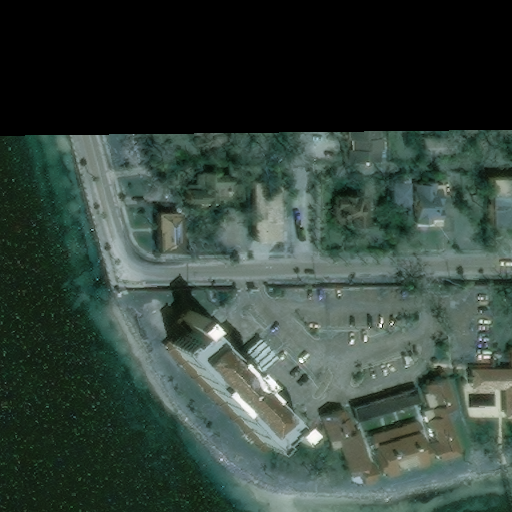

In [ ]:
cv2_imshow(image)

In [ ]:
print(mask.shape)

torch.Size([5, 512, 512])


In [ ]:
mask = mask.permute(1,2,0)

In [ ]:
print(mask.shape)

torch.Size([512, 512, 5])


In [ ]:
mask = reverse_one_hot(mask)

In [ ]:
mask = mask.numpy()

In [ ]:
mask = colour_code_segmentation(mask,select_class_rgb_values)

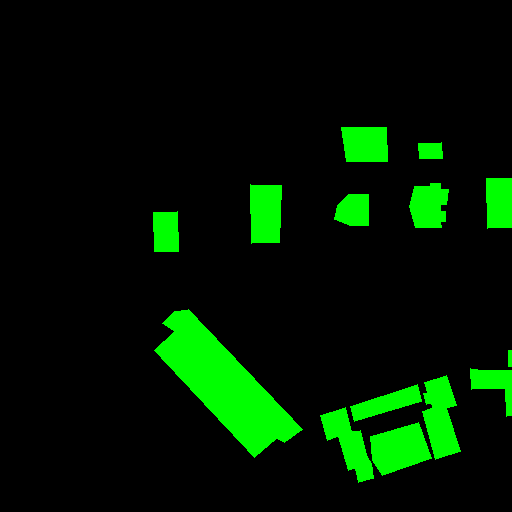

In [ ]:
cv2_imshow(mask)

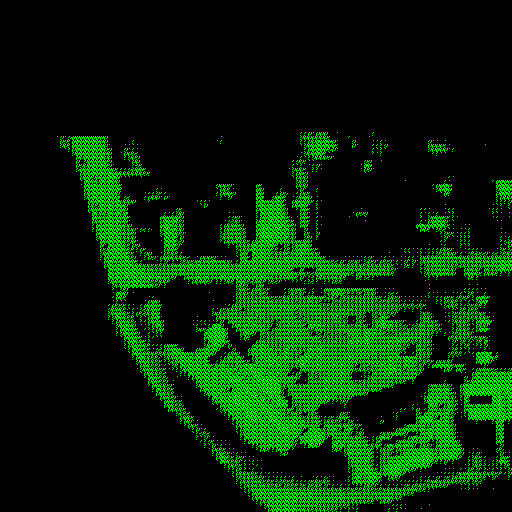

In [ ]:
cv2_imshow(logits_mask)

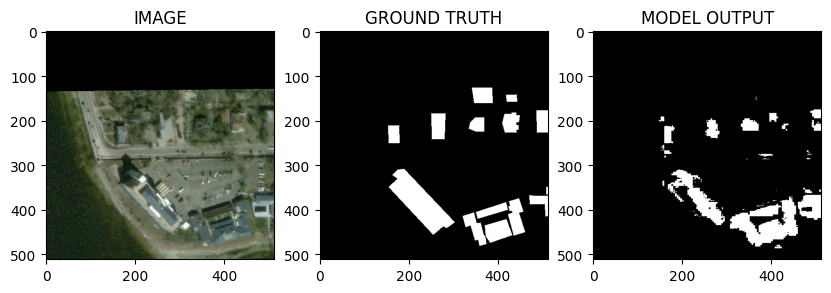

In [ ]:
helper.show_image(image, mask, pred_mask.detach().cpu().squeeze(0))